<a href="https://colab.research.google.com/github/leobioinf0/Supervisat_Classificacio/blob/main/S10_T01_Aprenentage_Supervisat.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# [**Supervised Classification**](https://github.com/leobioinf0/Supervisat_Classificacio)
Course: *Data Science amb Python*

Sprint: 10. Supervised Learning - classification 


Task: S10 T01: Supervised Learning - Classification 

Date: *2022-01-17*

[Leo Madsen](https://github.com/leobioinf0)



#### Exercises: 
- Level 1
    - Exercise 1: 
    
    Create at least three different classification models to try to best predict DelayedFlights.csv flight delay (ArrDelay). Consider whether the flight is late or not (ArrDelay> 0).
    - Exercise 2: 
    
    Compare classification models using accuracy, a confidence matrix, and other more advanced metrics.
    - Exercise 3: 
    
    Train them using the different parameters they support.
    - Exercise 4: 
    
    Compare your performance using the traint / test or cross-validation approach.
- Level 2
    - Exercise 5: 
    
    Perform some variable engineering process to improve prediction
- Level 3
    - Exercise 6: 
    
    Do not use the DepDelay variable when making predictions

# Prerequisites

## Upgrade modules

In [1]:
!pip install --upgrade pip
!pip install --upgrade lightgbm 
!pip install --upgrade xgboost
!pip install --upgrade feature-engine
!pip install --upgrade matplotlib
!pip install --upgrade scikit-learn
!pip install --upgrade numpy
!pip install --upgrade keras
!pip install --upgrade tensorflow
!pip install --upgrade pandas

## Load modules

In [2]:
## System
import os
import pickle
import glob

## Data treatment
import pandas as pd
import numpy as np
import datetime
import math 
from scipy.stats import sem

## Graphics
import missingno as msno #missing data visualizations
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image, display
from tqdm import tqdm_notebook
from google.colab import data_table

## Metrics
from sklearn.metrics import euclidean_distances
from sklearn.metrics import roc_auc_score
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import zero_one_loss
from sklearn.metrics import explained_variance_score
from sklearn.metrics import max_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import median_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import r2_score

## Data preprocessing
from feature_engine.creation import CyclicalTransformer
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import Binarizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder

## Linear Models
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import RidgeClassifierCV
from sklearn.linear_model import Perceptron
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.linear_model import SGDClassifier

## Preprocessing and modeling
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score

## Neural Network
from sklearn.neural_network import MLPRegressor
from sklearn.neural_network import MLPClassifier

## Tree Models
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import ExtraTreeClassifier

## Ensemble methods
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier

## Naive Bayes algorithms
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import GaussianNB

## Gradient boosting
from xgboost import XGBRegressor
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

## Gaussian Process
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF

## Support Vector Machine algorithms
from sklearn.svm import SVC
from sklearn.svm import LinearSVC 
from sklearn.svm import NuSVC 

## k-nearest neighbors algorithm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid

## semi-supervised learning algorithms.
from sklearn.semi_supervised import LabelSpreading
from sklearn.semi_supervised import LabelPropagation

## DummyClassifier makes predictions that ignore the input features.
from sklearn.dummy import DummyClassifier

## Calibration of predicted probabilities.
from sklearn.calibration import CalibratedClassifierCV

## Linear Discriminant Analysis and Quadratic Discriminant Analysis
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

## Warnings configuration
import warnings
warnings.filterwarnings('ignore')

In [3]:
data_table.enable_dataframe_formatter()
data_table.DataTable.max_columns = 50
data_table.DataTable.num_rows_per_page = 55
data_table.DataTable.max_rows = 56

In [4]:
%matplotlib inline
sns.set(rc={'figure.figsize':(15,7)})

## Define functions

In [5]:
def timenow():
    '''
    Return the current time in hours, minutes and seconds.
    '''
    return datetime.datetime.now().time().replace(microsecond=0)

def mk_dir(name):
    '''
    Create directory with the name passed in the case that it does not exist and return its full path.
    '''
    path = os.path.join(os.getcwd(), name)
    if not os.path.exists(path):
        try:
            os.makedirs(path, 0o700)
        except OSError as e:
            if e.errno != errno.EEXIST:
                raise
        print("Directory created: {}".format(path))
    else:
        print("Directory already existing: {}".format(path))
    return path

def rounder(n):
    """
    Round up to the first digit that is not zero
    """
    if n == 0:
        return n
    else:
        k = 1 - int(math.log10(n))
        return round(n, 1 if n > 1 else k)

def describer(dataframe):
    """
    Description of dataframe
    """
    desc_df = round(dataframe.describe(include="all"),2).T
    desc_df["unique"]=dataframe.nunique()
    desc_df["NullAny"]= dataframe.isnull().any()
    desc_df["NullSum"]=dataframe.isnull().sum()
    desc_df["NullPct"]=(dataframe.isnull().sum()/len(dataframe)*100).apply(rounder)
    desc_df["dtypes"]=dataframe.dtypes
    desc_df.sort_values(by="dtypes", inplace=True)
    return(desc_df)


def kfcv_evaluator(X, y, model, n_s):
    '''
    Evaluate a R2 score by K-Folds cross-validation of a given model.
    '''
    # prepare the cross-validation procedure
    cv = KFold(n_splits=n_s, random_state=1, shuffle=True)
    # evaluate model
    scores = cross_val_score(model, X, y, scoring='r2', cv=cv, verbose=3)
    return scores.round(4)

def kfcv_evaluator_class(X, y, model, n_s):
    '''
    Evaluate a Accuracy score by K-Folds cross-validation of a given model.
    '''
    # prepare the cross-validation procedure
    cv = KFold(n_splits=n_s, random_state=1, shuffle=True)
    # evaluate model
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv)
    return scores.round(4)

def rkfcv_evaluator(X, y, model, n_s, n_r):
    '''
    Evaluate a R2 score by  Repeated K-Folds cross-validation of a given model.
    '''
    cv = RepeatedKFold(n_splits=n_s, n_repeats=n_r, random_state=1)
    scores = cross_val_score(model, X, y, scoring='r2', cv=cv, verbose=3)
    return scores.round(4)

def rkfcv_evaluator_class(X, y, model, n_s, n_r):
    '''
    Evaluate a Accuracy score by  Repeated K-Folds cross-validation of a given model.
    '''
    cv = RepeatedKFold(n_splits=n_s, n_repeats=n_r, random_state=1)
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv)
    return scores.round(4)

def numToTime(x):
    """
    Convert aeronautical time to datetime.time object
    """
    from datetime import time
    if pd.isnull(x):
        return np.nan
    else:
        x = str(int(x))
        h = x[:-2]
        if h == "" or h == "24":
            h = "0"
        m = x[-2:]
        return time(int(h), int(m))

def to_flat(regular_list):
    '''
    Flatten a given list.
    '''
    flat_list = [item for sublist in regular_list for item in sublist]
    return(flat_list)

def class_metrics(model, name, X_train, X_test, y_train, y_test, plt_path):
    '''
    Evaluate a classification model and calculate various metrics. Return the metrics in a dictionary
    '''
    y_pred = model.predict(X_test)
    conf_matrix = confusion_matrix(y_test,y_pred)
    
    scores = {'Model': name,
        'Accuracy':accuracy_score(y_test,y_pred).round(4),
        'B_Accuracy':balanced_accuracy_score(y_test,y_pred).round(4),
        'F1_Score':f1_score(y_test,y_pred).round(4),
        'Precision':precision_score(y_test,y_pred).round(4),
        'Recall':recall_score(y_test,y_pred).round(4),
        'Specificity' : recall_score(y_test, y_pred, pos_label=0).round(4),
        'FP_rate' : (1 - recall_score(y_test, y_pred, pos_label=0)).round(4),
        'Misclass_rate' : zero_one_loss(y_test, y_pred).round(4),
        'Misclass' : zero_one_loss(y_test, y_pred, normalize=False).round(4),
        'TP' : conf_matrix[1, 1].round(4),
        'TN' : conf_matrix[0, 0].round(4),
        'FP' : conf_matrix[0, 1].round(4),
        'FN' : conf_matrix[1, 0].round(4)}
    
    print("Confusion matrix :\n{}".format(conf_matrix))

    conf_matrix = confusion_matrix(y_test,y_pred,normalize='true')
    print("Normalized Confusion matrix:\n{}".format(conf_matrix))
    

    scores_table=pd.DataFrame(data=scores.items(), columns=["METRIC", "VALUES"])
    desc_table=pd.DataFrame(data=model.get_params().items(), columns=["PARAMS", "VALUES"])

    ax= plt.subplot()
    sns.heatmap(conf_matrix, annot=True, fmt='g', ax=ax, square=True, ); 
    desc_t = ax.table(cellText=desc_table.values,
                colLabels=desc_table.columns,
                bbox=[1.5, 0, 1.0, 1.0])
    desc_t.auto_set_column_width(col=list(range(len(desc_table.columns))))

    scores_t = ax.table(cellText=scores_table.values,
                colLabels=scores_table.columns,
                bbox=[-1.1, 0, 1.0, 1.0])
    scores_t.auto_set_column_width(col=list(range(len(scores_table.columns))))
    plt.title(name)
    plt.savefig(plt_path)
    plt.show()



    return scores

def reg_metrics(name, model, X_test, y_true):
    '''
    Evaluate a regression model and calculate various metrics. Return the metrics in a dataframe
    '''
    y_pred = model.predict(X_test)
    me = max_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    ev = explained_variance_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    medae = median_absolute_error(y_true, y_pred)
    reg_metrics_df = pd.DataFrame(data=[[r2,mse, mae,  mape, ev,me, medae]], 
                                  columns=["R2","MSE", "MAE", "MAPE", "EV", "ME", "MedAE"], 
                                  index=[name])
    return(reg_metrics_df)

def rkfcv_to_df(results):
    """
    Tabulate the scores of a Given  dictionary with Repeated K-Folds cross-validation scores.
    And save the table to a .csv file. 
    """
    df = pd.DataFrame.from_dict({(i,j): rkfcv_results[i][j] 
                        for i in rkfcv_results.keys() 
                        for j in rkfcv_results[i].keys()},
                    orient='index')
    df.reset_index(level=[0,1], inplace=True)
    df.columns = ["model","n_splits"] + [str(i) for i in n_repeats]
    df.to_csv(rkfcv_filename_path+".csv")
    return df
    
def plot_rkfcv(df):
    """
    Boxplot of Repeated K-Folds cross-validation scores.
    """
    fig, axes = plt.subplots(nrows=df.model.nunique(), 
                            ncols=df.n_splits.nunique(),
                            figsize=(df.n_splits.nunique()*8,df.model.nunique()*4),
                            sharex=True, sharey = True)

    for i, modl in enumerate(df.model.unique()):
        for j, splts in enumerate(df.n_splits.unique()):
            data = df[(df.model==modl) & (df.n_splits==splts)][[str(i) for i in n_repeats]].apply(to_flat)
            axes[i][j].boxplot(data, showmeans=True)
            ttl="{} ({} splits)".format(modl, splts)
            axes[i][j].set_title(ttl, fontweight = "bold")

    fig.suptitle(t='Number of Repeats Performance Comparison in \nRepeated k-Fold Cross-Validation ', 
                fontsize = 18, fontweight = "bold")
    fig.supxlabel('Nº repeats',fontsize = 18, fontweight = "bold")
    fig.supylabel('Score',fontsize = 18, fontweight = "bold")

    filename = "All_Repeated_K-fold_cv.png"
    plt.savefig(os.path.join(exe04_plots_path, filename))
    plt.show()

## Directories

In [6]:
# working directory

cwd = './'
#cwd = '/content/drive/MyDrive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/'
os.chdir(cwd)
print(os.getcwd())

/content/drive/MyDrive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio


# Read Data

In [7]:
# Read a smaller version of the dataset from raw.githubusercontent
filepath = "https://raw.githubusercontent.com/leobioinf0/Supervitat_Regressio/main/DelayedFlights3mb.csv"
df = pd.read_csv(filepath, index_col=0)
df.head()

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Dest,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
192313,2008,1,28,1,833.0,825,1122.0,1118,NW,282,N506US,109.0,113.0,90.0,4.0,8.0,MEM,DTW,610,8.0,11.0,0,N,0,NaN,NaN,NaN,NaN,NaN
139043,2008,7,27,7,1905.0,1815,1955.0,1910,MQ,3497,N842AE,50.0,55.0,32.0,45.0,50.0,DFW,SHV,190,4.0,14.0,0,N,0,8.0,0.0,0.0,0.0,37.0
28582,2008,10,8,3,1725.0,1550,2034.0,1847,OH,6779,N924CA,189.0,177.0,131.0,107.0,95.0,LGA,JAX,834,6.0,52.0,0,N,0,0.0,0.0,12.0,0.0,95.0
157571,2008,8,4,1,1836.0,1825,2141.0,2140,WN,618,N750SA,125.0,135.0,113.0,1.0,11.0,SMF,DEN,910,6.0,6.0,0,N,0,NaN,NaN,NaN,NaN,NaN
166602,2008,1,17,4,1614.0,1555,1718.0,1712,XE,2818,N14991,64.0,77.0,49.0,6.0,19.0,IAH,JAN,351,4.0,11.0,0,N,0,NaN,NaN,NaN,NaN,NaN


____________________
This dataset is composed by the following variables: 

1.	**Year**	2016
2.	**Month**	1-12
3.	**DayofMonth**	1-31
4.	**DayOfWeek**	1 (Monday) - 7 (Sunday)
5.	**DepTime**	actual departure time (local, hhmm)
6.	**CRSDepTime**	scheduled departure time (local, hhmm)
7.	**ArrTime**	actual arrival time (local, hhmm)
8.	**CRSArrTime**	scheduled arrival time (local, hhmm)
9.	**UniqueCarrier**	unique carrier code
10.	**FlightNum**	flight number
11.	**TailNum** plane tail number: aircraft registration, unique aircraft identifier
12.	**ActualElapsedTime**	in minutes
13.	**CRSElapsedTime**	in minutes
14.	**AirTime**	in minutes
15.	**ArrDelay**	arrival delay, in minutes: **A flight is counted as "on time" if it operated less than 15 minutes later the scheduled time shown in the carriers' Computerized Reservations Systems (CRS).** 
16.	**DepDelay**	departure delay, in minutes
17.	**Origin**	origin IATA airport code
18.	**Dest**	destination IATA airport code
19.	**Distance**	in miles
20.	**TaxiIn**	taxi in time, in minutes
21.	**TaxiOut**	taxi out time in minutes
22.	**Cancelled**	*was the flight cancelled
23.	**CancellationCode**	reason for cancellation (A = carrier, B = weather, C = NAS, D = security)
24.	**Diverted**	1 = yes, 0 = no
25.	**CarrierDelay**	in minutes: Carrier delay is within the control of the air carrier. Examples of occurrences that may determine carrier delay are: aircraft cleaning, aircraft damage, awaiting the arrival of connecting passengers or crew, baggage, bird strike, cargo loading, catering, computer, outage-carrier equipment, crew legality (pilot or attendant rest), damage by hazardous goods, engineering inspection, fueling, handling disabled passengers, late crew, lavatory servicing, maintenance, oversales, potable water servicing, removal of unruly passenger, slow boarding or seating, stowing carry-on baggage, weight and balance delays.
26.	**WeatherDelay**	in minutes: Weather delay is caused by extreme or hazardous weather conditions that are forecasted or manifest themselves on point of departure, enroute, or on point of arrival.
27.	**NASDelay**	in minutes: Delay that is within the control of the National Airspace System (NAS) may include: non-extreme weather conditions, airport operations, heavy traffic volume, air traffic control, etc. 
28.	**SecurityDelay**	in minutes: Security delay is caused by evacuation of a terminal or concourse, re-boarding of aircraft because of security breach, inoperative screening equipment and/or long lines in excess of 29 minutes at screening areas.
29.	**LateAircraftDelay**	in minutes: Arrival delay at an airport due to the late arrival of the same aircraft at a previous airport. The ripple effect of an earlier delay at downstream airports is referred to as delay propagation.

In [8]:
# Full description of dataframe
describer(df)

,count,unique,top,freq,mean,std,min,25%,50%,75%,max,NullAny,NullSum,NullPct,dtypes
Year,20336.0,1,NaN,NaN,2008.0,0.0,2008.0,2008.0,2008.0,2008.0,2008.0,False,0,0.000,int64
Month,20336.0,12,NaN,NaN,6.11,3.48,1.0,3.0,6.0,9.0,12.0,False,0,0.000,int64
DayofMonth,20336.0,31,NaN,NaN,15.75,8.78,1.0,8.0,16.0,23.0,31.0,False,0,0.000,int64
DayOfWeek,20336.0,7,NaN,NaN,3.98,2.0,1.0,2.0,4.0,6.0,7.0,False,0,0.000,int64
CRSDepTime,20336.0,1013,NaN,NaN,1465.7,426.15,1.0,1130.75,1508.0,1815.0,2359.0,False,0,0.000,int64
CRSArrTime,20336.0,1187,NaN,NaN,1630.69,467.13,1.0,1320.0,1705.0,2013.0,2359.0,False,0,0.000,int64
FlightNum,20336.0,5647,NaN,NaN,2213.61,1958.18,1.0,619.0,1553.0,3537.25,7828.0,False,0,0.000,int64
Diverted,20336.0,2,NaN,NaN,0.0,0.06,0.0,0.0,0.0,0.0,1.0,False,0,0.000,int64
Cancelled,20336.0,2,NaN,NaN,0.0,0.02,0.0,0.0,0.0,0.0,1.0,False,0,0.000,int64
Distance,20336.0,1251,NaN,NaN,767.62,574.86,49.0,345.0,607.0,997.0,4962.0,False,0,0.000,int64


# Preprocessing

## Missing in ArrDelay

- We eliminate the flights that do not have data in the response variable.

In [9]:
df = df[df['ArrDelay'].notna()].copy()

## Cancelled/CancellationCode

- First we eliminate all the flights that were canceled since they do not provide information.
- Then we remove the columns ["Canceled", "CancellationCode"]

In [10]:
df = df[df.Cancelled==0].copy()
df.drop(labels=["Cancelled", "CancellationCode"], axis=1, inplace=True)

## Diverted
- First we eliminate all the flights that were diverted since they do not provide information.
- Then we remove the column ["Diverted"]

In [11]:
df = df[df.Diverted==0].copy()
df.drop(labels=["Diverted"], axis=1, inplace=True)

## Reindex

In [12]:
df.reset_index(inplace=True, drop=True)

## Missing values

In [13]:
df.isna().any()

Year                 False
Month                False
DayofMonth           False
DayOfWeek            False
DepTime              False
CRSDepTime           False
ArrTime              False
CRSArrTime           False
UniqueCarrier        False
FlightNum            False
TailNum              False
ActualElapsedTime    False
CRSElapsedTime       False
AirTime              False
ArrDelay             False
DepDelay             False
Origin               False
Dest                 False
Distance             False
TaxiIn               False
TaxiOut              False
CarrierDelay          True
WeatherDelay          True
NASDelay              True
SecurityDelay         True
LateAircraftDelay     True
dtype: bool

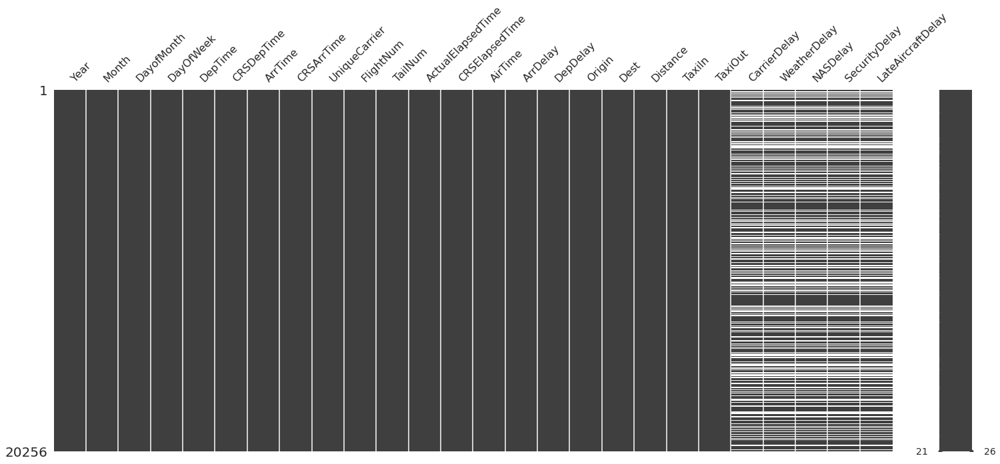

In [14]:
msno.matrix(df);

The variables that still contain nan are the ones that describe the delay.
We assume that these nan are due to the "ArrDelay" being low enough not to be described, so we will replace them with zeros.


In [15]:
df.fillna(0, inplace=True)

In [16]:
df.isnull().sum().sum()

0

## Target Binarizing
 
Create a variable Target depending on whether the flight was late or not (ArrDelay> 0)

In [17]:
# 1 Means Delay, 0 Means no Delay
transformer = Binarizer()
binary = transformer.fit_transform(df[['ArrDelay']])
df['ArrDelay'] = pd.Series(binary.flatten()).astype(int) #df['ArrDelay'] = df['ArrDelay'].apply(lambda x: 0 if x <=0 else 1)

We can see that the dataset is unbalanced. Although we know that this is a problem, we will solve it in exercise 5, so we can see the effect that the balance of the data has on the predictions.

In [18]:
print(df['ArrDelay'].value_counts(normalize=True).round(2))
print(df['ArrDelay'].value_counts())

1    0.89
0    0.11
Name: ArrDelay, dtype: float64
1    18092
0     2164
Name: ArrDelay, dtype: int64


## Save Preproceced data.

In [19]:
df.to_csv("DelayedFlights_Processed.csv")

#  Exercise 1: 
  - Create at least three different classification models to try to best predict DelayedFlights.csv flight delay (ArrDelay). Consider whether the flight is late or not (ArrDelay> 0).

Classification models we are going to use:

In [20]:
classifiers = [DummyClassifier(),
               KNeighborsClassifier(),
               SVC(),
               DecisionTreeClassifier(),
               RandomForestClassifier(),
               MLPClassifier(),
               AdaBoostClassifier(),
               GaussianNB(),
               QuadraticDiscriminantAnalysis(),
               NearestCentroid(),
               BaggingClassifier(),
               Perceptron(),
               PassiveAggressiveClassifier(),
               ExtraTreeClassifier(),
               LabelSpreading(),
               LabelPropagation(),
               LogisticRegression(),
               SGDClassifier(),
               LinearDiscriminantAnalysis(),
               CalibratedClassifierCV(),
               RidgeClassifier(),
               RidgeClassifierCV(),
               LinearSVC(),
               BernoulliNB(),
               ExtraTreesClassifier(),
               LGBMClassifier(),
               XGBClassifier()]

We read the already processed data

In [21]:
df = pd.read_csv("DelayedFlights_Processed.csv", index_col=0)

We create the directory in which we will save the results.

In [22]:
exe01_path = mk_dir("exe01")
exe01_models_path = mk_dir("exe01/exe01_models")
exe01_tables_path = mk_dir("exe01/exe01_tables")
exe01_plots_path = mk_dir("exe01/exe01_plots")

Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe01
Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe01/exe01_models
Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe01/exe01_tables
Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe01/exe01_plots


Transform Categorical Variables into ordinal values

In [23]:
encoder = OrdinalEncoder()
df[['UniqueCarrier', 'Origin', 'Dest', 'TailNum']]= encoder.fit_transform(df[['UniqueCarrier', 'Origin', 'Dest', 'TailNum']])

Divide data into Explanatory and Response variables. 

In [24]:
X = df.drop(['ArrDelay'], axis = 'columns')
y = df['ArrDelay']

We scale the data and divide it into training and test sets

In [25]:
X = StandardScaler().fit_transform(X)

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=130)



1.   For each model we create the name of the model and the name of the file where the trained model will be saved.
2.   If the file already exists we load it and if it does not exist we train it and save it.

3.  Then we evaluate the model and store the metrics in a list.

4.  Each model with its metrics are tabulated in a dataframe and sorted in descending order according to its Accuracy.

5.  Finally we save the table in a file.

Train models and make predictions.


23:17:38: Loading model:	01-DummyClassifier.pkl

23:17:38: Evaluate model:

Confusion matrix :
[[   0  855]
 [   0 7248]]
Normalized Confusion matrix:
[[0. 1.]
 [0. 1.]]


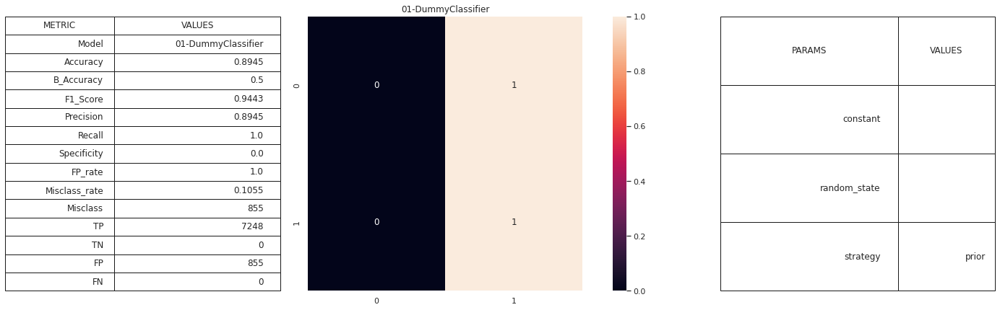


23:17:39: Loading model:	01-KNeighborsClassifier.pkl

23:17:39: Evaluate model:

Confusion matrix :
[[ 104  751]
 [ 233 7015]]
Normalized Confusion matrix:
[[0.12163743 0.87836257]
 [0.0321468  0.9678532 ]]


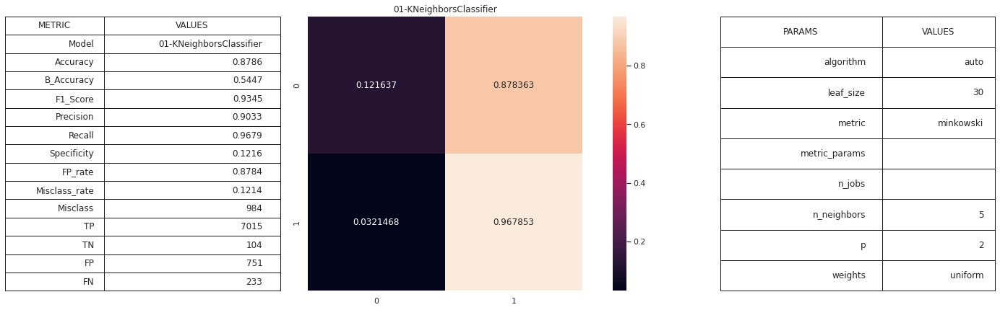


23:17:43: Loading model:	01-SVC.pkl

23:17:43: Evaluate model:

Confusion matrix :
[[  93  762]
 [   6 7242]]
Normalized Confusion matrix:
[[1.08771930e-01 8.91228070e-01]
 [8.27814570e-04 9.99172185e-01]]


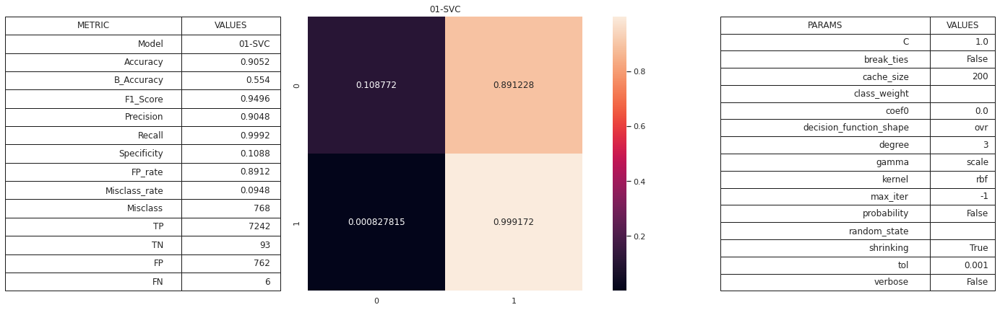


23:17:46: Loading model:	01-DecisionTreeClassifier.pkl

23:17:46: Evaluate model:

Confusion matrix :
[[ 551  304]
 [ 289 6959]]
Normalized Confusion matrix:
[[0.64444444 0.35555556]
 [0.03987307 0.96012693]]


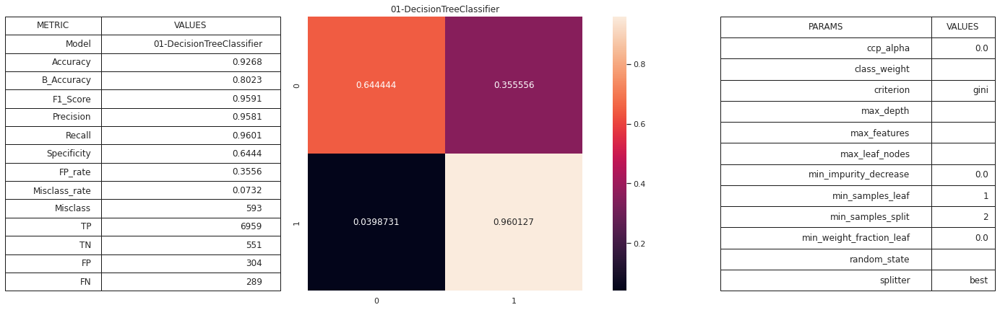


23:17:47: Loading model:	01-RandomForestClassifier.pkl

23:17:47: Evaluate model:

Confusion matrix :
[[ 347  508]
 [ 112 7136]]
Normalized Confusion matrix:
[[0.40584795 0.59415205]
 [0.01545254 0.98454746]]


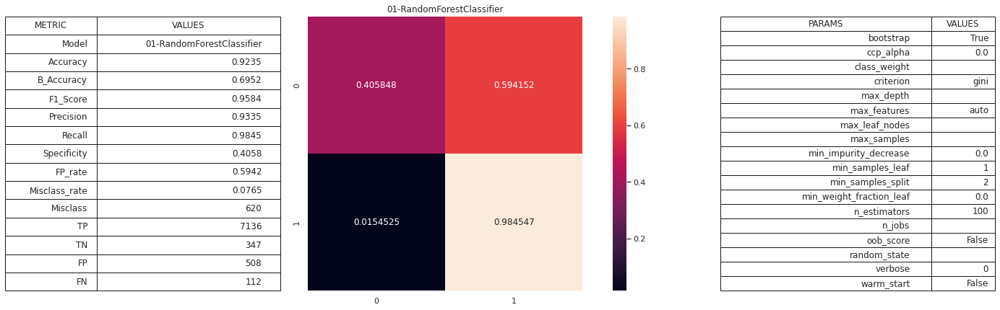


23:17:48: Loading model:	01-MLPClassifier.pkl

23:17:48: Evaluate model:

Confusion matrix :
[[ 790   65]
 [  30 7218]]
Normalized Confusion matrix:
[[0.92397661 0.07602339]
 [0.00413907 0.99586093]]


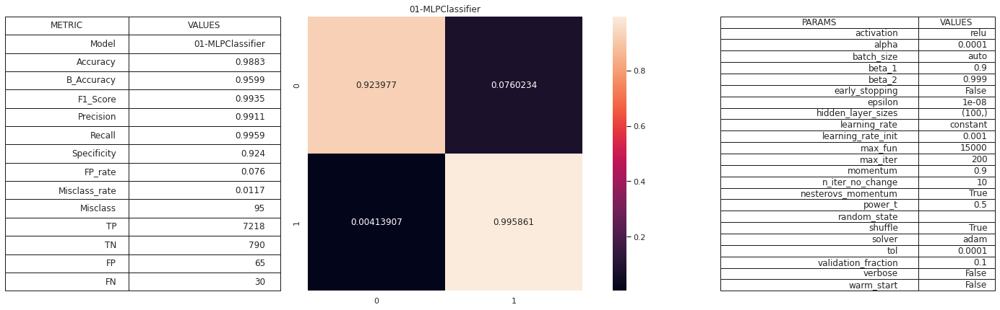


23:17:50: Loading model:	01-AdaBoostClassifier.pkl

23:17:50: Evaluate model:

Confusion matrix :
[[ 352  503]
 [ 177 7071]]
Normalized Confusion matrix:
[[0.41169591 0.58830409]
 [0.02442053 0.97557947]]


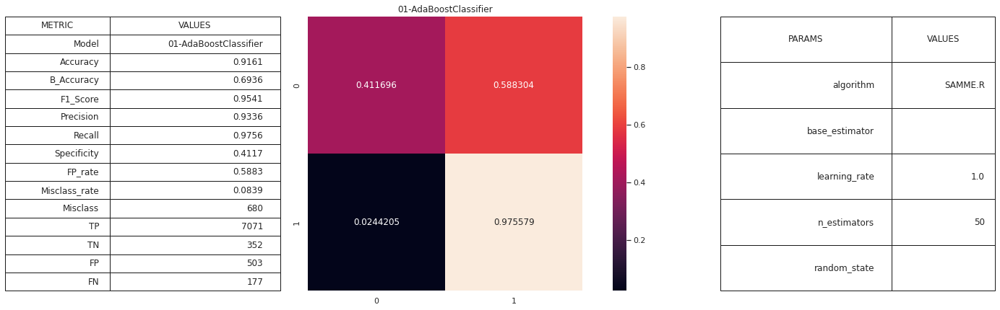


23:17:51: Loading model:	01-GaussianNB.pkl

23:17:51: Evaluate model:

Confusion matrix :
[[ 855    0]
 [1997 5251]]
Normalized Confusion matrix:
[[1.         0.        ]
 [0.27552428 0.72447572]]


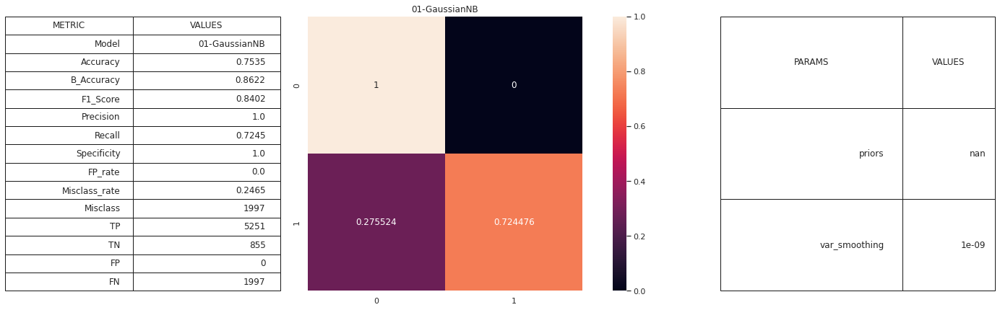


23:17:51: Loading model:	01-QuadraticDiscriminantAnalysis.pkl

23:17:51: Evaluate model:

Confusion matrix :
[[ 855    0]
 [7248    0]]
Normalized Confusion matrix:
[[1. 0.]
 [1. 0.]]


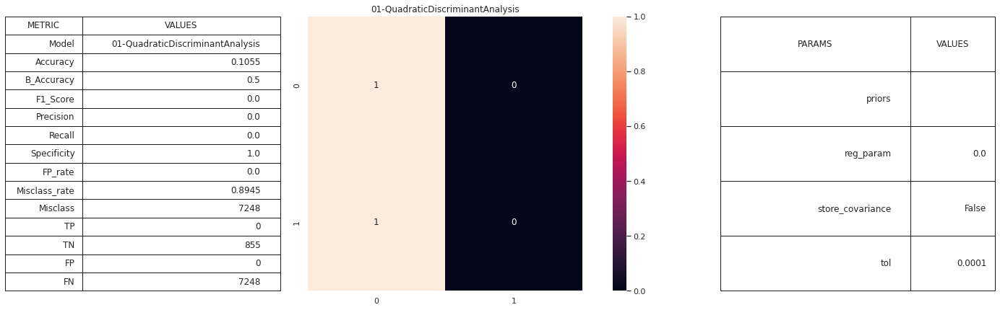


23:17:52: Loading model:	01-NearestCentroid.pkl

23:17:52: Evaluate model:

Confusion matrix :
[[ 594  261]
 [2074 5174]]
Normalized Confusion matrix:
[[0.69473684 0.30526316]
 [0.2861479  0.7138521 ]]


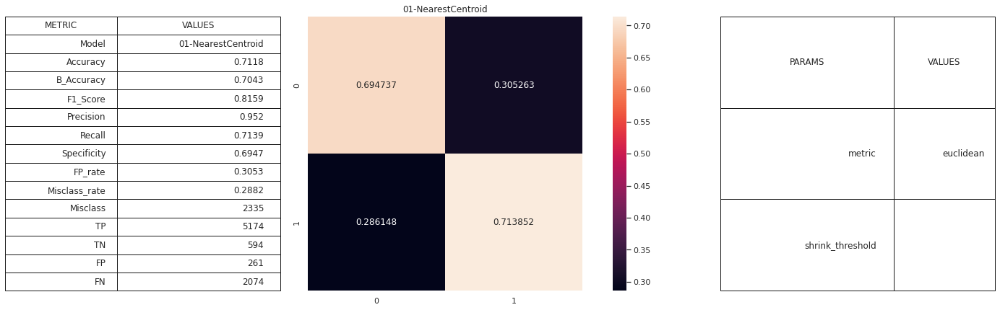


23:17:53: Loading model:	01-BaggingClassifier.pkl

23:17:53: Evaluate model:

Confusion matrix :
[[ 609  246]
 [ 227 7021]]
Normalized Confusion matrix:
[[0.7122807  0.2877193 ]
 [0.03131898 0.96868102]]


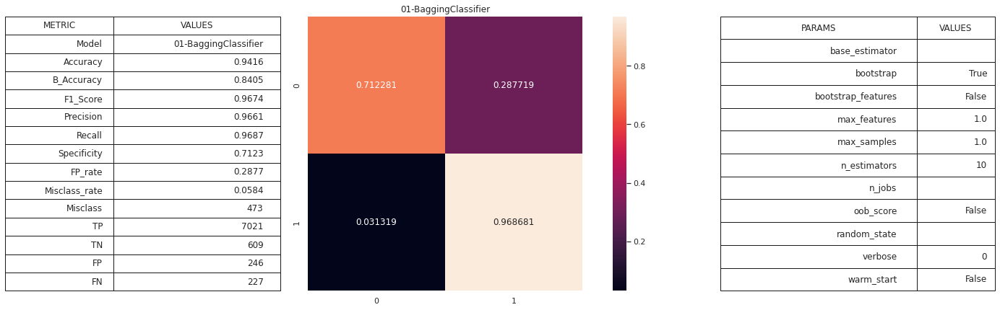


23:17:54: Loading model:	01-Perceptron.pkl

23:17:54: Evaluate model:

Confusion matrix :
[[ 684  171]
 [  16 7232]]
Normalized Confusion matrix:
[[0.8        0.2       ]
 [0.00220751 0.99779249]]


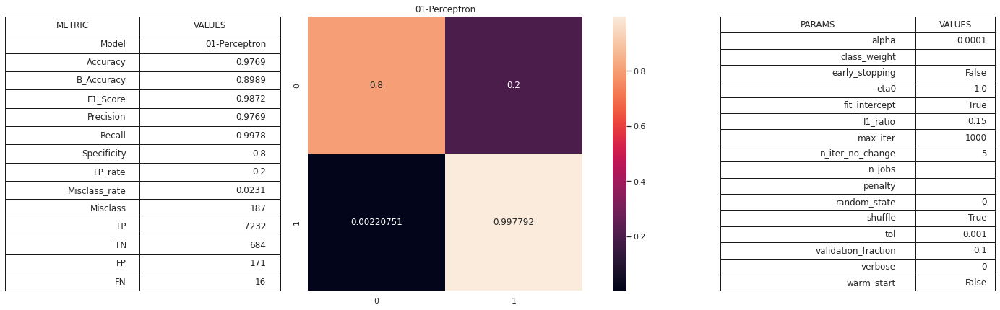


23:17:56: Loading model:	01-PassiveAggressiveClassifier.pkl

23:17:56: Evaluate model:

Confusion matrix :
[[ 809   46]
 [  74 7174]]
Normalized Confusion matrix:
[[0.94619883 0.05380117]
 [0.01020971 0.98979029]]


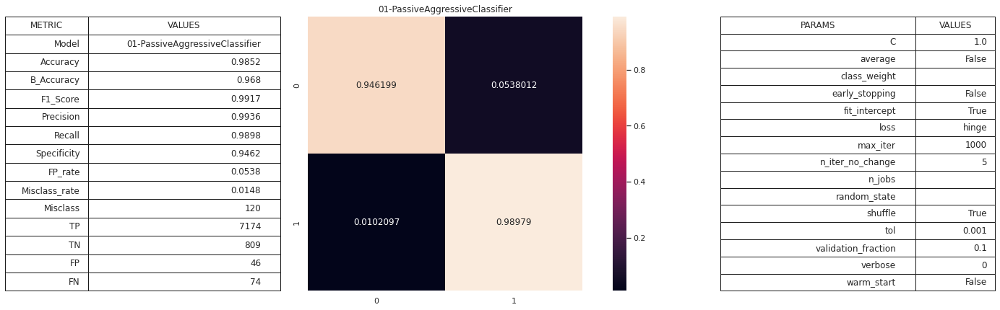


23:17:57: Loading model:	01-ExtraTreeClassifier.pkl

23:17:57: Evaluate model:

Confusion matrix :
[[ 322  533]
 [ 589 6659]]
Normalized Confusion matrix:
[[0.37660819 0.62339181]
 [0.0812638  0.9187362 ]]


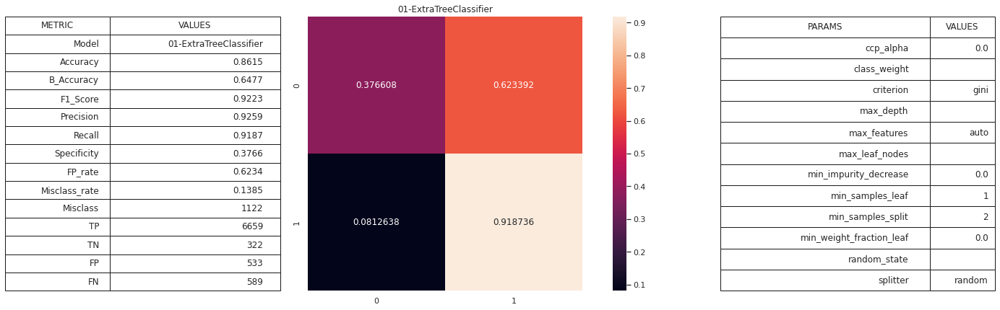


23:17:58: Loading model:	01-LabelSpreading.pkl

23:17:58: Evaluate model:

Confusion matrix :
[[ 264  591]
 [ 779 6469]]
Normalized Confusion matrix:
[[0.30877193 0.69122807]
 [0.10747792 0.89252208]]


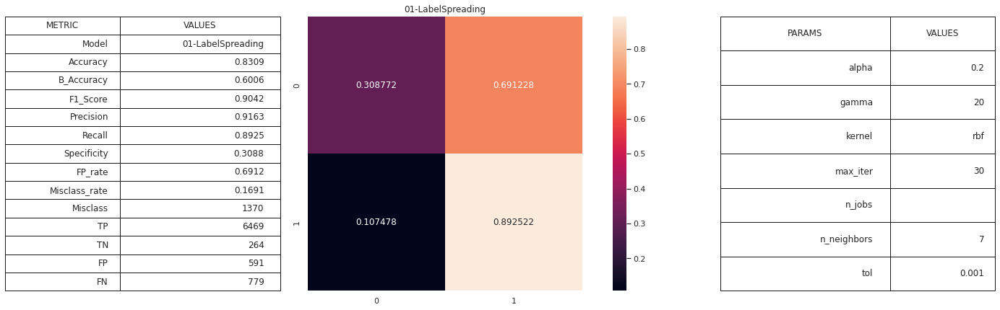


23:18:02: Loading model:	01-LabelPropagation.pkl

23:18:02: Evaluate model:

Confusion matrix :
[[ 265  590]
 [ 784 6464]]
Normalized Confusion matrix:
[[0.30994152 0.69005848]
 [0.10816777 0.89183223]]


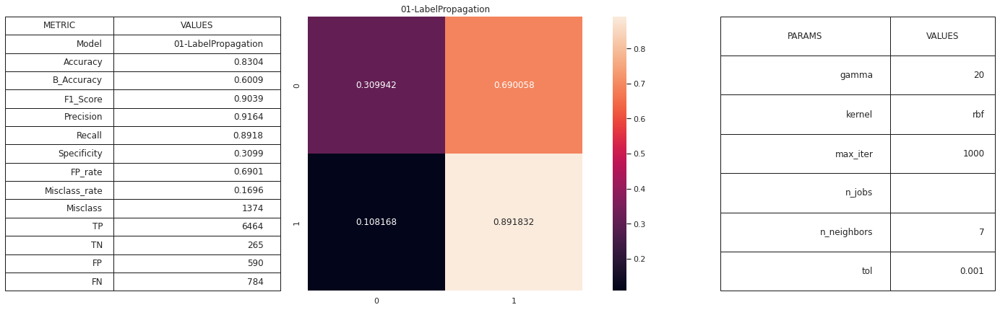


23:18:07: Loading model:	01-LogisticRegression.pkl

23:18:07: Evaluate model:

Confusion matrix :
[[ 714  141]
 [   1 7247]]
Normalized Confusion matrix:
[[8.35087719e-01 1.64912281e-01]
 [1.37969095e-04 9.99862031e-01]]


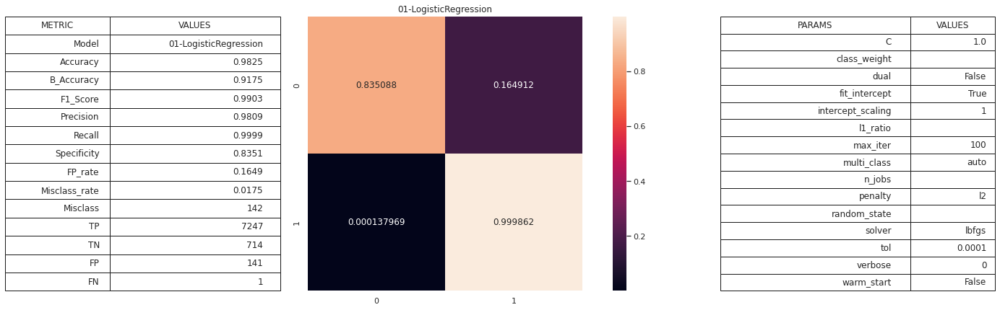


23:18:08: Loading model:	01-SGDClassifier.pkl

23:18:08: Evaluate model:

Confusion matrix :
[[ 764   91]
 [  96 7152]]
Normalized Confusion matrix:
[[0.89356725 0.10643275]
 [0.01324503 0.98675497]]


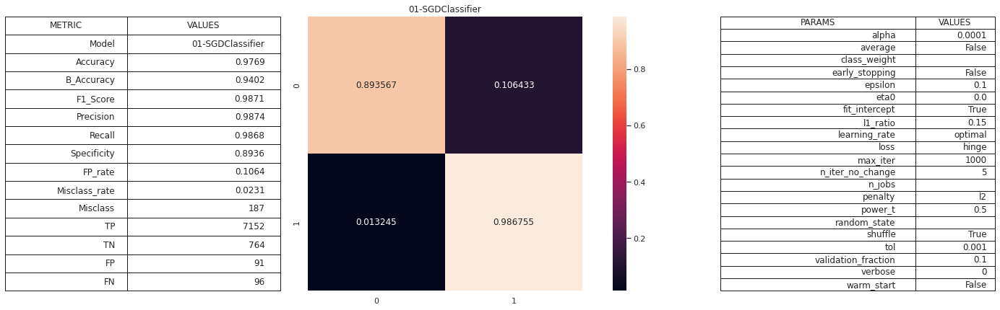


23:18:09: Loading model:	01-LinearDiscriminantAnalysis.pkl

23:18:09: Evaluate model:

Confusion matrix :
[[ 493  362]
 [   1 7247]]
Normalized Confusion matrix:
[[5.76608187e-01 4.23391813e-01]
 [1.37969095e-04 9.99862031e-01]]


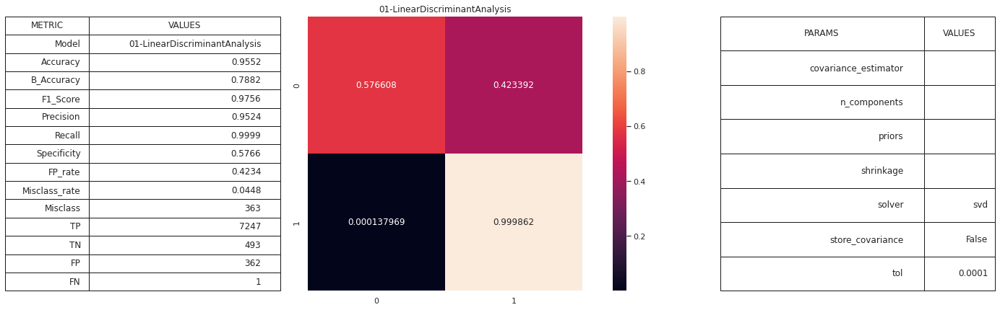


23:18:10: Loading model:	01-CalibratedClassifierCV.pkl

23:18:10: Evaluate model:

Confusion matrix :
[[  29  826]
 [   0 7248]]
Normalized Confusion matrix:
[[0.03391813 0.96608187]
 [0.         1.        ]]


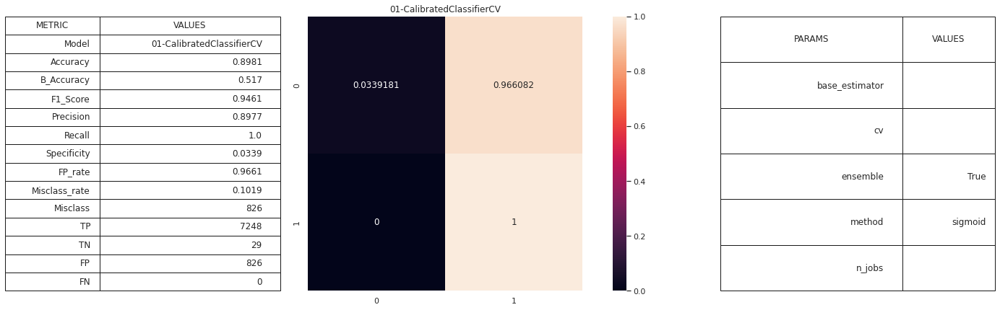


23:18:11: Loading model:	01-RidgeClassifier.pkl

23:18:11: Evaluate model:

Confusion matrix :
[[ 303  552]
 [   0 7248]]
Normalized Confusion matrix:
[[0.35438596 0.64561404]
 [0.         1.        ]]


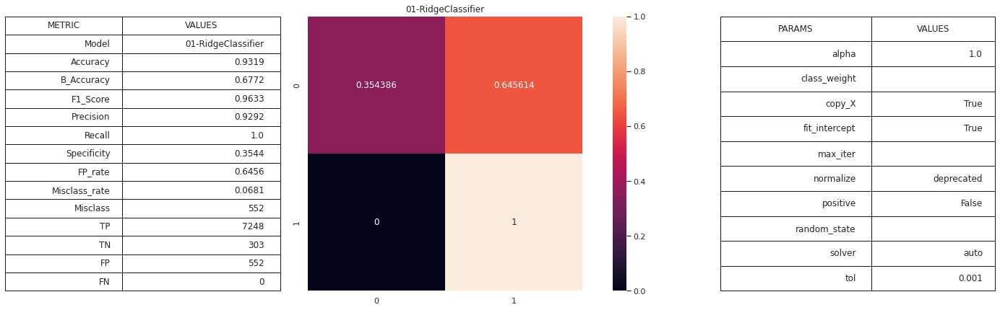


23:18:12: Loading model:	01-RidgeClassifierCV.pkl

23:18:12: Evaluate model:

Confusion matrix :
[[ 318  537]
 [   0 7248]]
Normalized Confusion matrix:
[[0.37192982 0.62807018]
 [0.         1.        ]]


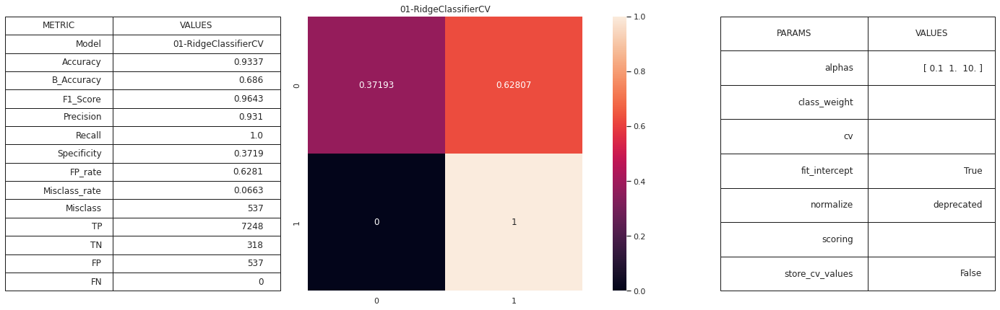


23:18:13: Loading model:	01-LinearSVC.pkl

23:18:13: Evaluate model:

Confusion matrix :
[[ 830   25]
 [   0 7248]]
Normalized Confusion matrix:
[[0.97076023 0.02923977]
 [0.         1.        ]]


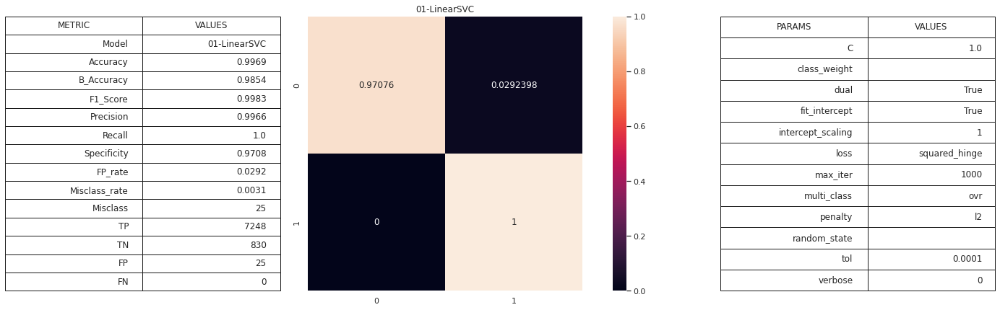


23:18:14: Loading model:	01-BernoulliNB.pkl

23:18:14: Evaluate model:

Confusion matrix :
[[ 397  458]
 [ 608 6640]]
Normalized Confusion matrix:
[[0.46432749 0.53567251]
 [0.08388521 0.91611479]]


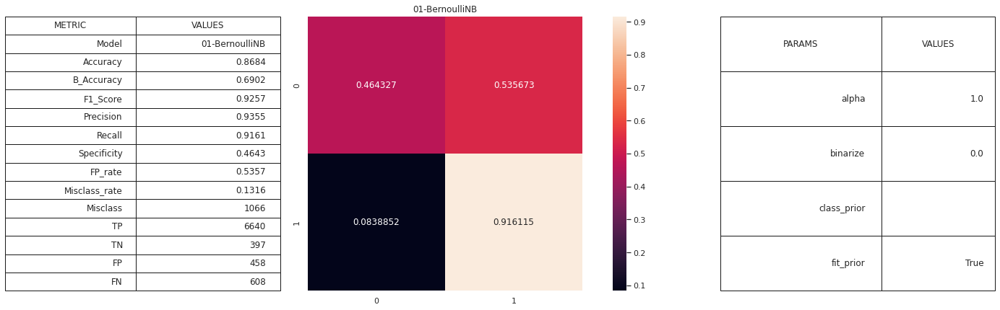


23:18:15: Loading model:	01-ExtraTreesClassifier.pkl

23:18:15: Evaluate model:

Confusion matrix :
[[ 171  684]
 [  38 7210]]
Normalized Confusion matrix:
[[0.2        0.8       ]
 [0.00524283 0.99475717]]


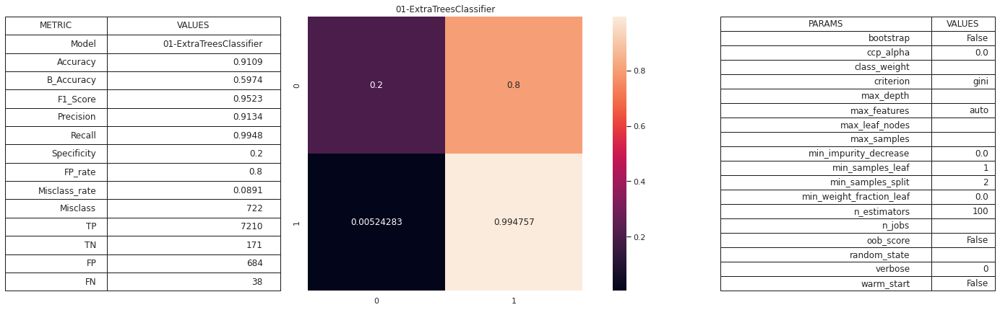


23:18:17: Loading model:	01-LGBMClassifier.pkl

23:18:17: Evaluate model:

Confusion matrix :
[[ 665  190]
 [  67 7181]]
Normalized Confusion matrix:
[[0.77777778 0.22222222]
 [0.00924393 0.99075607]]


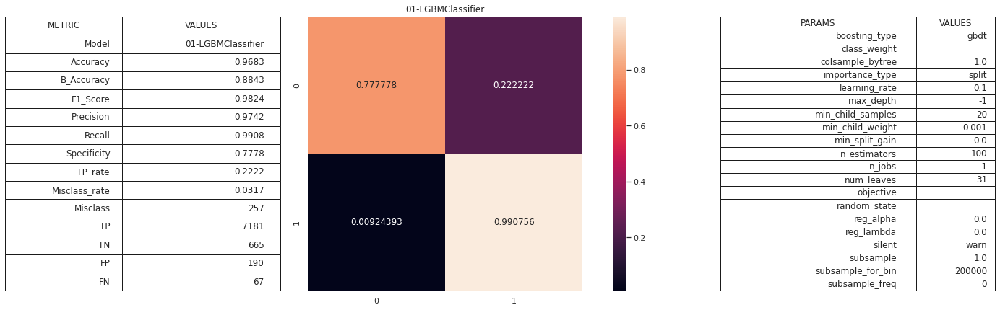


23:18:18: Loading model:	01-XGBClassifier.pkl

23:18:18: Evaluate model:

Confusion matrix :
[[ 663  192]
 [  90 7158]]
Normalized Confusion matrix:
[[0.7754386  0.2245614 ]
 [0.01241722 0.98758278]]


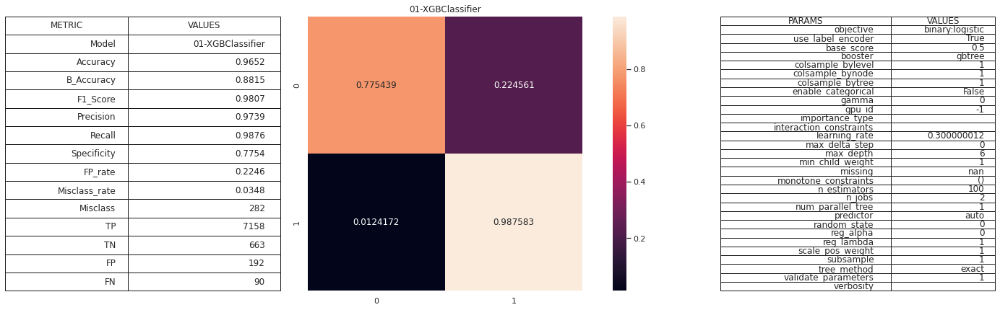

In [27]:
metrics_lst = []
for model in classifiers:
    # Model name 
    model_str = str(model).split("(")[0]
    model_name = '{}-{}'.format("01", model_str)
    # File name
    model_filename = model_name + ".pkl"
    model_filename_path = os.path.join(exe01_models_path, model_filename)
    if os.path.isfile(model_filename_path):
        # load existing model
        print("\n{}: Loading model:\t{}".format(timenow(), model_filename))
        model = pickle.load(open(model_filename_path, 'rb'))
    else:
        # Fit model
        print("\n{}: Start Fitting model:\t{}".format(timenow(), model_name))
        tiempo_inicio_fit = datetime.datetime.now()
        model.fit(X_train, y_train)
        fit_time = datetime.datetime.now() - tiempo_inicio_fit
        print("Fitting time:\t{}".format(fit_time))

        # save the model to disk
        pickle.dump(model, open(model_filename_path, 'wb'))

    # Evaluate model
    plt_path = os.path.join(exe01_plots_path, model_name + "_conf.png")
    print("\n{}: Evaluate model:\n".format(timenow()))
    metrics_lst.append(class_metrics(model, model_name, X_train, X_test, y_train, y_test, plt_path))
# Tabualate resulst
class_metrics_df = pd.DataFrame(metrics_lst)
class_metrics_df.set_index(keys="Model", inplace=True)
class_metrics_df.sort_values(by=["Accuracy"], ascending=False, inplace=True)
# Save results
class_metrics_df.to_csv(os.path.join(exe01_tables_path, "01-classification_metrics.csv"))

# Exercise 2: 
  - Compare classification models using accuracy, a confidence matrix, and other more advanced metrics.

We create the directory in which we will save the results.

In [28]:
exe02_path = mk_dir("exe02")
exe02_plots_path = mk_dir("exe02/exe02_plots")

Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe02
Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe02/exe02_plots


We read the results of exercise 1 and plot them.

In [29]:
metrics_01_path = os.path.join(exe01_tables_path, "01-classification_metrics.csv")
metrics_lst = []
for metrics_file in [metrics_01_path]:
    all_metrics = pd.read_csv(metrics_file, index_col=0)
    metrics_lst.append(all_metrics)
final_metrics_df_1 = pd.concat(metrics_lst)
data_table.enable_dataframe_formatter()
data_table.DataTable(final_metrics_df_1, num_rows_per_page=final_metrics_df_1.shape[0])

,Accuracy,B_Accuracy,F1_Score,Precision,Recall,Specificity,FP_rate,Misclass_rate,Misclass,TP,TN,FP,FN
Model,,,,,,,,,,,,,
01-LinearSVC,0.9969,0.9854,0.9983,0.9966,1.0000,0.9708,0.0292,0.0031,25,7248,830,25,0
01-MLPClassifier,0.9883,0.9599,0.9935,0.9911,0.9959,0.9240,0.0760,0.0117,95,7218,790,65,30
01-PassiveAggressiveClassifier,0.9852,0.9680,0.9917,0.9936,0.9898,0.9462,0.0538,0.0148,120,7174,809,46,74
01-LogisticRegression,0.9825,0.9175,0.9903,0.9809,0.9999,0.8351,0.1649,0.0175,142,7247,714,141,1
01-Perceptron,0.9769,0.8989,0.9872,0.9769,0.9978,0.8000,0.2000,0.0231,187,7232,684,171,16
01-SGDClassifier,0.9769,0.9402,0.9871,0.9874,0.9868,0.8936,0.1064,0.0231,187,7152,764,91,96
01-LGBMClassifier,0.9683,0.8843,0.9824,0.9742,0.9908,0.7778,0.2222,0.0317,257,7181,665,190,67
01-XGBClassifier,0.9652,0.8815,0.9807,0.9739,0.9876,0.7754,0.2246,0.0348,282,7158,663,192,90
01-LinearDiscriminantAnalysis,0.9552,0.7882,0.9756,0.9524,0.9999,0.5766,0.4234,0.0448,363,7247,493,362,1


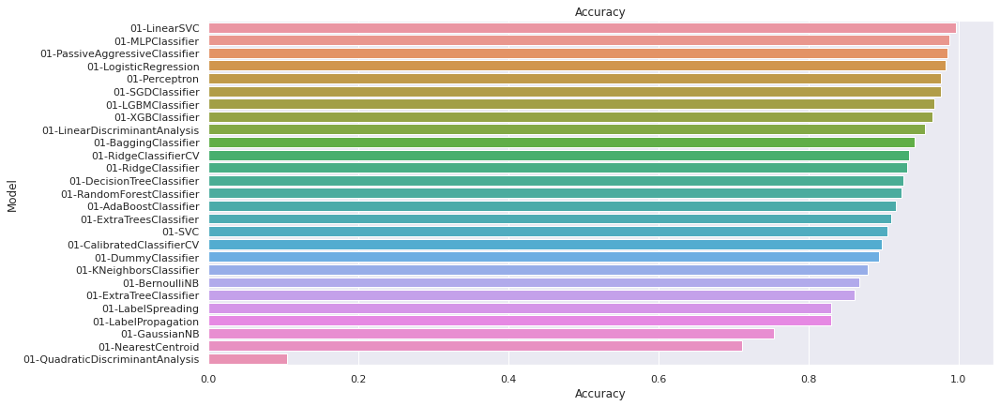

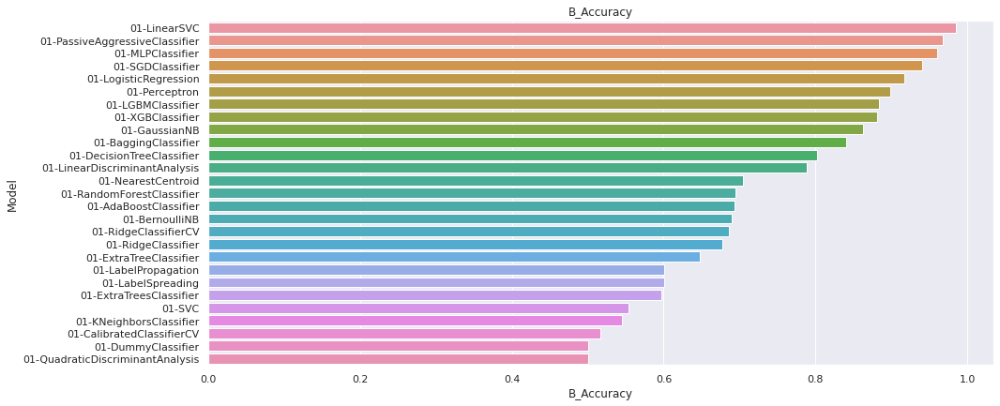

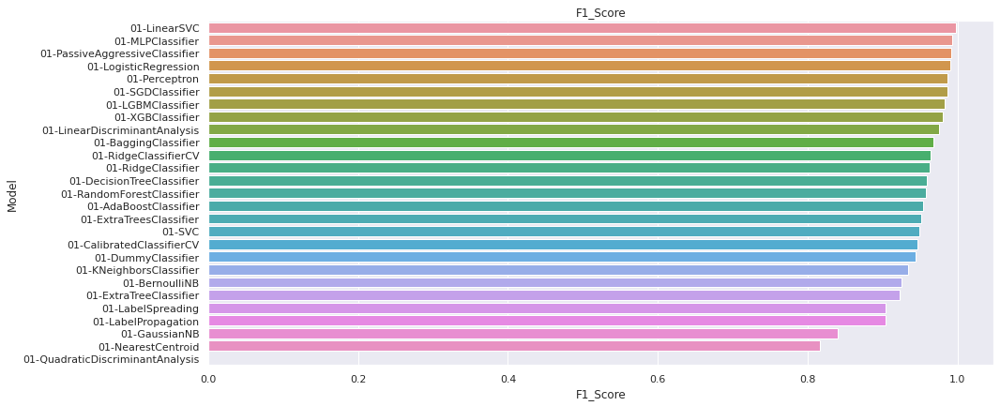

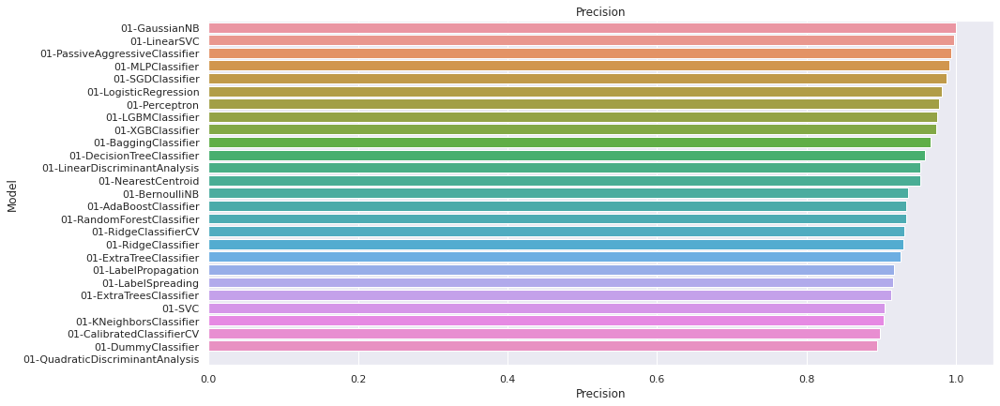

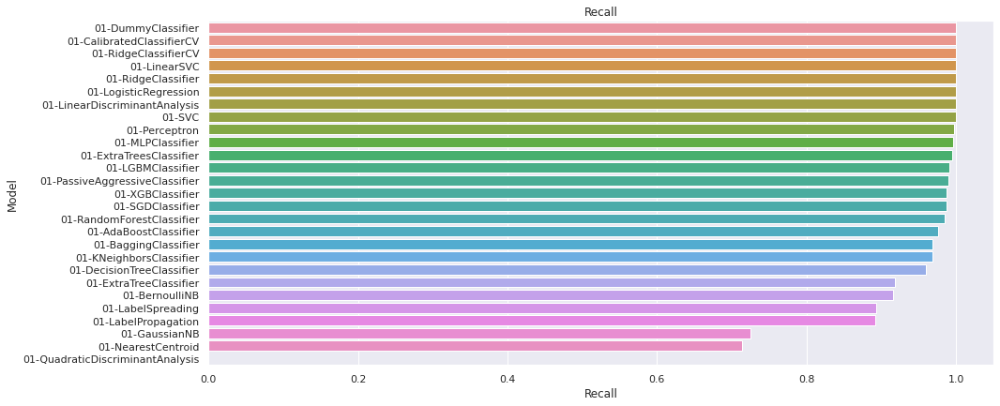

...

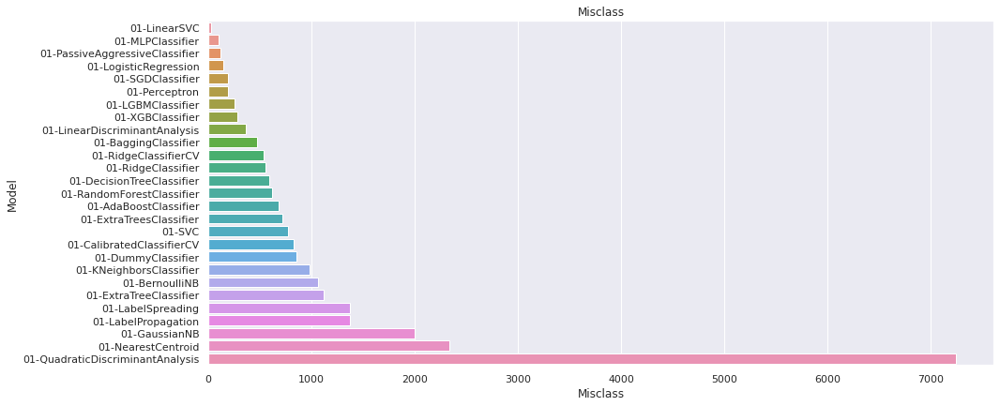

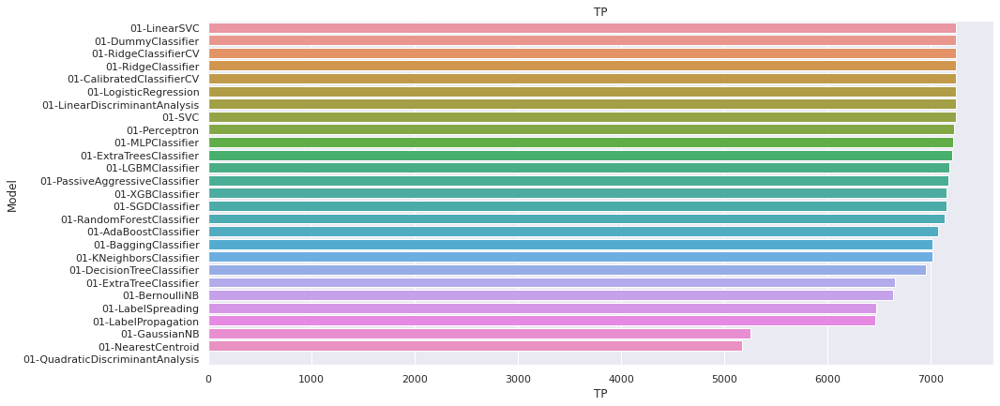

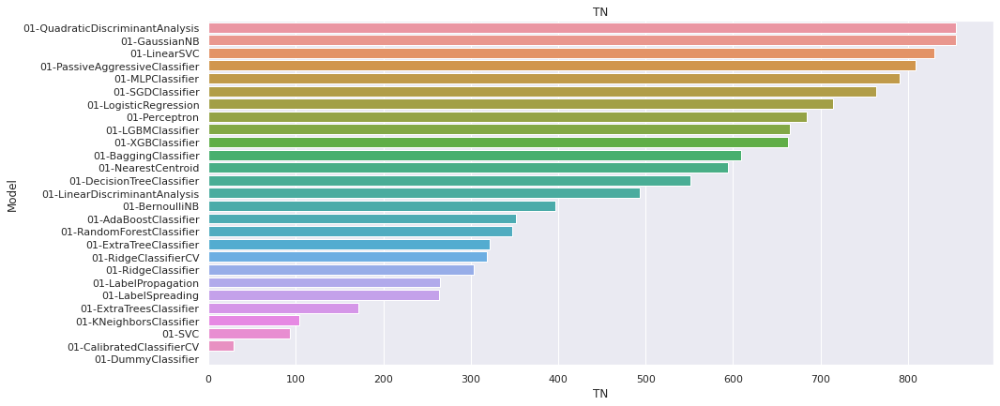

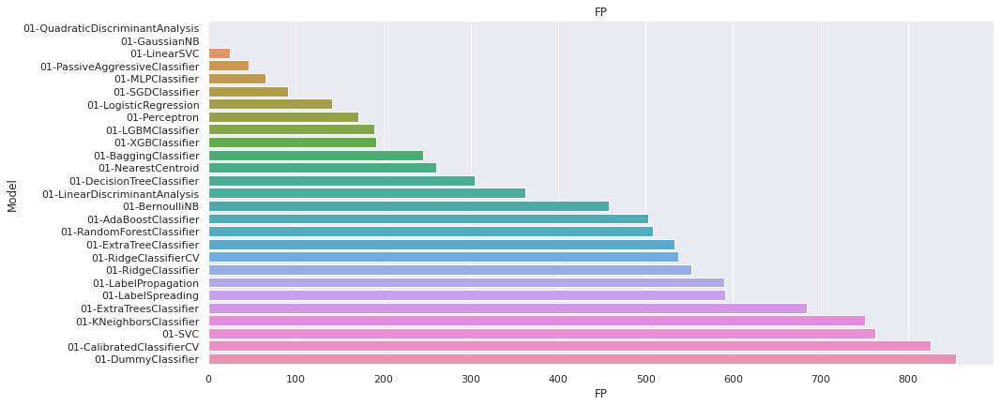

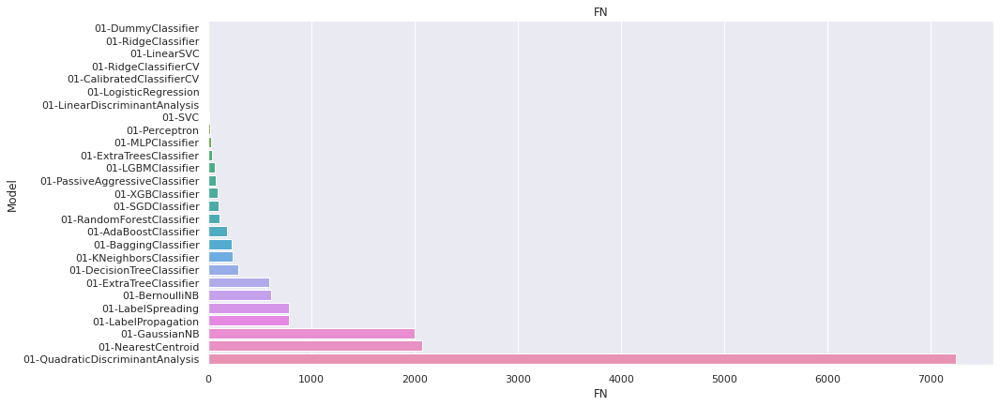

In [30]:
for metric in final_metrics_df_1.columns:
    if metric in ["FP_rate","Misclass_rate","Misclass","FP","FN"]:
        ascend=True
    else:
        ascend=False
    final_metrics_df_1.sort_values(by=metric, inplace=True, ascending=ascend)
    plt.figure(figsize = (15,final_metrics_df_1.shape[0]/4))
    sns.barplot(data=final_metrics_df_1, x = metric, y = final_metrics_df_1.index)
    plt.title(metric)
    plt_path = os.path.join(exe02_plots_path, metric + "_summary.png")
    plt.savefig(plt_path)
    plt.show()

# Exercise 3: 
  - Train them using the different parameters they support

We create the directory in which we will save the results.

In [31]:
mk_dir("exe03")
exe03_models_path = mk_dir("exe03/exe03_models")
exe03_tables_path = mk_dir("exe03/exe03_tables")

Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe03
Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe03/exe03_models
Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe03/exe03_tables


- [***LogisticRegression***](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html?highlight=logisticregression#sklearn.linear_model.LogisticRegression)
    - **solver** (Algorithm to use in the optimization problem.):
        - newton-cg
        - lbfgs
        - liblinear
        - sag
        - saga
    - **C** (Inverse of regularization strength.)
        - gbtree
        - gblinear
    - **penalty** (Specify the norm of the penalty):
        - none
        - l2
        - l1
        - elasticnet

- [***RidgeClassifier***](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.RidgeClassifier.html?highlight=ridgeclassifier#sklearn.linear_model.RidgeClassifier)
    - **alpha** (Regularization strength):
        - 0.1
        - 0.2
        - 0.3
        - 0.4
        - 0.5
        - 0.6
        - 0.7
        - 0.8
        - 0.9
        - 1.0

- [***KNeighborsClassifier***](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html?highlight=kneighborsclassifier#sklearn.neighbors.KNeighborsClassifier)
    - **weights** (Weight function used in prediction.):
        - uniform
        - distance
    - **metric** (The distance metric to use for the tree.):
        - euclidean
        - manhattan
        - minkowski

- [***SVC***](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html?highlight=svc#sklearn.svm.SVC)
    - **kernel** (Specifies the kernel type to be used in the algorithm.):
        - linear
        - poly
        - rbf
        - sigmoid
    - **C** (Regularization parameter.):
        - 1
        - 10
        - 100
    - **gamma** (Kernel coefficient):
        - scale
        - auto
        
    
- [***BaggingClassifier***](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.BaggingClassifier.html?highlight=baggingclassifier#sklearn.ensemble.BaggingClassifier)
    - **n_estimators** (The number of base estimators in the ensemble.):
        - 10
        - 100
        - 1000

- [***RandomForestClassifier***](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html?highlight=randomforestclassifier#sklearn.ensemble.RandomForestClassifier)
    - **max_depth** (The maximum depth of the tree.):
        - 3
        - 5
        - 10
        - None
    - **min_samples_split** (The minimum number of samples required to split an internal node):
        - 2
        - 5
        - 10
    - **max_features** (The number of features to consider when looking for the best split):
        - sqrt
        - log2
        - None


In [32]:
selected_classifiers = [LogisticRegression(random_state = 130), 
                      RidgeClassifier(random_state = 130),
                      KNeighborsClassifier(), 
                      SVC(random_state = 130),
                      BaggingClassifier(random_state = 130),
                      RandomForestClassifier(random_state = 130)]

LogisticRegression_param_grid = {"solver":['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
                                 "C":[10, 1.0, 0.1, 0.01],
                                 "penalty":['l1', 'l2', 'elasticnet', 'none']}
RidgeClassifier_param_grid = {"alpha":[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}
KNeighborsClassifier_param_grid = {"weights":['uniform', 'distance'],
                                 "metric":['euclidean', 'manhattan', 'minkowski']}
SVC_param_grid = {"C":[1, 10, 100],
                  "kernel":['linear', 'poly', 'rbf', 'sigmoid'],
                  "gamma":['scale', 'auto']}        
BaggingClassifier_param_grid = {"n_estimators":[10, 100, 1000]}  
RandomForestClassifier_param_grid = {"max_depth":[3, 5, 10, None],
                                 "min_samples_split":[2, 5, 10],
                                 "max_features":['sqrt', 'log2', None]}     
param_grids = [LogisticRegression_param_grid,
               RidgeClassifier_param_grid,
               KNeighborsClassifier_param_grid,
               SVC_param_grid,
               BaggingClassifier_param_grid,
               RandomForestClassifier_param_grid]                                                   

1.   First we define the estimator that we will use in the search for parameters.

1.   Create a dictionary with parameters names as keys and lists of parameter settings to try as values.

1.   Then we define the name of the GridSearchCV object, the name of the file where the search result is saved and the path of the file.

1.   If the GridSearchCV has already been trained and saved, that is, if the file already exists, it is read.

1.   If it has not been previously trained, we define the GridSearchCV object with the estimator and the indicated parameters.

1.   Then it is trained, and saved to disk.

1.   Finally we tabulate the results and save the results in a csv file.
1.   In the last step we show the table with the results (they are not ordered)

In [33]:
for model, param_grid in zip(selected_classifiers, param_grids):
    print(model)
    print(param_grid)
    # GridSearchCV name and filename
    model_name = '{}-{}'.format("03", "GSCV_" + str(model).split("(")[0])
    model_filename = model_name + ".pkl"
    model_filename_path = os.path.join(exe03_models_path, model_filename)

    if os.path.isfile(model_filename_path):
        # load existing model
        print("\n{}: Loading model:\t{}".format(timenow(), model_filename))
        GSCV_model = pickle.load(open(model_filename_path, 'rb'))
    else:
        # set GridSearchCV
        GSCV_model = GridSearchCV(estimator=model, 
                                  param_grid=param_grid, 
                                  verbose=1, 
                                  cv = 2)
        print("\n{}: Start Fitting model:\t{}".format(timenow(), model_name))
        tiempo_inicio_fit = datetime.datetime.now()
        # Fit GridSearchCV
        GSCV_model.fit(X, y)
        print("\n{}: Finish. Fitting time:\t{}".format(timenow(), datetime.datetime.now() - tiempo_inicio_fit))
        # save the GridSearchCV to disk
        pickle.dump(GSCV_model, open(model_filename_path, 'wb'))

    # Results filename
    GSCV_results_filename = model_name + "_metrics.csv"
    # Results dataframe
    GSCV_model_results = pd.DataFrame(GSCV_model.cv_results_)
    GSCV_model_results.index =  model_name + '-'+GSCV_model_results.filter(regex="param_").astype(str).agg('_'.join, axis=1)
    GSCV_model_results.sort_values(by="rank_test_score", inplace=True)
    cols = list(GSCV_model_results.columns)
    cols.reverse()
    GSCV_model_results = GSCV_model_results[cols]
    # Results to file
    print("\n{}: Save GSCV results in:\t{}".format(timenow(), GSCV_results_filename))
    GSCV_model_results.to_csv(os.path.join(exe03_tables_path, GSCV_results_filename))
    display(GSCV_model_results)

LogisticRegression(random_state=130)
{'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], 'C': [10, 1.0, 0.1, 0.01], 'penalty': ['l1', 'l2', 'elasticnet', 'none']}

23:18:28: Loading model:	03-GSCV_LogisticRegression.pkl

23:18:28: Save GSCV results in:	03-GSCV_LogisticRegression_metrics.csv


,rank_test_score,std_test_score,mean_test_score,split1_test_score,split0_test_score,params,param_solver,param_penalty,param_C,std_score_time,mean_score_time,std_fit_time,mean_fit_time
03-GSCV_LogisticRegression-1.0_none_newton-cg,1,0.000099,0.999901,0.999803,1.0,"{'C': 1.0, 'penalty': 'none', 'solver': 'newto...",newton-cg,none,1.0,0.000175,0.002573,0.031482,0.422454
03-GSCV_LogisticRegression-10_none_newton-cg,1,0.000099,0.999901,0.999803,1.0,"{'C': 10, 'penalty': 'none', 'solver': 'newton...",newton-cg,none,10,0.000021,0.002416,0.041110,0.425159
03-GSCV_LogisticRegression-0.01_none_newton-cg,1,0.000099,0.999901,0.999803,1.0,"{'C': 0.01, 'penalty': 'none', 'solver': 'newt...",newton-cg,none,0.01,0.000032,0.002423,0.044838,0.414241
03-GSCV_LogisticRegression-0.1_none_newton-cg,1,0.000099,0.999901,0.999803,1.0,"{'C': 0.1, 'penalty': 'none', 'solver': 'newto...",newton-cg,none,0.1,0.000021,0.002411,0.036087,0.438111
03-GSCV_LogisticRegression-1.0_none_lbfgs,5,0.000148,0.999852,0.999704,1.0,"{'C': 1.0, 'penalty': 'none', 'solver': 'lbfgs'}",lbfgs,none,1.0,0.000051,0.002385,0.025098,0.139963
...,...,...,...,...,...,...,...,...,...,...,...,...,...
03-GSCV_LogisticRegression-0.1_elasticnet_sag,76,NaN,NaN,NaN,NaN,"{'C': 0.1, 'penalty': 'elasticnet', 'solver': ...",sag,elasticnet,0.1,0.000000,0.000000,0.000017,0.002732
03-GSCV_LogisticRegression-0.1_elasticnet_saga,77,NaN,NaN,NaN,NaN,"{'C': 0.1, 'penalty': 'elasticnet', 'solver': ...",saga,elasticnet,0.1,0.000000,0.000000,0.000078,0.002936
03-GSCV_LogisticRegression-1.0_elasticnet_newton-cg,78,NaN,NaN,NaN,NaN,"{'C': 1.0, 'penalty': 'elasticnet', 'solver': ...",newton-cg,elasticnet,1.0,0.000000,0.000000,0.000124,0.002838
03-GSCV_LogisticRegression-0.1_none_liblinear,79,NaN,NaN,NaN,NaN,"{'C': 0.1, 'penalty': 'none', 'solver': 'libli...",liblinear,none,0.1,0.000000,0.000000,0.000076,0.002890


RidgeClassifier(random_state=130)
{'alpha': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}

23:18:28: Loading model:	03-GSCV_RidgeClassifier.pkl

23:18:28: Save GSCV results in:	03-GSCV_RidgeClassifier_metrics.csv


,rank_test_score,std_test_score,mean_test_score,split1_test_score,split0_test_score,params,param_alpha,std_score_time,mean_score_time,std_fit_time,mean_fit_time
03-GSCV_RidgeClassifier-0.1,1,0.001481,0.930391,0.928910,0.931872,{'alpha': 0.1},0.1,0.000058,0.002504,0.000677,0.014618
03-GSCV_RidgeClassifier-0.2,2,0.001234,0.929947,0.928712,0.931181,{'alpha': 0.2},0.2,0.000001,0.002503,0.000260,0.014765
03-GSCV_RidgeClassifier-0.3,3,0.001432,0.929552,0.928120,0.930983,{'alpha': 0.3},0.3,0.000019,0.002602,0.003178,0.018284
03-GSCV_RidgeClassifier-0.4,4,0.001530,0.929157,0.927626,0.930687,{'alpha': 0.4},0.4,0.000078,0.002587,0.000375,0.015063
03-GSCV_RidgeClassifier-0.5,5,0.001580,0.928910,0.927330,0.930490,{'alpha': 0.5},0.5,0.000009,0.002628,0.000120,0.015367
03-GSCV_RidgeClassifier-0.6,6,0.001432,0.928564,0.927133,0.929996,{'alpha': 0.6},0.6,0.000048,0.002621,0.000276,0.014840
03-GSCV_RidgeClassifier-0.7,7,0.001432,0.928367,0.926935,0.929799,{'alpha': 0.7},0.7,0.000032,0.002424,0.000354,0.014715
03-GSCV_RidgeClassifier-0.8,8,0.001530,0.928071,0.926540,0.929601,{'alpha': 0.8},0.8,0.000087,0.002581,0.000027,0.014175
03-GSCV_RidgeClassifier-0.9,9,0.001629,0.927774,0.926145,0.929404,{'alpha': 0.9},0.9,0.000173,0.002651,0.001948,0.016504
03-GSCV_RidgeClassifier-1.0,10,0.001679,0.927528,0.925849,0.929206,{'alpha': 1.0},1.0,0.000008,0.002482,0.000698,0.015152


KNeighborsClassifier()
{'weights': ['uniform', 'distance'], 'metric': ['euclidean', 'manhattan', 'minkowski']}

23:18:28: Loading model:	03-GSCV_KNeighborsClassifier.pkl

23:18:28: Save GSCV results in:	03-GSCV_KNeighborsClassifier_metrics.csv


,rank_test_score,std_test_score,mean_test_score,split1_test_score,split0_test_score,params,param_weights,param_metric,std_score_time,mean_score_time,std_fit_time,mean_fit_time
03-GSCV_KNeighborsClassifier-euclidean_uniform,1,0.001333,0.879986,0.881319,0.878653,"{'metric': 'euclidean', 'weights': 'uniform'}",uniform,euclidean,0.262749,2.370454,0.003562,0.007199
03-GSCV_KNeighborsClassifier-minkowski_uniform,1,0.001333,0.879986,0.881319,0.878653,"{'metric': 'minkowski', 'weights': 'uniform'}",uniform,minkowski,0.189859,2.316373,0.000170,0.003740
03-GSCV_KNeighborsClassifier-euclidean_distance,3,0.001333,0.879789,0.881122,0.878456,"{'metric': 'euclidean', 'weights': 'distance'}",distance,euclidean,0.175023,2.025382,0.000088,0.003838
03-GSCV_KNeighborsClassifier-minkowski_distance,3,0.001333,0.879789,0.881122,0.878456,"{'metric': 'minkowski', 'weights': 'distance'}",distance,minkowski,0.169183,2.018720,0.000039,0.003388
03-GSCV_KNeighborsClassifier-manhattan_uniform,5,0.000543,0.877320,0.876777,0.877863,"{'metric': 'manhattan', 'weights': 'uniform'}",uniform,manhattan,0.220949,3.213038,0.000027,0.003590
03-GSCV_KNeighborsClassifier-manhattan_distance,5,0.000642,0.877320,0.876679,0.877962,"{'metric': 'manhattan', 'weights': 'distance'}",distance,manhattan,0.224972,2.939271,0.000044,0.003689


SVC(random_state=130)
{'C': [1, 10, 100], 'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 'gamma': ['scale', 'auto']}

23:18:28: Loading model:	03-GSCV_SVC.pkl

23:18:28: Save GSCV results in:	03-GSCV_SVC_metrics.csv


,rank_test_score,std_test_score,mean_test_score,split1_test_score,split0_test_score,params,param_kernel,param_gamma,param_C,std_score_time,mean_score_time,std_fit_time,mean_fit_time
03-GSCV_SVC-100_scale_linear,1,0.000444,0.999358,0.999803,0.998914,"{'C': 100, 'gamma': 'scale', 'kernel': 'linear'}",linear,scale,100,0.004658,0.086549,0.069783,1.890944
03-GSCV_SVC-100_auto_linear,1,0.000444,0.999358,0.999803,0.998914,"{'C': 100, 'gamma': 'auto', 'kernel': 'linear'}",linear,auto,100,0.011227,0.092231,0.042046,1.892343
03-GSCV_SVC-10_scale_linear,3,0.000987,0.996643,0.995656,0.997630,"{'C': 10, 'gamma': 'scale', 'kernel': 'linear'}",linear,scale,10,0.002377,0.180878,0.080249,1.135070
03-GSCV_SVC-10_auto_linear,3,0.000987,0.996643,0.995656,0.997630,"{'C': 10, 'gamma': 'auto', 'kernel': 'linear'}",linear,auto,10,0.005913,0.186086,0.062394,1.093695
03-GSCV_SVC-1_scale_linear,5,0.000741,0.988102,0.987362,0.988843,"{'C': 1, 'gamma': 'scale', 'kernel': 'linear'}",linear,scale,1,0.007906,0.387972,0.063426,1.053959
03-GSCV_SVC-1_auto_linear,5,0.000741,0.988102,0.987362,0.988843,"{'C': 1, 'gamma': 'auto', 'kernel': 'linear'}",linear,auto,1,0.002562,0.385056,0.052434,1.034119
03-GSCV_SVC-100_auto_rbf,7,0.000247,0.970034,0.970280,0.969787,"{'C': 100, 'gamma': 'auto', 'kernel': 'rbf'}",rbf,auto,100,0.025038,1.127130,0.006606,2.338385
03-GSCV_SVC-100_scale_rbf,8,0.000049,0.969244,0.969194,0.969293,"{'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}",rbf,scale,100,0.035473,1.119303,0.027171,2.340941
03-GSCV_SVC-10_auto_rbf,9,0.000296,0.963369,0.963073,0.963665,"{'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}",rbf,auto,10,0.015559,1.687492,0.001031,2.098593
03-GSCV_SVC-10_scale_rbf,10,0.000099,0.962875,0.962776,0.962974,"{'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}",rbf,scale,10,0.010882,1.682876,0.003204,2.096555


BaggingClassifier(random_state=130)
{'n_estimators': [10, 100, 1000]}

23:18:28: Loading model:	03-GSCV_BaggingClassifier.pkl

23:18:29: Save GSCV results in:	03-GSCV_BaggingClassifier_metrics.csv


,rank_test_score,std_test_score,mean_test_score,split1_test_score,split0_test_score,params,param_n_estimators,std_score_time,mean_score_time,std_fit_time,mean_fit_time
03-GSCV_BaggingClassifier-1000,1,0.000049,0.948312,0.948361,0.948262,{'n_estimators': 1000},1000,0.032619,2.416987,0.752701,76.639119
03-GSCV_BaggingClassifier-100,2,0.000148,0.946633,0.946781,0.946485,{'n_estimators': 100},100,0.003401,0.243135,0.109162,7.739530
03-GSCV_BaggingClassifier-10,3,0.000592,0.937796,0.937204,0.938389,{'n_estimators': 10},10,0.001344,0.027919,0.004380,0.784493


RandomForestClassifier(random_state=130)
{'max_depth': [3, 5, 10, None], 'min_samples_split': [2, 5, 10], 'max_features': ['sqrt', 'log2', None]}

23:18:29: Loading model:	03-GSCV_RandomForestClassifier.pkl

23:18:29: Save GSCV results in:	03-GSCV_RandomForestClassifier_metrics.csv


,rank_test_score,std_test_score,mean_test_score,split1_test_score,split0_test_score,params,param_min_samples_split,param_max_features,param_max_depth,std_score_time,mean_score_time,std_fit_time,mean_fit_time
03-GSCV_RandomForestClassifier-None_None_5,1,0.001284,0.946781,0.948065,0.945498,"{'max_depth': None, 'max_features': None, 'min...",5,None,None,0.009091,0.132357,0.152643,7.626693
03-GSCV_RandomForestClassifier-None_None_10,2,0.001037,0.946732,0.947769,0.945695,"{'max_depth': None, 'max_features': None, 'min...",10,None,None,0.004780,0.126936,0.035421,7.795565
03-GSCV_RandomForestClassifier-None_None_2,3,0.000592,0.946485,0.947077,0.945893,"{'max_depth': None, 'max_features': None, 'min...",2,None,None,0.004000,0.126696,0.119015,7.652172
03-GSCV_RandomForestClassifier-10_None_5,4,0.001135,0.938537,0.937401,0.939672,"{'max_depth': 10, 'max_features': None, 'min_s...",5,None,10,0.001025,0.115895,0.060458,6.869201
03-GSCV_RandomForestClassifier-10_None_10,5,0.000543,0.938438,0.937895,0.938981,"{'max_depth': 10, 'max_features': None, 'min_s...",10,None,10,0.000887,0.112141,0.126038,6.781712
03-GSCV_RandomForestClassifier-10_None_2,6,0.000296,0.937895,0.937599,0.938191,"{'max_depth': 10, 'max_features': None, 'min_s...",2,None,10,0.002164,0.113016,0.053894,6.918059
03-GSCV_RandomForestClassifier-None_sqrt_10,7,0.002666,0.921603,0.918938,0.924269,"{'max_depth': None, 'max_features': 'sqrt', 'm...",10,sqrt,None,0.000822,0.135211,0.004793,1.707726
03-GSCV_RandomForestClassifier-None_sqrt_5,8,0.001827,0.919777,0.917950,0.921603,"{'max_depth': None, 'max_features': 'sqrt', 'm...",5,sqrt,None,0.001577,0.135920,0.003036,1.744510
03-GSCV_RandomForestClassifier-None_sqrt_2,9,0.001086,0.919431,0.918345,0.920517,"{'max_depth': None, 'max_features': 'sqrt', 'm...",2,sqrt,None,0.000202,0.136744,0.025486,1.735569
03-GSCV_RandomForestClassifier-None_log2_10,10,0.000790,0.915778,0.914988,0.916568,"{'max_depth': None, 'max_features': 'log2', 'm...",10,log2,None,0.002426,0.146843,0.018250,1.503134


In a similar way to the exercise 2, we read the results of each GridSearchCV.

For each model we plot its Accuracy score hued by each by its Grid Searched Parameter. 


	 03-GSCV_LogisticRegression_metrics 



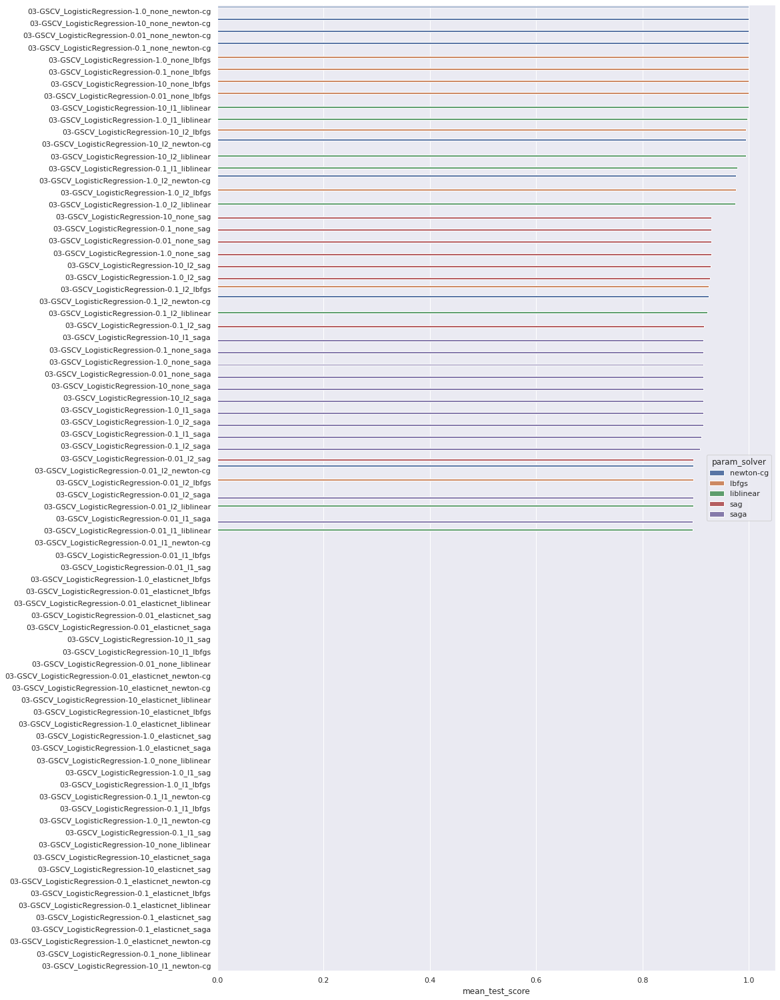

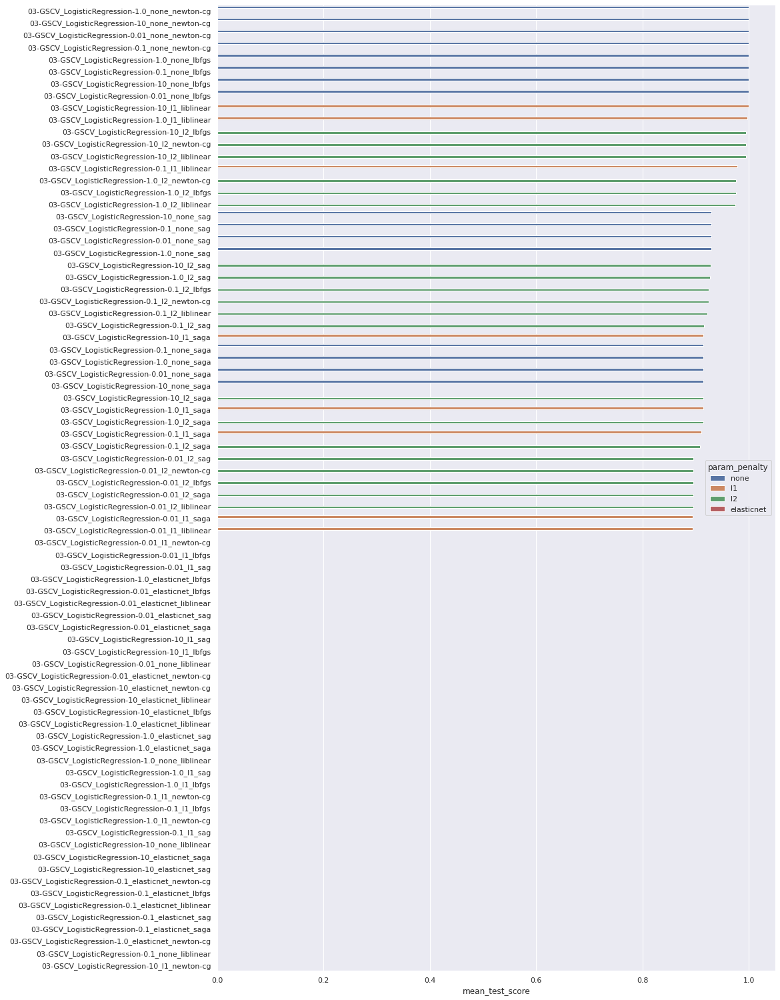

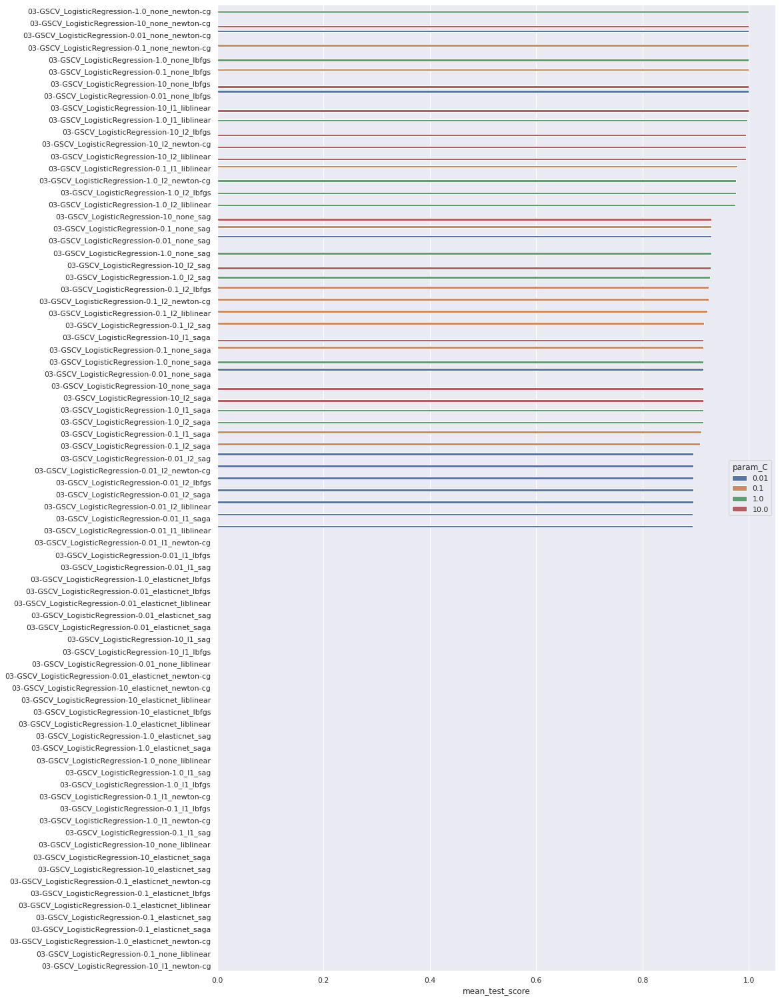


	 03-GSCV_RidgeClassifier_metrics 



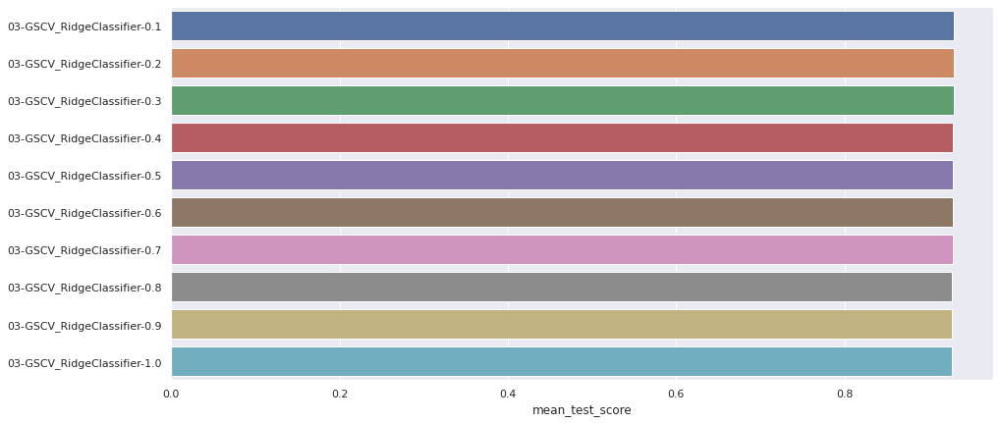


	 03-GSCV_KNeighborsClassifier_metrics 



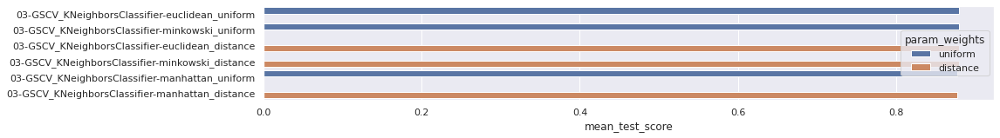

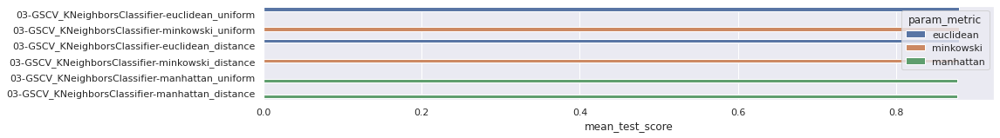


	 03-GSCV_SVC_metrics 



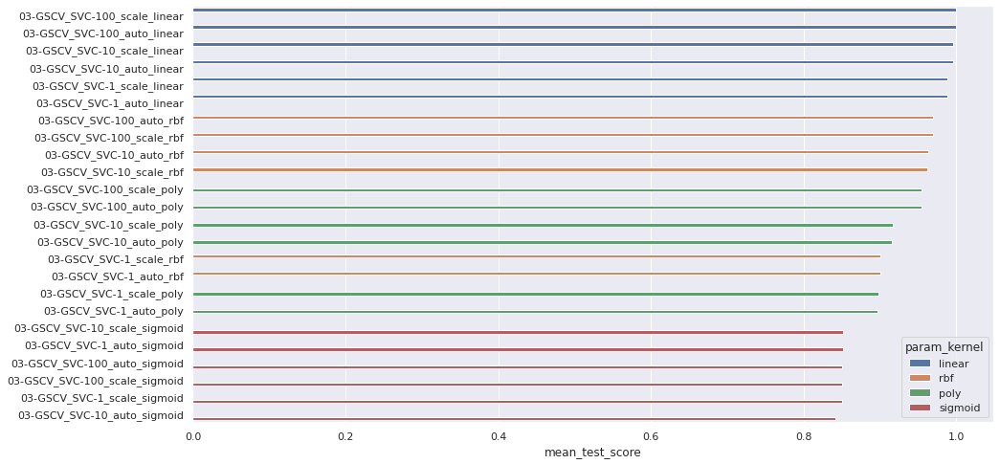

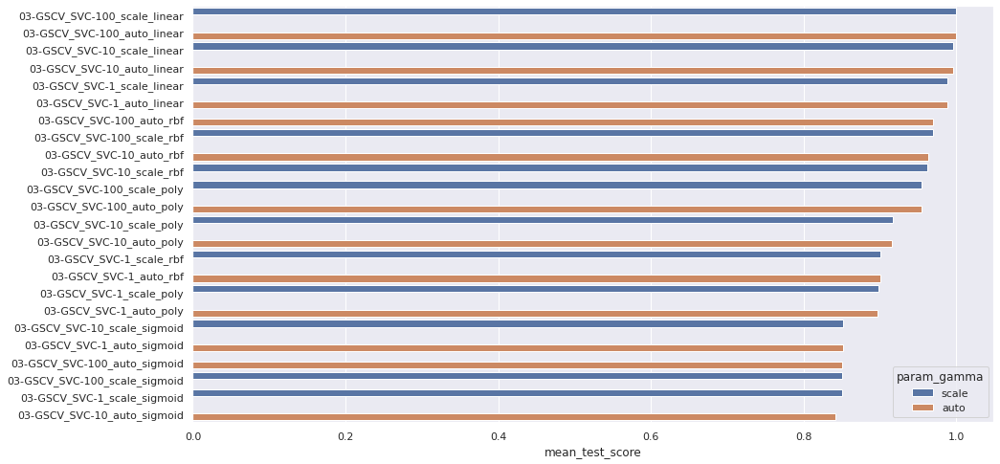

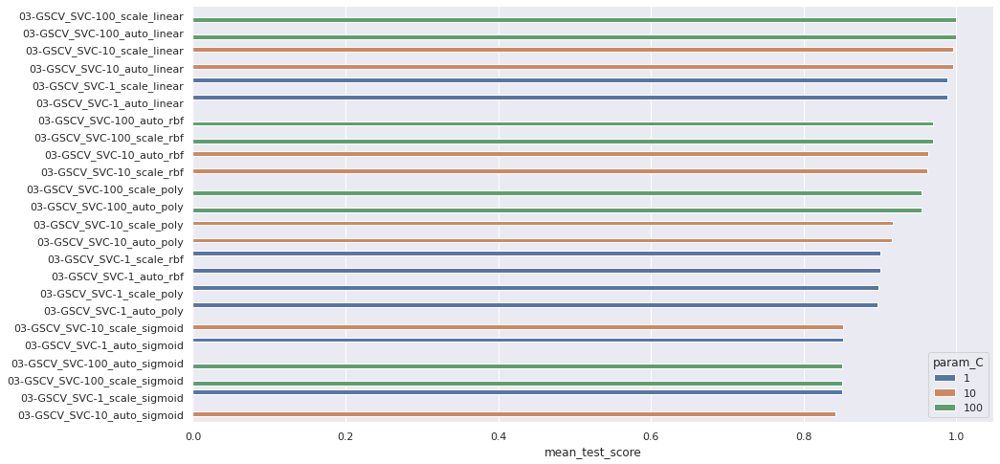


	 03-GSCV_BaggingClassifier_metrics 



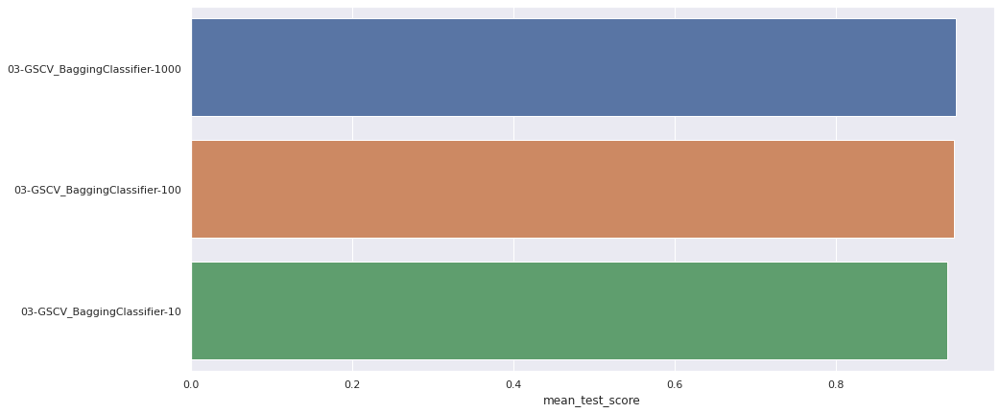


	 03-GSCV_RandomForestClassifier_metrics 



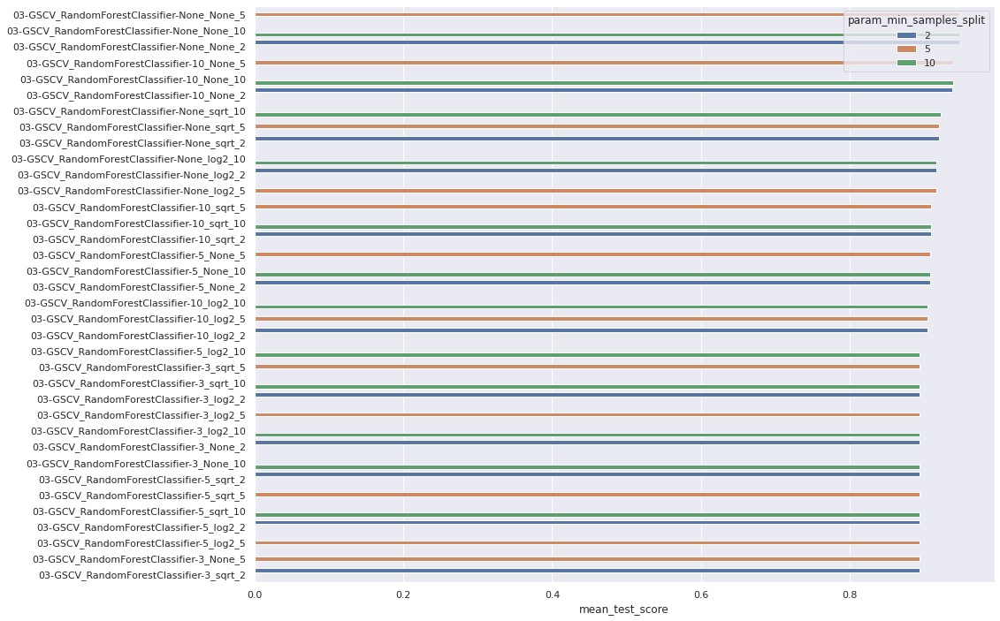

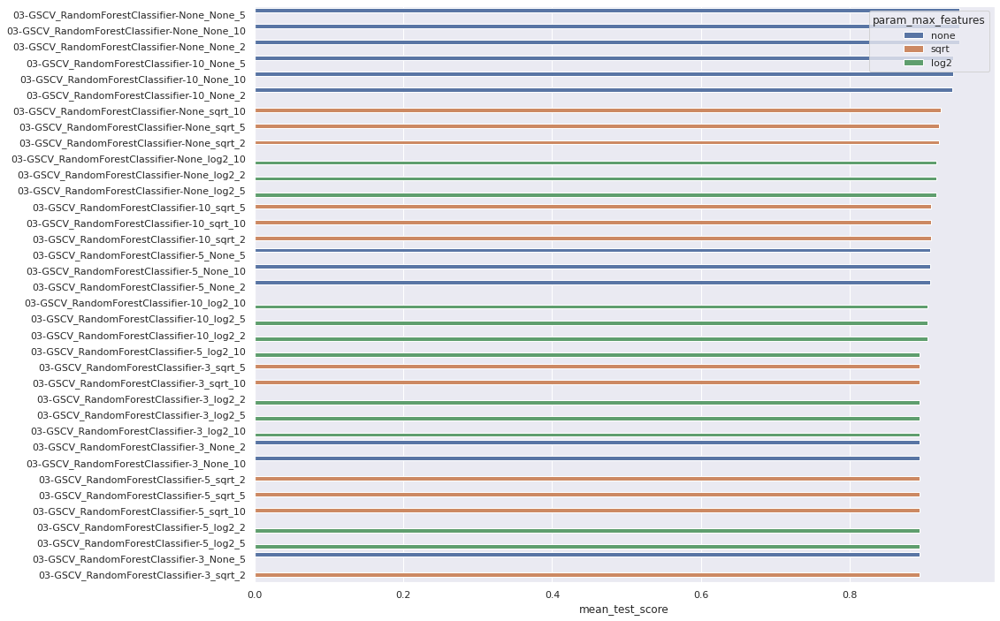

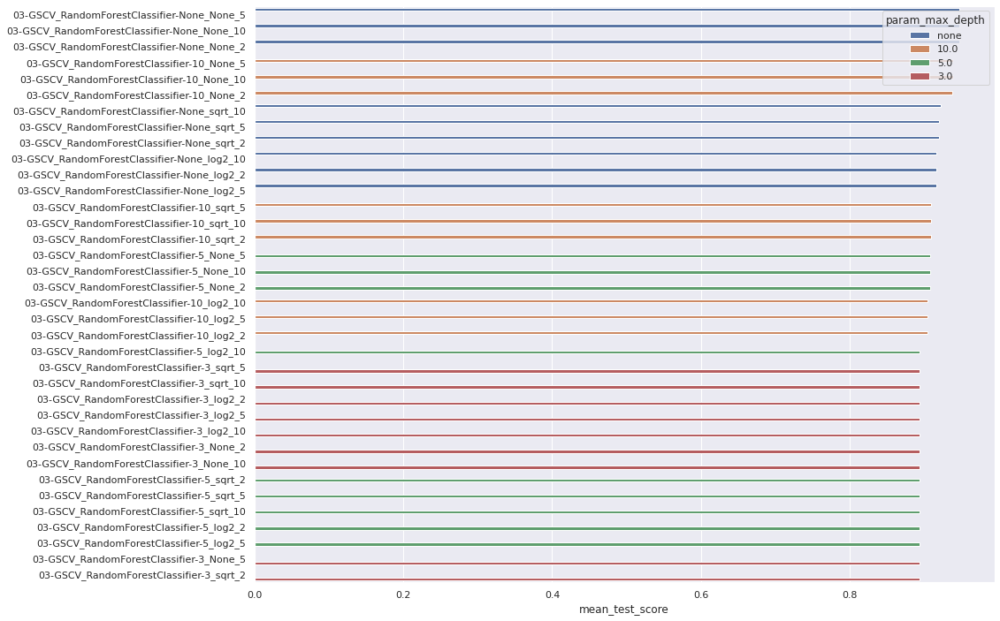

In [34]:
for GSCV_results_filename in os.listdir(exe03_tables_path):
    GSCV_results_df = pd.read_csv(os.path.join(exe03_tables_path,GSCV_results_filename), index_col=0)
    GSCV_name = GSCV_results_filename.split(".")[0]
    print('\n\t',GSCV_name,'\n')
    if GSCV_name == "03-GSCV_RandomForestClassifier_metrics":
        GSCV_results_df.fillna("none", inplace=True)
    params = GSCV_results_df.filter(regex="param_").columns.to_list()
    if len(params) == 1:
        sns.barplot(data=GSCV_results_df, x="mean_test_score", y=GSCV_results_df.index)
        plt.show()
    else:
        for parm_to_hue in params:
            plt.figure(figsize = (15,GSCV_results_df.shape[0]/3))
            sns.barplot(data=GSCV_results_df, x="mean_test_score", y=GSCV_results_df.index, hue=parm_to_hue)
            plt.show()

- LogisticRegression:
     - **solver**: `newton-cg` and `lbfgs` produces the best results.
     - **C**: `gbtree` and `gblinear` produce similar results.
     - **penalty**: `none` produces the best results, `elasticnet` does not get results.
- RidgeClassifier:
     - **alpha**: all produce similar results.
- KNeighboursClassifier:
     - **weights**: all produce similar results.
     - **metric**: all produce similar results.
- CVS:
     - **kernel**: `linear` > `rbf` > `poly` > `sigmoid`.
     - **C**: the higher the value, the better results are produced.
     - **gamma**: `scale` and `auto` all produce similar results.
- BaggingClassifier:
     - **n_estimators**: the higher the value, the better results are produced.
- RandomForestClassifier:
     - **max_depth**: the higher the value, the better results are produced.
     - **min_samples_split**: all produce similar results.
     - **max_features**: `None` produces the best results.

We order the model by the Accuracy score in ascending order and finally we show the table and and plot them.

Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe03/exe03_tables


,mean_test_score
03-GSCV_LogisticRegression-1.0_none_newton-cg,0.999901
03-GSCV_LogisticRegression-0.01_none_newton-cg,0.999901
03-GSCV_LogisticRegression-0.1_none_newton-cg,0.999901
03-GSCV_LogisticRegression-10_none_newton-cg,0.999901
03-GSCV_LogisticRegression-1.0_none_lbfgs,0.999852
...,...
03-GSCV_LogisticRegression-0.1_elasticnet_sag,NaN
03-GSCV_LogisticRegression-0.1_elasticnet_saga,NaN
03-GSCV_LogisticRegression-1.0_elasticnet_newton-cg,NaN
03-GSCV_LogisticRegression-0.1_none_liblinear,NaN


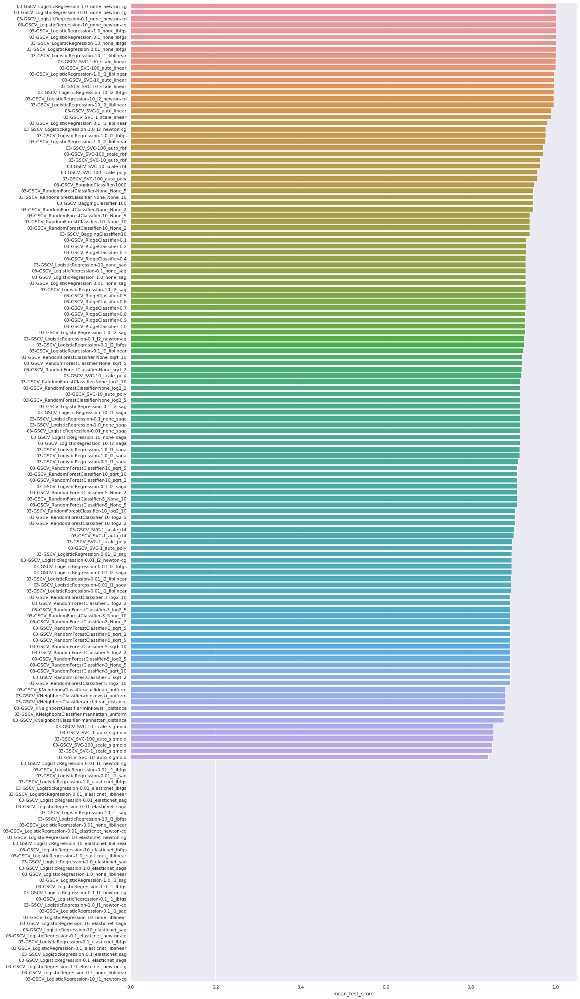

In [35]:
exe03_tables_path = mk_dir("exe03/exe03_tables")
metrics_lst = []
for GSCV_results_filename in os.listdir(exe03_tables_path):
    GSCV_results_df = pd.read_csv(os.path.join(exe03_tables_path,GSCV_results_filename), index_col=0)
    metrics_lst.append(GSCV_results_df[["mean_test_score"]])
all_metrics_df = pd.concat(metrics_lst)
all_metrics_df.sort_values(by=["mean_test_score"], ascending=[False], inplace=True)
display(all_metrics_df)
plt.figure(figsize = (20,int(all_metrics_df.shape[0]/3.5)))
sns.barplot(data=all_metrics_df, x = "mean_test_score", y = all_metrics_df.index)
plt.show()

The best results were obtained by the LogisticRegression estimator with the following parameters:
- solver: newton-cg
- penalty: none

# Exercise 4: 
  - Compare your performance using the train / test approach or using all data (internal validation)

We create the directory in which we will save the results.

In [36]:
mk_dir("exe04")
exe04_plots_path = mk_dir("exe04/exe04_plots")
exe04_tables_path = mk_dir("exe04/exe04_tables")

Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe04
Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe04/exe04_plots
Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe04/exe04_tables


## Train Test approach

We read the results from the exercise 1

In [37]:
class_metrics_df = pd.read_csv(os.path.join(exe01_tables_path, "01-classification_metrics.csv"), index_col=0)
display(class_metrics_df.round(5))

,Accuracy,B_Accuracy,F1_Score,Precision,Recall,Specificity,FP_rate,Misclass_rate,Misclass,TP,TN,FP,FN
Model,,,,,,,,,,,,,
01-LinearSVC,0.9969,0.9854,0.9983,0.9966,1.0000,0.9708,0.0292,0.0031,25,7248,830,25,0
01-MLPClassifier,0.9883,0.9599,0.9935,0.9911,0.9959,0.9240,0.0760,0.0117,95,7218,790,65,30
01-PassiveAggressiveClassifier,0.9852,0.9680,0.9917,0.9936,0.9898,0.9462,0.0538,0.0148,120,7174,809,46,74
01-LogisticRegression,0.9825,0.9175,0.9903,0.9809,0.9999,0.8351,0.1649,0.0175,142,7247,714,141,1
01-Perceptron,0.9769,0.8989,0.9872,0.9769,0.9978,0.8000,0.2000,0.0231,187,7232,684,171,16
01-SGDClassifier,0.9769,0.9402,0.9871,0.9874,0.9868,0.8936,0.1064,0.0231,187,7152,764,91,96
01-LGBMClassifier,0.9683,0.8843,0.9824,0.9742,0.9908,0.7778,0.2222,0.0317,257,7181,665,190,67
01-XGBClassifier,0.9652,0.8815,0.9807,0.9739,0.9876,0.7754,0.2246,0.0348,282,7158,663,192,90
01-LinearDiscriminantAnalysis,0.9552,0.7882,0.9756,0.9524,0.9999,0.5766,0.4234,0.0448,363,7247,493,362,1


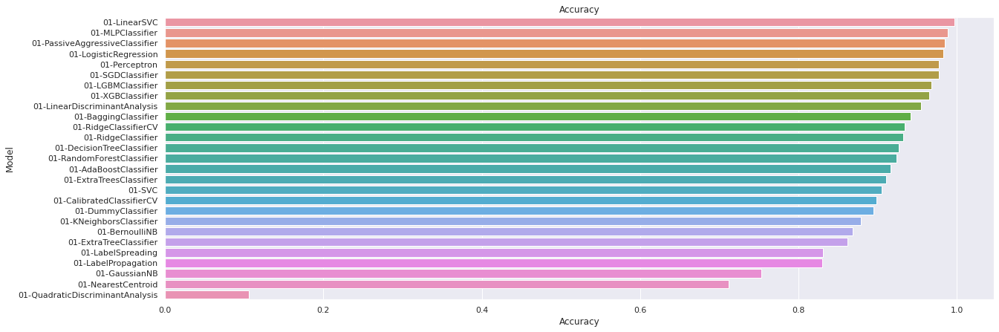

In [38]:
plt.figure(figsize = (20,int(class_metrics_df.shape[0]/3.5)))
sns.barplot(data=class_metrics_df, x = "Accuracy", y = class_metrics_df.index)
plt.title("Accuracy")
plt.show()

## k-Fold Cross-Validation (internal validation)

Split dataset into k consecutive folds.

Each fold is then used once as a validation while the k-1 remaining folds form the training set.

We will be increasing the K from 2 to 0 to see the effect on the results.


23:18:53: loading k-Fold Cross-Validation Scores:	kfcv_10

23:18:53: Model: LogisticRegression
23:18:53:  N splits: 2
23:18:53:    Accuracy scores: [0.979 0.973]
	     Mean (std): 	0.976 (0.00301)
23:18:53:  N splits: 3
23:18:53:    Accuracy scores: [0.982 0.982 0.976]
	     Mean (std): 	0.980 (0.00200)
23:18:53:  N splits: 4
23:18:53:    Accuracy scores: [0.983 0.985 0.982 0.979]
	     Mean (std): 	0.982 (0.00127)
23:18:53:  N splits: 5
23:18:53:    Accuracy scores: [0.983 0.985 0.984 0.981 0.981]
	     Mean (std): 	0.983 (0.00072)
23:18:53:  N splits: 6
23:18:53:    Accuracy scores: [0.984 0.984 0.985 0.984 0.978 0.983]
	     Mean (std): 	0.983 (0.00110)
23:18:53:  N splits: 7
23:18:53:    Accuracy scores: [0.984 0.982 0.987 0.985 0.984 0.977 0.984]
	     Mean (std): 	0.983 (0.00121)
23:18:53:  N splits: 8
23:18:53:    Accuracy scores: [0.984 0.983 0.985 0.988 0.984 0.984 0.977 0.984]
	     Mean (std): 	0.984 (0.00100)
23:18:53:  N splits: 9
23:18:53:    Accuracy scores: [0.985 0.98

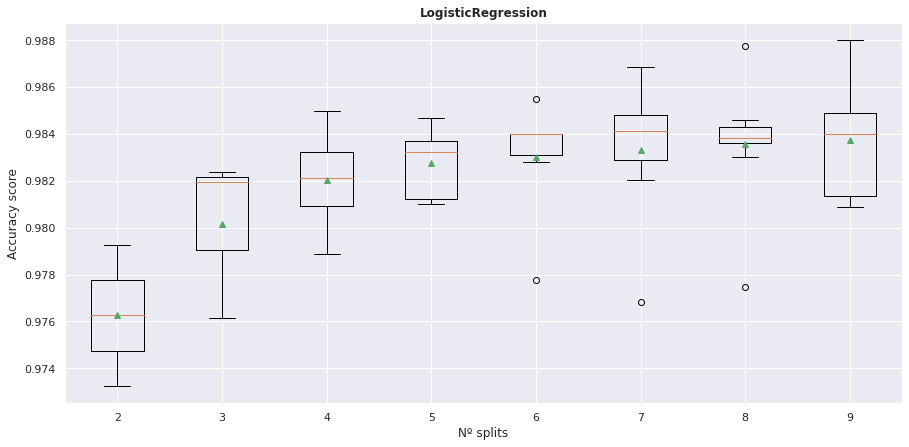


23:18:53: Model: RidgeClassifier
23:18:53:  N splits: 2
23:18:53:    Accuracy scores: [0.93  0.926]
	     Mean (std): 	0.928 (0.00193)
23:18:53:  N splits: 3
23:18:53:    Accuracy scores: [0.93  0.931 0.924]
	     Mean (std): 	0.928 (0.00212)
23:18:53:  N splits: 4
23:18:53:    Accuracy scores: [0.929 0.932 0.927 0.926]
	     Mean (std): 	0.928 (0.00147)
23:18:53:  N splits: 5
23:18:53:    Accuracy scores: [0.932 0.926 0.934 0.923 0.929]
	     Mean (std): 	0.929 (0.00194)
23:18:53:  N splits: 6
23:18:53:    Accuracy scores: [0.935 0.927 0.932 0.93  0.922 0.929]
	     Mean (std): 	0.929 (0.00178)
23:18:53:  N splits: 7
23:18:53:    Accuracy scores: [0.935 0.923 0.932 0.937 0.923 0.921 0.93 ]
	     Mean (std): 	0.929 (0.00242)
23:18:53:  N splits: 8
23:18:53:    Accuracy scores: [0.934 0.924 0.932 0.934 0.93  0.925 0.922 0.93 ]
	     Mean (std): 	0.929 (0.00164)
23:18:53:  N splits: 9
23:18:53:    Accuracy scores: [0.936 0.925 0.931 0.93  0.934 0.928 0.92  0.924 0.931]
	     Mean (std):

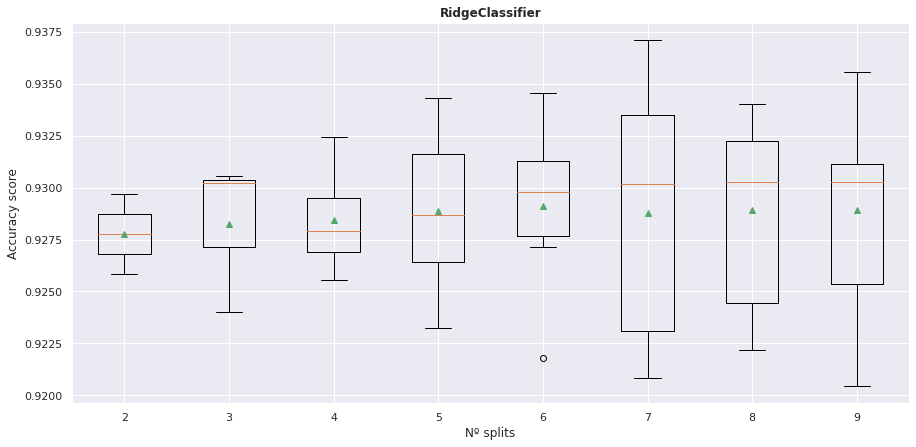


23:18:54: Model: KNeighborsClassifier
23:18:54:  N splits: 2
23:18:54:    Accuracy scores: [0.875 0.878]
	     Mean (std): 	0.877 (0.00153)
23:18:54:  N splits: 3
23:18:54:    Accuracy scores: [0.875 0.885 0.876]
	     Mean (std): 	0.879 (0.00323)
23:18:54:  N splits: 4
23:18:54:    Accuracy scores: [0.873 0.882 0.882 0.875]
	     Mean (std): 	0.878 (0.00240)
23:18:54:  N splits: 5
23:18:54:    Accuracy scores: [0.874 0.877 0.892 0.875 0.874]
	     Mean (std): 	0.879 (0.00351)
23:18:54:  N splits: 6
23:18:54:    Accuracy scores: [0.875 0.874 0.88  0.887 0.873 0.878]
	     Mean (std): 	0.878 (0.00204)
23:18:54:  N splits: 7
23:18:54:    Accuracy scores: [0.874 0.87  0.885 0.889 0.876 0.873 0.877]
	     Mean (std): 	0.878 (0.00260)
23:18:54:  N splits: 8
23:18:54:    Accuracy scores: [0.871 0.874 0.882 0.882 0.886 0.873 0.869 0.882]
	     Mean (std): 	0.877 (0.00223)
23:18:54:  N splits: 9
23:18:54:    Accuracy scores: [0.876 0.872 0.881 0.884 0.884 0.885 0.871 0.873 0.88 ]
	     Mean (

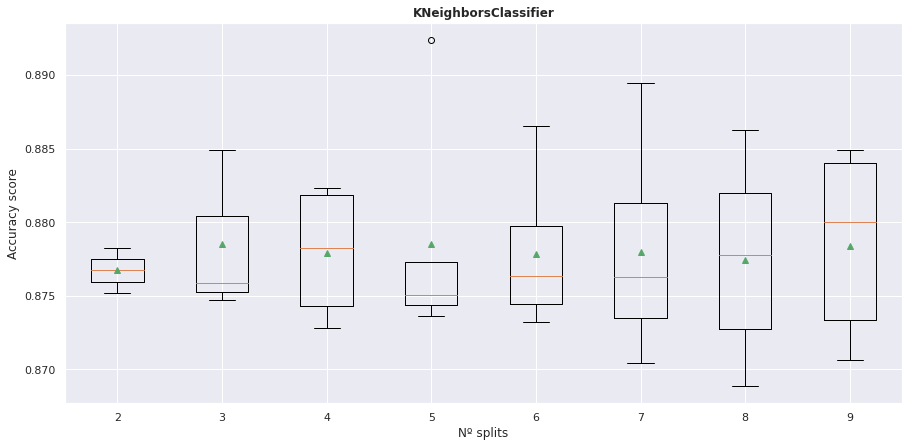


23:18:54: Model: SVC
23:18:54:  N splits: 2
23:18:54:    Accuracy scores: [0.903 0.901]
	     Mean (std): 	0.902 (0.00114)
23:18:54:  N splits: 3
23:18:54:    Accuracy scores: [0.913 0.915 0.902]
	     Mean (std): 	0.910 (0.00391)
23:18:54:  N splits: 4
23:18:54:    Accuracy scores: [0.913 0.916 0.913 0.909]
	     Mean (std): 	0.913 (0.00146)
23:18:54:  N splits: 5
23:18:54:    Accuracy scores: [0.918 0.913 0.926 0.908 0.914]
	     Mean (std): 	0.916 (0.00297)
23:18:54:  N splits: 6
23:18:54:    Accuracy scores: [0.923 0.913 0.921 0.923 0.904 0.917]
	     Mean (std): 	0.917 (0.00297)
23:18:54:  N splits: 7
23:18:54:    Accuracy scores: [0.924 0.91  0.923 0.929 0.916 0.904 0.92 ]
	     Mean (std): 	0.918 (0.00329)
23:18:54:  N splits: 8
23:18:54:    Accuracy scores: [0.922 0.914 0.922 0.924 0.924 0.916 0.907 0.919]
	     Mean (std): 	0.919 (0.00210)
23:18:54:  N splits: 9
23:18:54:    Accuracy scores: [0.924 0.919 0.919 0.92  0.926 0.923 0.908 0.913 0.919]
	     Mean (std): 	0.919 (0.0

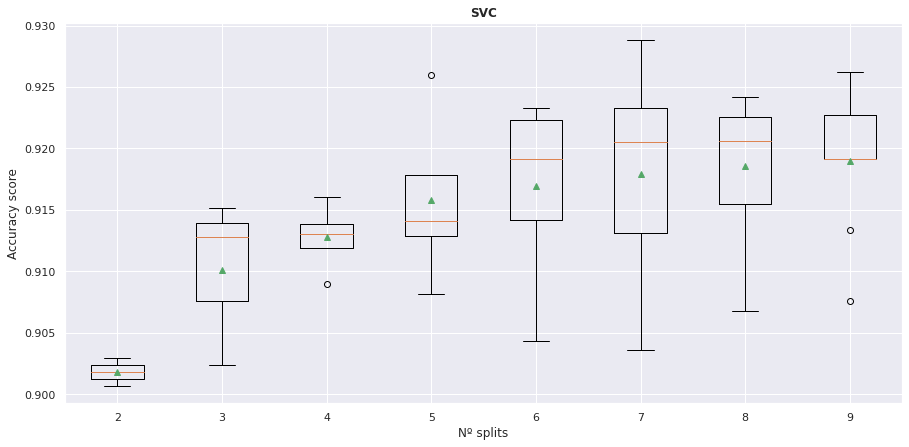


23:18:55: Model: BaggingClassifier
23:18:55:  N splits: 2
23:18:55:    Accuracy scores: [0.939 0.943]
	     Mean (std): 	0.941 (0.00183)
23:18:55:  N splits: 3
23:18:55:    Accuracy scores: [0.942 0.948 0.949]
	     Mean (std): 	0.946 (0.00223)
23:18:55:  N splits: 4
23:18:55:    Accuracy scores: [0.946 0.951 0.95  0.947]
	     Mean (std): 	0.948 (0.00124)
23:18:55:  N splits: 5
23:18:55:    Accuracy scores: [0.944 0.951 0.948 0.955 0.947]
	     Mean (std): 	0.949 (0.00189)
23:18:55:  N splits: 6
23:18:55:    Accuracy scores: [0.949 0.939 0.953 0.955 0.951 0.953]
	     Mean (std): 	0.950 (0.00231)
23:18:55:  N splits: 7
23:18:55:    Accuracy scores: [0.952 0.945 0.948 0.952 0.955 0.947 0.952]
	     Mean (std): 	0.950 (0.00126)
23:18:55:  N splits: 8
23:18:55:    Accuracy scores: [0.956 0.939 0.954 0.95  0.948 0.964 0.947 0.957]
	     Mean (std): 	0.952 (0.00269)
23:18:55:  N splits: 9
23:18:55:    Accuracy scores: [0.956 0.94  0.951 0.952 0.949 0.947 0.955 0.95  0.955]
	     Mean (std

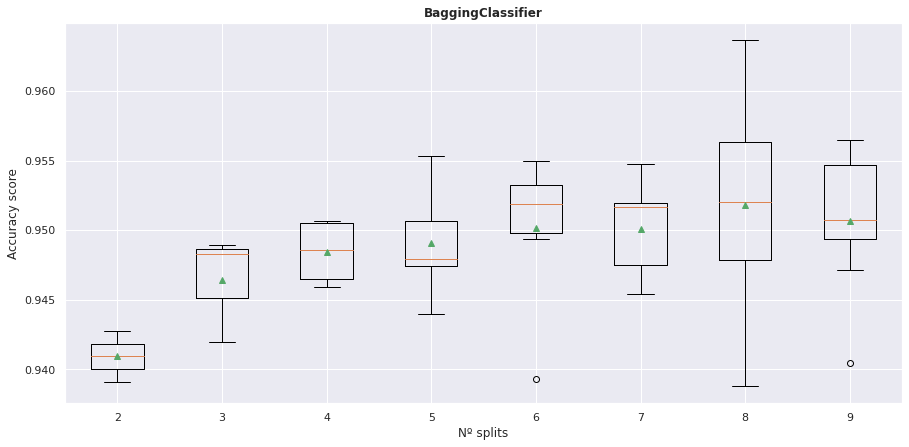


23:18:55: Model: RandomForestClassifier
23:18:55:  N splits: 2
23:18:55:    Accuracy scores: [0.921 0.917]
	     Mean (std): 	0.919 (0.00193)
23:18:55:  N splits: 3
23:18:55:    Accuracy scores: [0.926 0.926 0.916]
	     Mean (std): 	0.923 (0.00311)
23:18:55:  N splits: 4
23:18:55:    Accuracy scores: [0.925 0.928 0.926 0.924]
	     Mean (std): 	0.926 (0.00074)
23:18:55:  N splits: 5
23:18:55:    Accuracy scores: [0.926 0.927 0.932 0.924 0.928]
	     Mean (std): 	0.928 (0.00137)
23:18:55:  N splits: 6
23:18:55:    Accuracy scores: [0.928 0.926 0.927 0.934 0.919 0.928]
	     Mean (std): 	0.927 (0.00192)
23:18:55:  N splits: 7
23:18:55:    Accuracy scores: [0.927 0.924 0.929 0.936 0.925 0.917 0.932]
	     Mean (std): 	0.927 (0.00231)
23:18:55:  N splits: 8
23:18:55:    Accuracy scores: [0.933 0.925 0.936 0.933 0.929 0.932 0.917 0.931]
	     Mean (std): 	0.930 (0.00216)
23:18:55:  N splits: 9
23:18:55:    Accuracy scores: [0.933 0.922 0.929 0.933 0.932 0.93  0.925 0.919 0.934]
	     Mean

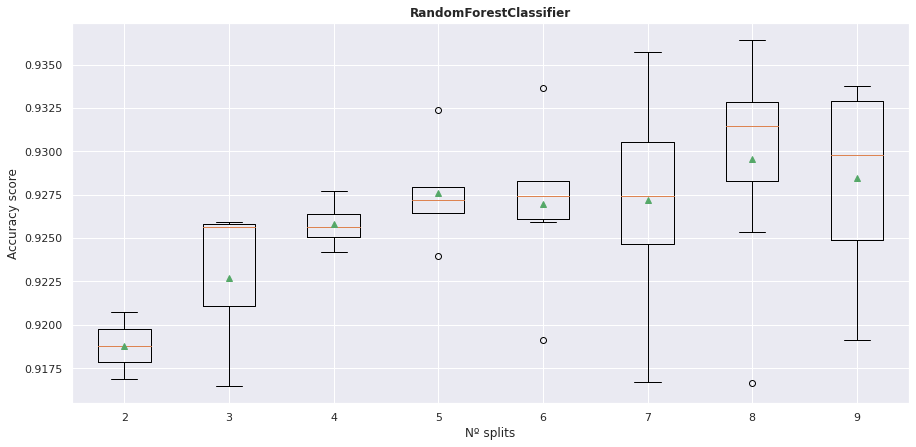

,2,3,4,5,6,7,8,9
LogisticRegression,[0.9792654 0.9732425],[0.98237559 0.98193128 0.97615521],[0.98262243 0.9849921 0.98163507 0.97887046],[0.98321816 0.98469514 0.98370773 0.98099235 0...,[0.98400474 0.98400474 0.98548578 0.98400474 0...,[0.98445059 0.98203179 0.98686938 0.98514167 0...,[0.98380727 0.98301738 0.98459716 0.98775671 0...,[0.9848956 0.98089738 0.98800533 0.98667259 0...
RidgeClassifier,[0.92969984 0.92584913],[0.93024289 0.9305391 0.92402251],[0.92851501 0.93246445 0.92733017 0.92555292],[0.9316387 0.92643792 0.9343372 0.92322883 0...,[0.93453791 0.9271327 0.93157583 0.930391 0...,[0.93469247 0.92294402 0.93227367 0.93711126 0...,[0.93404423 0.92417062 0.93167457 0.93404423 0...,[0.93558418 0.9253665 0.93114171 0.93025322 0...
KNeighborsClassifier,[0.87519747 0.87825829],[0.87470379 0.88492299 0.87588863],[0.8728278 0.88230648 0.88171406 0.87480253],[0.87438302 0.87731424 0.89237225 0.87509257 0...,[0.87470379 0.87440758 0.88033175 0.88655213 0...,[0.87387699 0.87042156 0.88527989 0.8894264 0...,[0.87124803 0.87401264 0.88230648 0.88191153 0...,[0.87561084 0.87161262 0.88138605 0.88405153 0...
SVC,[0.90294234 0.90067141],[0.91276659 0.91513626 0.90239929],[0.91311216 0.91607425 0.91291469 0.90896524],[0.91781836 0.91286102 0.92594421 0.90817082 0...,[0.92328199 0.9132109 0.92120853 0.92268957 0...,[0.92398065 0.91015895 0.92259848 0.92881824 0...,[0.92219589 0.914297 0.92180095 0.92417062 0...,[0.92358952 0.91914705 0.91914705 0.92003554 0...
BaggingClassifier,[0.93907978 0.94273302],[0.94194313 0.94831161 0.94890403],[0.94589258 0.95063191 0.95043444 0.94668246],[0.94397828 0.95062947 0.9479141 0.95531967 0...,[0.94934834 0.93927725 0.95349526 0.9549763 0...,[0.95162405 0.94540428 0.94782308 0.95162405 0...,[0.95616114 0.93878357 0.95418641 0.94984202 0...,[0.95646379 0.9404709 0.95068858 0.95246557 0...
RandomForestClassifier,[0.92071485 0.91686414],[0.92565166 0.92594787 0.91646919],[0.92535545 0.92772512 0.92594787 0.92417062],[0.92645607 0.92717847 0.93236238 0.92396939 0...,[0.92831754 0.92594787 0.92654028 0.93364929 0...,[0.92743607 0.92398065 0.92881824 0.93572909 0...,[0.9328594 0.92535545 0.9364139 0.9328594 0...,[0.9329187 0.92181253 0.92892048 0.9329187 0...


In [39]:
#Train models and make predictions.
max_splits = 10
n_splits = range(2,max_splits)
kfcv_filename = 'kfcv_{}'.format(max_splits)
kfcv_filename_path = os.path.join(exe04_tables_path, kfcv_filename)

if os.path.isfile(kfcv_filename_path+".pkl"):
    # load existing model
    print("\n{}: loading k-Fold Cross-Validation Scores:\t{}".format(timenow(), kfcv_filename))
    kfcv_df = pd.read_csv(kfcv_filename_path+".csv", index_col=0)
    kfcv_file = open(kfcv_filename_path+".pkl", "rb")
    model_kfcv_results = pickle.load(kfcv_file)
    kfcv_means_df = pd.DataFrame(index=model_kfcv_results.keys(), columns=n_splits)
    for model_str, kfcv_results in model_kfcv_results.items():
        print("\n{}: Model: {}".format(timenow(), model_str))
        for score in kfcv_results:
            print("{}:  N splits: {}".format(timenow(),len(score)))
            print("{}:    Accuracy scores: {}\n\t     Mean (std): \t{:.3f} ({:.5f})".format(timenow(),score.round(3), np.mean(score), sem(score)))
            kfcv_means_df.loc[model_str,len(score)] = np.mean(score)
        plt.boxplot(kfcv_results, showmeans=True, labels=n_splits)
        plt.xlabel("Nº splits")
        plt.ylabel("Accuracy score")
        plt.title(model_str, fontweight = "bold")
        filename = model_str+"-K-fold_cv.png"
        plt.savefig(os.path.join(exe04_plots_path, filename))
        plt.show()
else:    
    model_kfcv_results = dict()
    for model in selected_classifiers:
        model_str = str(model).split("(")[0]
        print("\n{}: Model: {}".format(timenow(), model_str))
        kfcv_results = list()
        for n_s in n_splits:
            print("{}:  N splits: {}".format(timenow(),n_s))
            # evaluate using a given number of repeats
            scores = kfcv_evaluator_class(X, y,model, n_s)
            # summarize
            print("{}:    Accuracy scores: {}\n\t     Mean (std): \t{:.3f} ({:.5f})".format(timenow(),scores.round(3), np.mean(scores), sem(scores)))
            # store
            kfcv_results.append(scores)
        model_kfcv_results[model_str] = kfcv_results

        plt.boxplot(kfcv_results, showmeans=True, labels=n_splits)
        plt.xlabel("Nº splits")
        plt.ylabel("Accuracy score")
        plt.title(model_str, fontweight = "bold")
        
        filename = model_str+"-K-fold_cv.png"
        plt.savefig(os.path.join(exe04_plots_path, filename))
        plt.show()
    
    kfcv_file = open(kfcv_filename_path+".pkl", "wb")
    pickle.dump(model_kfcv_results, kfcv_file)
    kfcv_file.close()
    kfcv_df = pd.DataFrame.from_dict(model_kfcv_results, orient='index', columns=n_splits)
    kfcv_df.to_csv(kfcv_filename_path+".csv")

display(kfcv_df)

1.   We calculate the mean of the results obtained in each model and by number of splits.
2. The results are plotted to see the effect of the number of splits on each model.

,2,3,4,5,6,7,8,9
LogisticRegression,0.976254,0.980154,0.98203,0.982771,0.983017,0.983313,0.98356,0.983758
RidgeClassifier,0.927774,0.928268,0.928466,0.92886,0.929107,0.928762,0.92891,0.928909
KNeighborsClassifier,0.876728,0.878505,0.877913,0.878555,0.877863,0.877962,0.877419,0.878406
SVC,0.901807,0.910101,0.912767,0.915778,0.916963,0.91795,0.918543,0.918986
BaggingClassifier,0.940906,0.946386,0.94841,0.949052,0.950138,0.950089,0.951817,0.950632
RandomForestClassifier,0.918789,0.92269,0.9258,0.927577,0.926985,0.927182,0.929552,0.928465


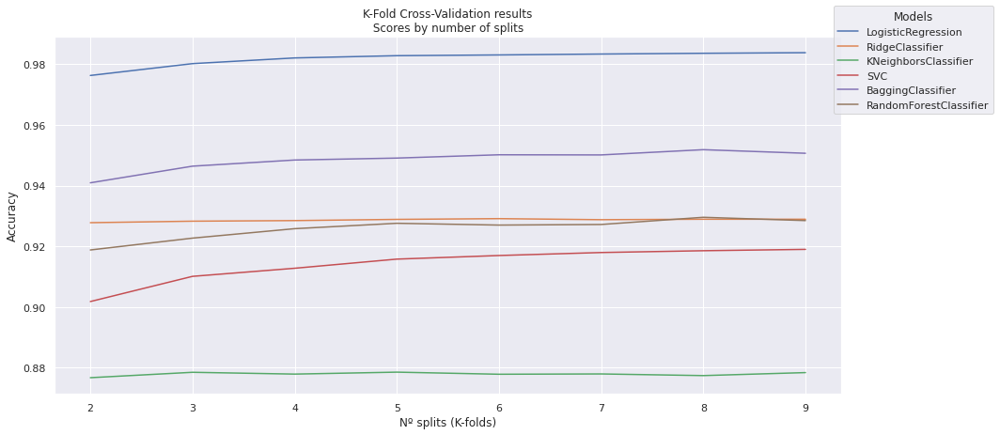

In [40]:
kfcv_file = open(kfcv_filename_path+".pkl", "rb")
model_kfcv_results = pickle.load(kfcv_file)

kfcv_means_df = pd.DataFrame(index=model_kfcv_results.keys(), columns=n_splits)
for model_str, kfcv_results in model_kfcv_results.items():
    for score in kfcv_results:
        kfcv_means_df.loc[model_str,len(score)] = np.mean(score)
kfcv_means_df.to_csv(kfcv_filename_path+"_means.csv")
kfcv_means_df = kfcv_means_df.round(3)
display(kfcv_means_df)

for model in kfcv_means_df.index:
    plt.plot(kfcv_means_df.loc[model], label = model)

plt.xlabel("Nº splits (K-folds)")
plt.ylabel("Accuracy")
plt.title("K-Fold Cross-Validation results\n Scores by number of splits ")
plt.legend(title="Models",loc='upper right', bbox_to_anchor=(0.7, 0.6, 0.5, 0.5))
plt.show()

We find that by means of this internal validation method we do obtain better results than by train test approach.

We see that increasing the number of k has a small positive effect.

## Repeated k-Fold Cross-Validation (internal validation)

Repeats K-Fold n times with different randomization in each repetition.

We will be increasing the K from 2 to 4  and the number or repetitions from 1 to 3.


23:18:56: Model: LogisticRegression

23:18:56: loading Repeated k-Fold Cross-Validation Scores:	/content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe04/exe04_tables/rkfcv_5_4-LogisticRegression.sav

23:18:56: Model: RidgeClassifier

23:18:56: loading Repeated k-Fold Cross-Validation Scores:	/content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe04/exe04_tables/rkfcv_5_4-RidgeClassifier.sav

23:18:56: Model: KNeighborsClassifier

23:18:56: loading Repeated k-Fold Cross-Validation Scores:	/content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe04/exe04_tables/rkfcv_5_4-KNeighborsClassifier.sav

23:18:56: Model: SVC

23:18:56: loading Repeated k-Fold Cross-Validation Scores:	/content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classif

,model,n_splits,1,2,3
0,LogisticRegression,2,"[0.9792654028436019, 0.9732424960505529]","[0.9792654028436019, 0.9732424960505529, 0.976...","[0.9792654028436019, 0.9732424960505529, 0.976..."
1,LogisticRegression,3,"[0.9823755924170616, 0.981931279620853, 0.9761...","[0.9823755924170616, 0.981931279620853, 0.9761...","[0.9823755924170616, 0.981931279620853, 0.9761..."
2,LogisticRegression,4,"[0.9826224328593997, 0.9849921011058452, 0.981...","[0.9826224328593997, 0.9849921011058452, 0.981...","[0.9826224328593997, 0.9849921011058452, 0.981..."
3,RidgeClassifier,2,"[0.9296998420221169, 0.925849131121643]","[0.9296998420221169, 0.925849131121643, 0.9305...","[0.9296998420221169, 0.925849131121643, 0.9305..."
4,RidgeClassifier,3,"[0.9302428909952607, 0.9305390995260664, 0.924...","[0.9302428909952607, 0.9305390995260664, 0.924...","[0.9302428909952607, 0.9305390995260664, 0.924..."
5,RidgeClassifier,4,"[0.9285150078988942, 0.9324644549763034, 0.927...","[0.9285150078988942, 0.9324644549763034, 0.927...","[0.9285150078988942, 0.9324644549763034, 0.927..."
6,KNeighborsClassifier,2,"[0.8751974723538705, 0.8782582938388626]","[0.8751974723538705, 0.8782582938388626, 0.875...","[0.8751974723538705, 0.8782582938388626, 0.875..."
7,KNeighborsClassifier,3,"[0.8747037914691943, 0.8849229857819905, 0.875...","[0.8747037914691943, 0.8849229857819905, 0.875...","[0.8747037914691943, 0.8849229857819905, 0.875..."
8,KNeighborsClassifier,4,"[0.872827804107425, 0.882306477093207, 0.88171...","[0.872827804107425, 0.882306477093207, 0.88171...","[0.872827804107425, 0.882306477093207, 0.88171..."
9,SVC,2,"[0.9029423380726699, 0.9006714060031595]","[0.9029423380726699, 0.9006714060031595, 0.903...","[0.9029423380726699, 0.9006714060031595, 0.903..."


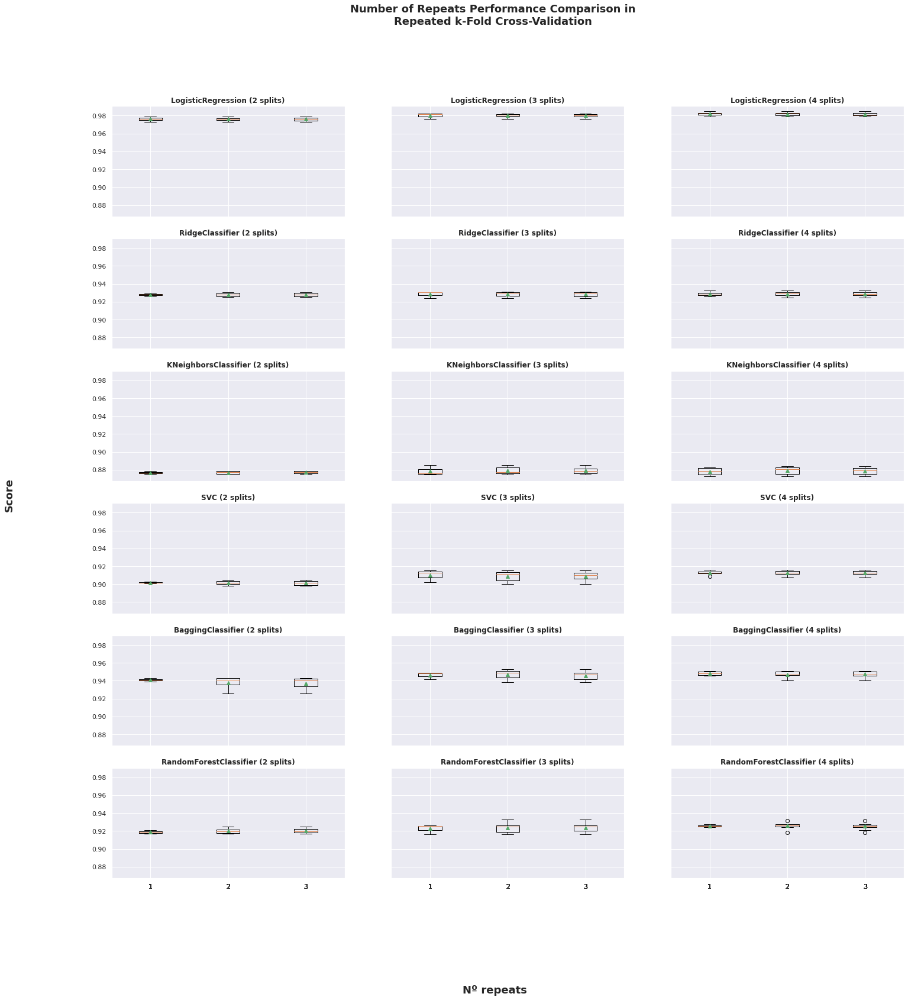

In [41]:
#Train models and make predictions.

max_splits = 5
max_repeats = 4
n_splits = range(2,max_splits)
n_repeats = range(1,max_repeats)

rkfcv_filename = 'rkfcv_{}_{}'.format(max_splits,max_repeats)
rkfcv_filename_path = os.path.join(exe04_tables_path, rkfcv_filename)
rkfcv_results = dict()
for model in selected_classifiers:
    model_str = str(model).split("(")[0]
    model_filename = rkfcv_filename_path+'-'+model_str+".sav"
    print("\n{}: Model: {}".format(timenow(), model_str))
    if os.path.isfile(model_filename):
        print("\n{}: loading Repeated k-Fold Cross-Validation Scores:\t{}".format(timenow(), model_filename))
        model_file = open(model_filename, "rb")
        model_rkfcv_scores = pickle.load(model_file)
        model_file.close()
        rkfcv_results[model_str] = model_rkfcv_scores
    else:
        model_rkfcv_scores = dict()
        for n_s in n_splits:
            print("{}:\tN splits: {}".format(timenow(),n_s))
            reps_rkfcv_results = dict() 
            for n_r in n_repeats:
                print("{}:\t\tN repeats: {}".format(timenow(),n_r))
                scores = rkfcv_evaluator_class(X, y,model, n_s, n_r)
                print("{}:\t\t\tAccuracy scores:\t{}\n\t\t\t\tMean (std):\t{:.6f} ({:.6f})".format(timenow(),scores, np.mean(scores), sem(scores)))
                reps_rkfcv_results[n_r] = scores
            model_rkfcv_scores[n_s] = reps_rkfcv_results
        model_file = open(model_filename, "wb")
        pickle.dump(model_rkfcv_scores, model_file)
        model_file.close()
        rkfcv_results[model_str] = model_rkfcv_scores

rkfcv_df = rkfcv_to_df(rkfcv_results)
display(rkfcv_df)
plot_rkfcv(rkfcv_df)

1.   We calculate the mean of the results obtained in each model and by number of splits and number of repeats.
2. The results are plotted to see the effect of the number of repeats on each model.

LogisticRegression


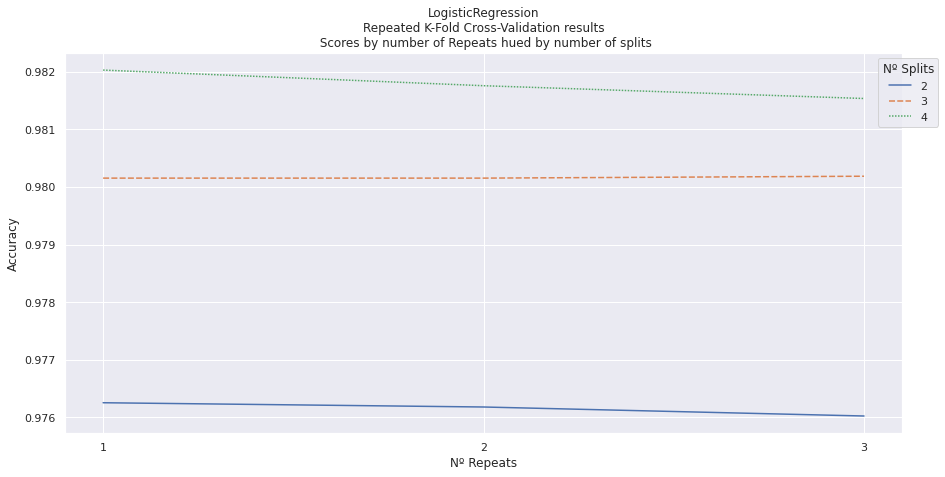

RidgeClassifier


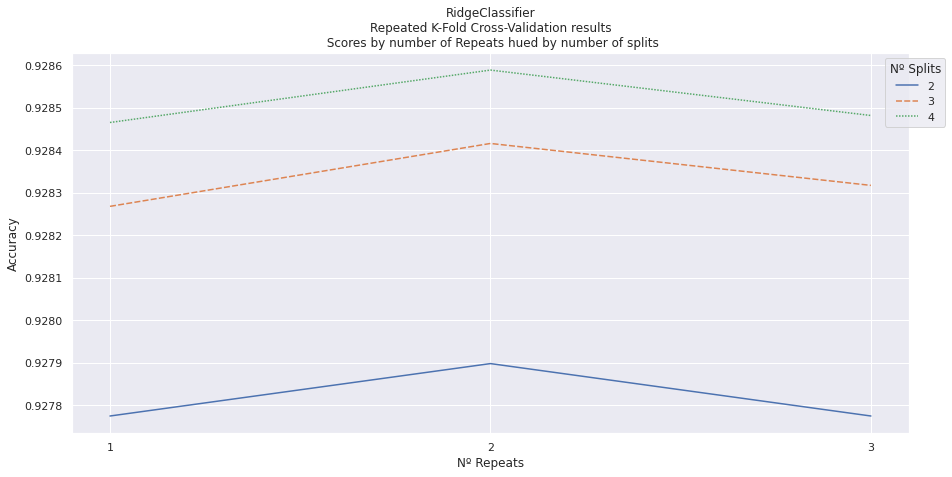

KNeighborsClassifier


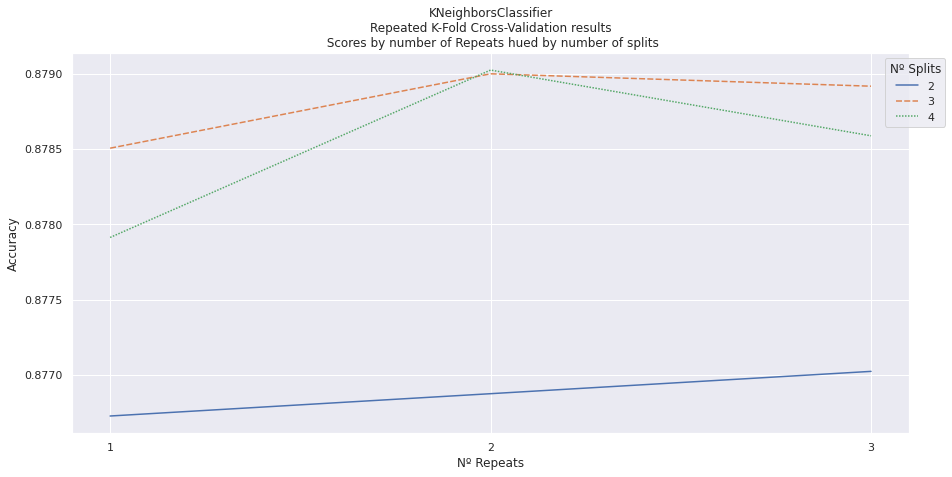

SVC


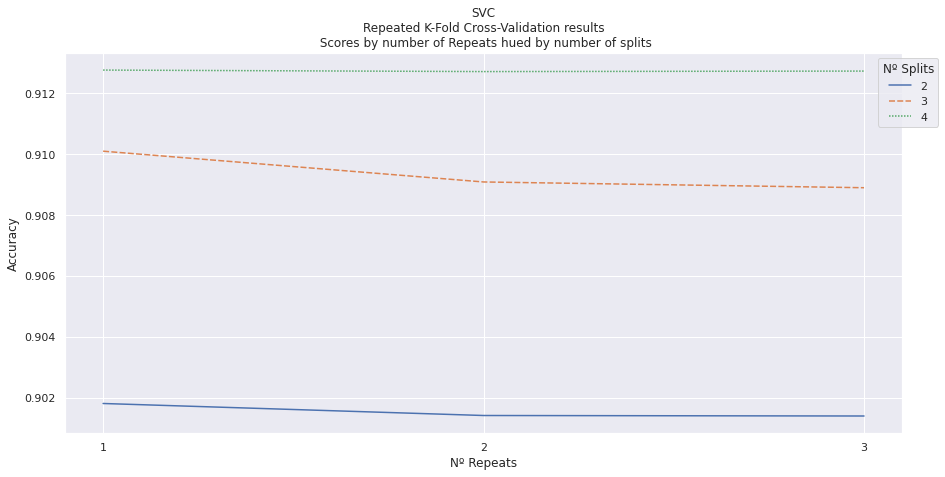

BaggingClassifier


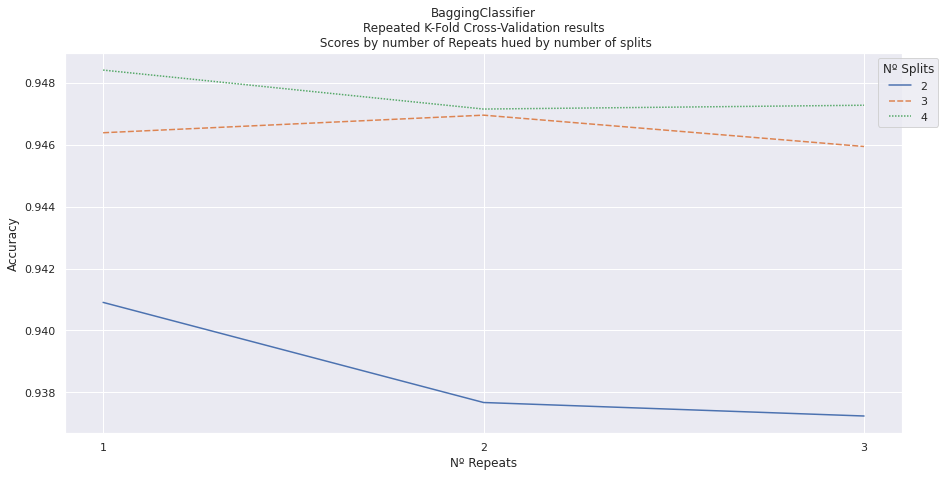

RandomForestClassifier


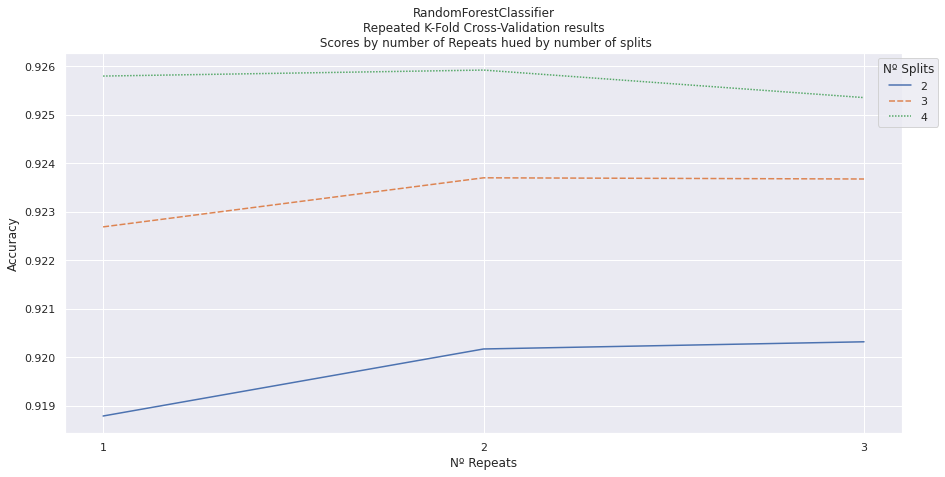

In [42]:
rkfcv_df.loc[:,"1":] = rkfcv_df.loc[:,"1":].applymap(np.mean)

for model in selected_classifiers:
    model_str = str(model).split("(")[0]
    print(model_str)
    rkfcv_model_results = rkfcv_df[rkfcv_df.model ==model_str]
    rkfcv_model_results.drop('model',axis=1, inplace=True)
    rkfcv_model_results.set_index('n_splits', inplace=True)
    sns.lineplot(data=rkfcv_model_results.T)
    plt.xlabel("Nº Repeats")
    plt.ylabel("Accuracy")
    plt.title("{}\nRepeated K-Fold Cross-Validation results\n Scores by number of Repeats hued by number of splits".format(model_str))
    plt.legend(title="Nº Splits",loc='upper right', bbox_to_anchor=(0.55, 0.5, 0.5, 0.5))
    plt.show()

At the same number of splits, in any model increasing repetitions does not generate better results but in the model `KNeighborsClassifier`


# Exercise 5: 
  - Perform some variable engineering process to improve prediction

In [43]:
mk_dir("exe05")
exe05_models_path = mk_dir("exe05/exe05_models")
exe05_tables_path = mk_dir("exe05/exe05_tables")
exe05_plots_path = mk_dir("exe05/exe05_plots")

Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe05
Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe05/exe05_models
Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe05/exe05_tables
Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe05/exe05_plots


In [44]:
df = pd.read_csv("DelayedFlights_Processed.csv", index_col=0)


From "DepTime" we extract the hour and minutes and assemble them with the variables "Year", "Month" and "DayofMonth" to then convert DepTime to datetime format (YYYY-MM-DD HH:MM:SS).

In [45]:
df["DepTime"] = pd.to_datetime(dict(year=df.Year,
                                    month=df.Month,
                                    day=df.DayofMonth,
                                    hour=[t.hour for t in df.DepTime.apply(numToTime)],
                                    minute=[t.minute for t in df.DepTime.apply(numToTime)]))

Convert "DepDelay" to timedelta, so we can use it to obtain absolute differences in times.

In [46]:
df["DepDelay"] = pd.to_timedelta(df["DepDelay"], unit='m')

Now we can get the "CRSDepTime" in datetime format by subtracting the "DepDelay" from the "DepTime"

In [47]:
df["CRSDepTime"] = df["DepTime"] - df["DepDelay"]

Now we to transform the "DepDelay" from timedelta back to minutes

In [48]:
df["DepDelay"] = df.DepDelay.dt.seconds/60

We sort the records, reindex and eliminate the variables "Year", "Month", "DayofMonth", "DayOfWeek".

In [49]:
df.sort_values(by=["CRSDepTime","DepTime"], inplace=True)
df.reset_index(drop=True, inplace=True)
df = df.drop(["Year","Month","DayofMonth","DayOfWeek"], axis=1)

Now that we have "DepTime" and "CRSDepTime" in datetime format we can extract new features.

Extract cyclic time related features

In [50]:
df["DepTime_hour"] = df.DepTime.dt.hour
df["DepTime_minute"] = df.DepTime.dt.minute
df["DepTime_month"] = df.DepTime.dt.month
df["DepTime_day"] = df.DepTime.dt.day
df["DepTime_dayofweek"] = df.DepTime.dt.dayofweek
df["DepTime_weekofyear"] = df.DepTime.dt.weekofyear
df["DepTime_dayofyear"] = df.DepTime.dt.dayofyear
df["DepTime_quarter"] = df.DepTime.dt.quarter

df["CRSDepTime_day"] = df.CRSDepTime.dt.day
df["CRSDepTime_hour"] = df.CRSDepTime.dt.hour
df["CRSDepTime_minute"] = df.CRSDepTime.dt.minute

Extract number of days in the month.

In [51]:
df["DepTime_daysinmonth"] = df.DepTime.dt.daysinmonth

Extract bolean features

In [52]:
df["DepTime_is_month_start"] = df.DepTime.dt.is_month_start
df["DepTime_is_month_end"] = df.DepTime.dt.is_month_end
df["DepTime_is_quarter_start"] = df.DepTime.dt.is_quarter_start
df["DepTime_is_quarter_end"] = df.DepTime.dt.is_quarter_end
df["DepTime_is_year_start"] = df.DepTime.dt.is_year_start
df["DepTime_is_year_end"] = df.DepTime.dt.is_year_end

Now we can drop "DepTime","CRSDepTime" 

In [53]:
df = df.drop(["DepTime","CRSDepTime"], axis=1)

Convert the boolean values into integer value

In [54]:
bool_cols = df.select_dtypes(include=["bool"]).columns.tolist()
df[bool_cols] =  df[bool_cols].astype(int)

Encode cyclical features such as all time related features into an angular distance by calculating the cosinus and sinus values of the degree.


In [55]:
cyclic_cols = ['ArrTime', 'CRSArrTime','DepTime_month', 'DepTime_day', 
               'DepTime_hour', 'DepTime_minute', 'DepTime_weekofyear', 
               'DepTime_dayofweek', 'DepTime_dayofyear', 'DepTime_quarter', 
               'CRSDepTime_day', 'CRSDepTime_hour', 'CRSDepTime_minute']
               
cyclical = CyclicalTransformer(variables=cyclic_cols, drop_original=True)
df = cyclical.fit_transform(df)

Drop Categorical Variables we are not going to use

In [56]:
df = df.drop(["TailNum","Origin", "Dest", "FlightNum"], axis=1)

Transform Categorical Variables ("UniqueCarrie") to dummies.

In [57]:
df = pd.get_dummies(df)

Save engineered data.

In [58]:
df.to_csv("DelayedFlights_Engineered.csv")

Divide data into Explanatory and Response variables. 

In [59]:
X = df.drop(['ArrDelay'], axis = 'columns')
y = df['ArrDelay']

We scale the data and divide it into training and test sets

In [60]:
X = StandardScaler().fit_transform(X)

In [61]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=130)

We perform over-sampling using SMOTE.

In [62]:
sm = SMOTE(random_state=130)
X_train, y_train = sm.fit_resample(X_train, y_train)

Train models and make predictions.


23:19:06: Loading model:	05-DummyClassifier.pkl

23:19:06: Evaluate model:

Confusion matrix :
[[ 851    0]
 [7252    0]]
Normalized Confusion matrix:
[[1. 0.]
 [1. 0.]]


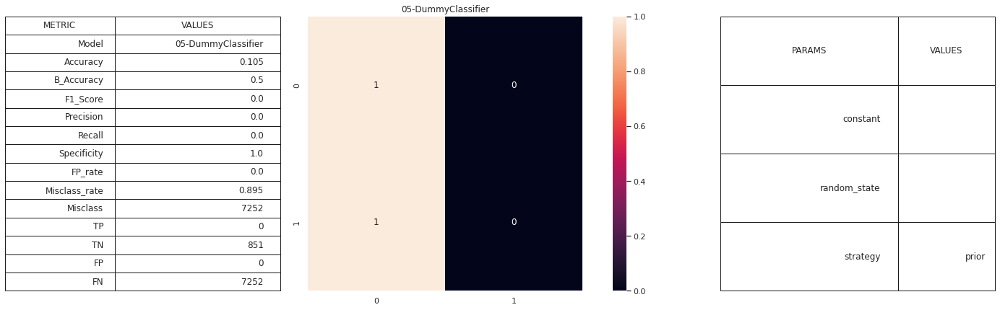


23:19:06: Loading model:	05-KNeighborsClassifier.pkl

23:19:06: Evaluate model:

Confusion matrix :
[[ 539  312]
 [2740 4512]]
Normalized Confusion matrix:
[[0.6333725  0.3666275 ]
 [0.37782681 0.62217319]]


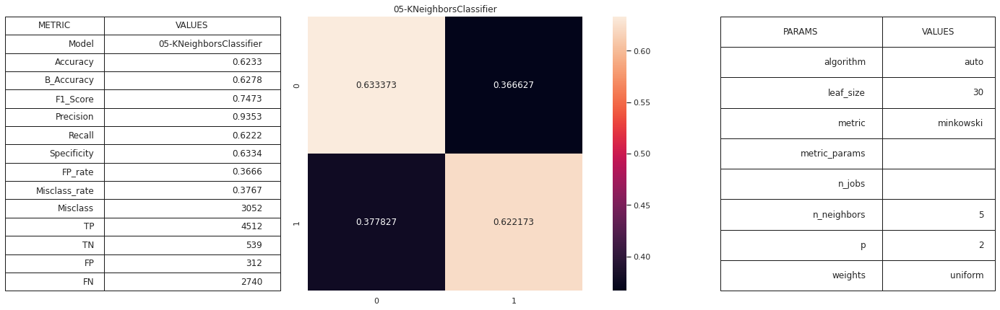


23:19:12: Loading model:	05-SVC.pkl

23:19:12: Evaluate model:

Confusion matrix :
[[ 643  208]
 [ 675 6577]]
Normalized Confusion matrix:
[[0.75558167 0.24441833]
 [0.09307777 0.90692223]]


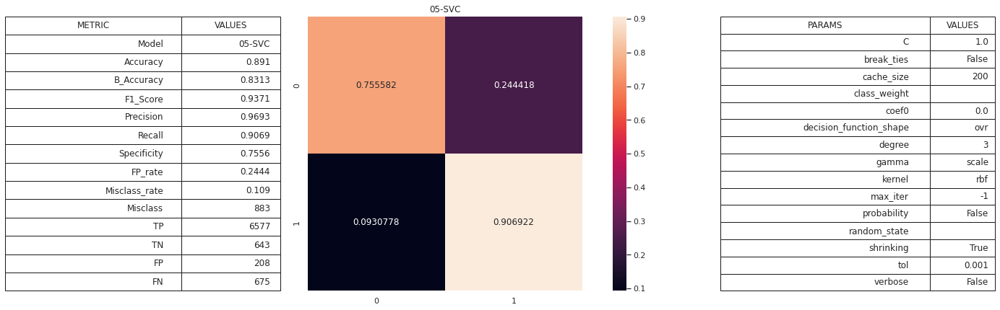


23:19:20: Loading model:	05-DecisionTreeClassifier.pkl

23:19:20: Evaluate model:

Confusion matrix :
[[ 470  381]
 [ 548 6704]]
Normalized Confusion matrix:
[[0.55229142 0.44770858]
 [0.07556536 0.92443464]]


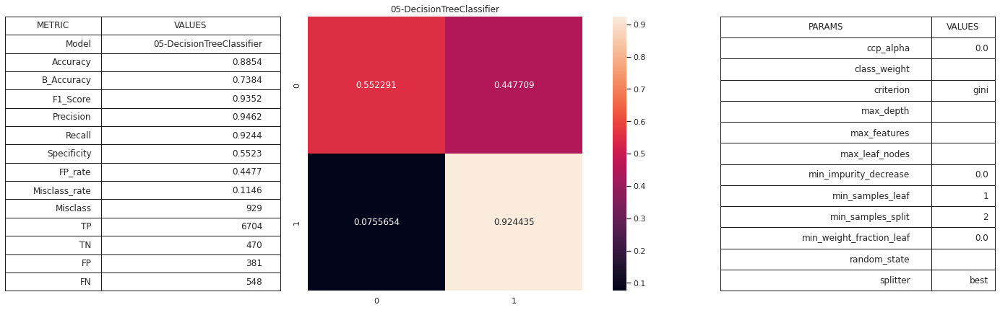


23:19:21: Loading model:	05-RandomForestClassifier.pkl

23:19:21: Evaluate model:

Confusion matrix :
[[ 476  375]
 [ 445 6807]]
Normalized Confusion matrix:
[[0.55934195 0.44065805]
 [0.06136238 0.93863762]]


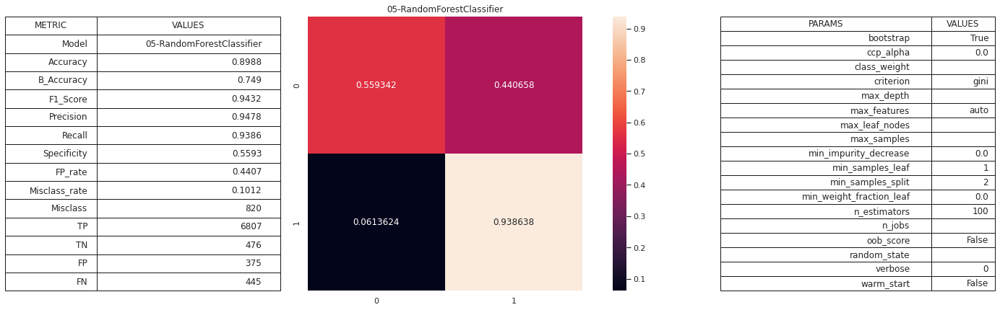


23:19:22: Loading model:	05-MLPClassifier.pkl

23:19:22: Evaluate model:

Confusion matrix :
[[ 692  159]
 [ 137 7115]]
Normalized Confusion matrix:
[[0.81316099 0.18683901]
 [0.01889134 0.98110866]]


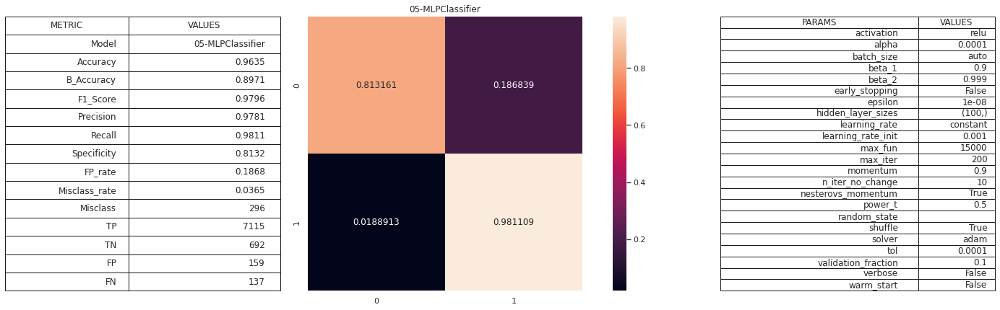


23:19:23: Loading model:	05-AdaBoostClassifier.pkl

23:19:23: Evaluate model:

Confusion matrix :
[[ 596  255]
 [ 787 6465]]
Normalized Confusion matrix:
[[0.70035253 0.29964747]
 [0.10852179 0.89147821]]


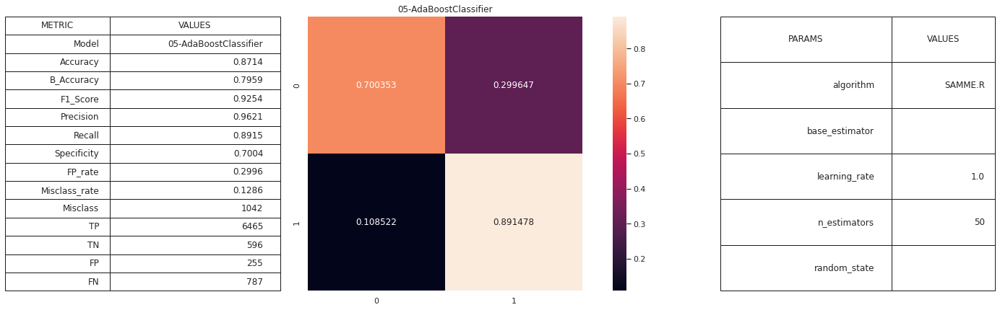


23:19:24: Loading model:	05-GaussianNB.pkl

23:19:24: Evaluate model:

Confusion matrix :
[[ 841   10]
 [2017 5235]]
Normalized Confusion matrix:
[[0.98824912 0.01175088]
 [0.27813017 0.72186983]]


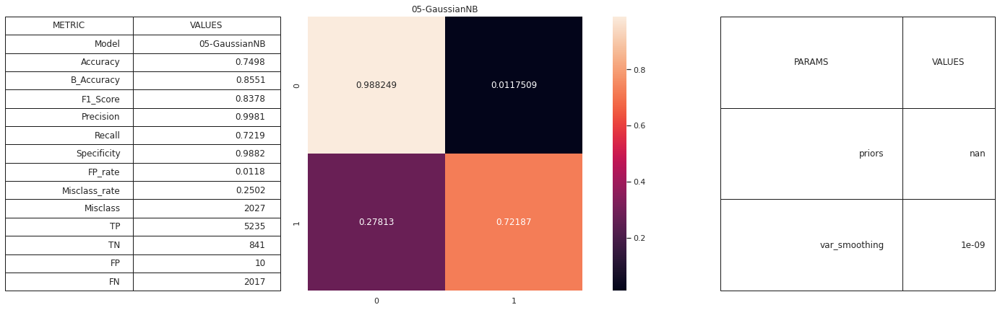


23:19:25: Loading model:	05-QuadraticDiscriminantAnalysis.pkl

23:19:25: Evaluate model:

Confusion matrix :
[[ 827   24]
 [1957 5295]]
Normalized Confusion matrix:
[[0.97179788 0.02820212]
 [0.26985659 0.73014341]]


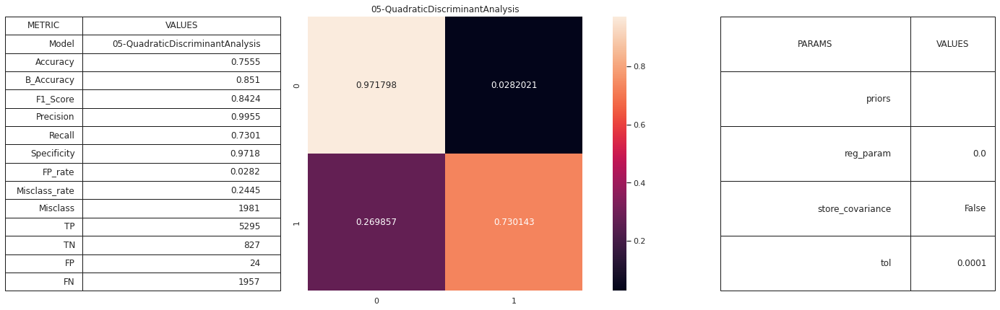


23:19:26: Loading model:	05-NearestCentroid.pkl

23:19:26: Evaluate model:

Confusion matrix :
[[ 591  260]
 [2187 5065]]
Normalized Confusion matrix:
[[0.69447709 0.30552291]
 [0.30157198 0.69842802]]


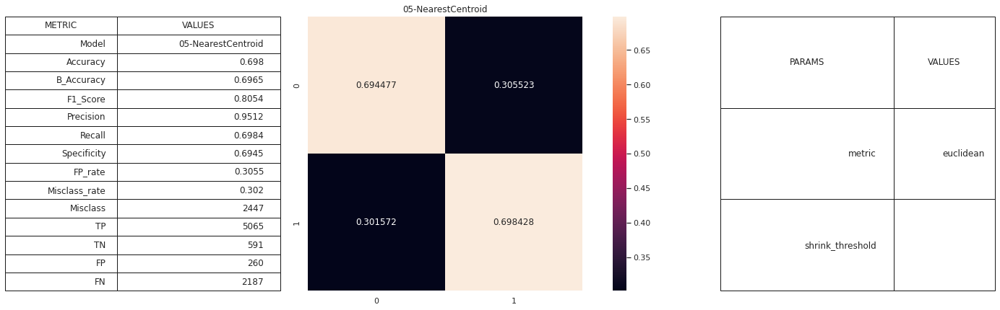


23:19:27: Loading model:	05-BaggingClassifier.pkl

23:19:27: Evaluate model:

Confusion matrix :
[[ 560  291]
 [ 607 6645]]
Normalized Confusion matrix:
[[0.65804935 0.34195065]
 [0.08370105 0.91629895]]


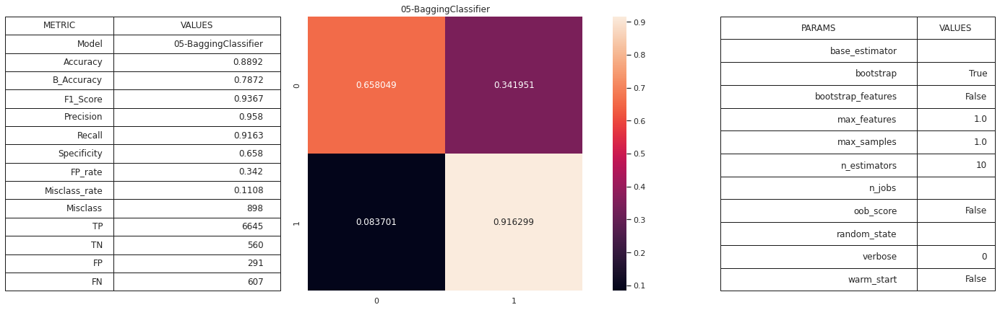


23:19:28: Loading model:	05-Perceptron.pkl

23:19:28: Evaluate model:

Confusion matrix :
[[ 839   12]
 [ 232 7020]]
Normalized Confusion matrix:
[[0.98589894 0.01410106]
 [0.03199117 0.96800883]]


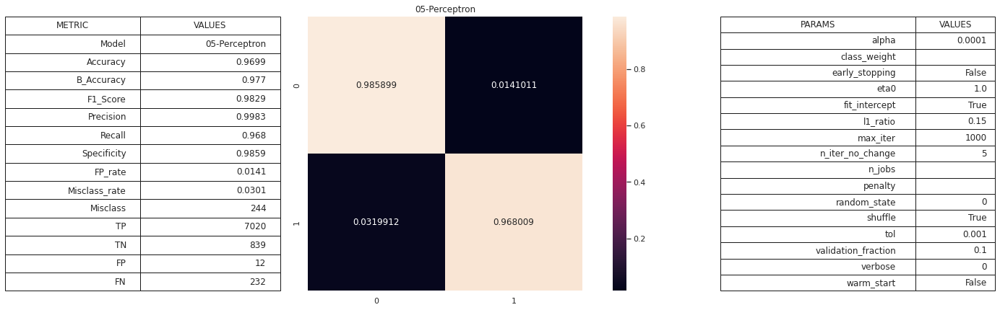


23:19:29: Loading model:	05-PassiveAggressiveClassifier.pkl

23:19:29: Evaluate model:

Confusion matrix :
[[ 843    8]
 [ 134 7118]]
Normalized Confusion matrix:
[[0.99059929 0.00940071]
 [0.01847766 0.98152234]]


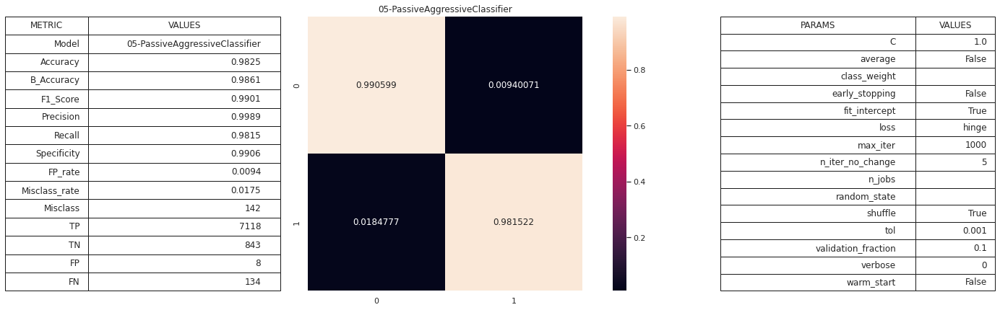


23:19:30: Loading model:	05-ExtraTreeClassifier.pkl

23:19:30: Evaluate model:

Confusion matrix :
[[ 346  505]
 [ 990 6262]]
Normalized Confusion matrix:
[[0.40658049 0.59341951]
 [0.13651407 0.86348593]]


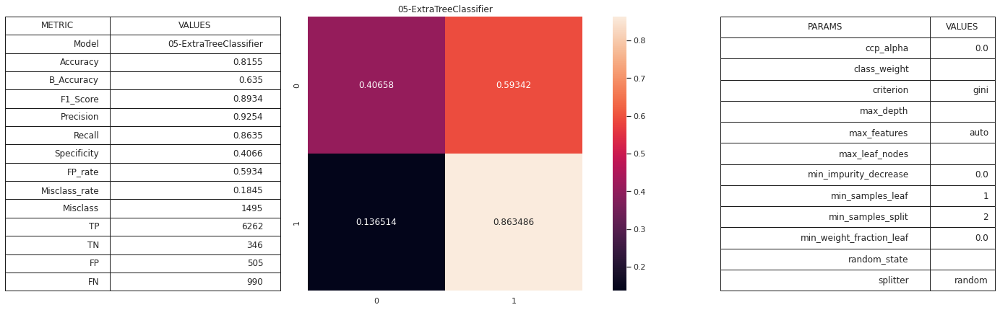


23:19:32: Loading model:	05-LabelSpreading.pkl

23:19:32: Evaluate model:

Confusion matrix :
[[ 358  493]
 [1779 5473]]
Normalized Confusion matrix:
[[0.42068155 0.57931845]
 [0.24531164 0.75468836]]


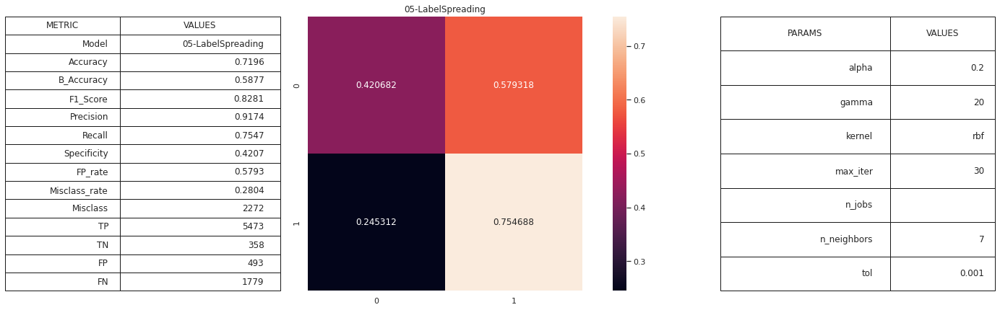


23:19:38: Loading model:	05-LabelPropagation.pkl

23:19:38: Evaluate model:

Confusion matrix :
[[ 358  493]
 [1779 5473]]
Normalized Confusion matrix:
[[0.42068155 0.57931845]
 [0.24531164 0.75468836]]


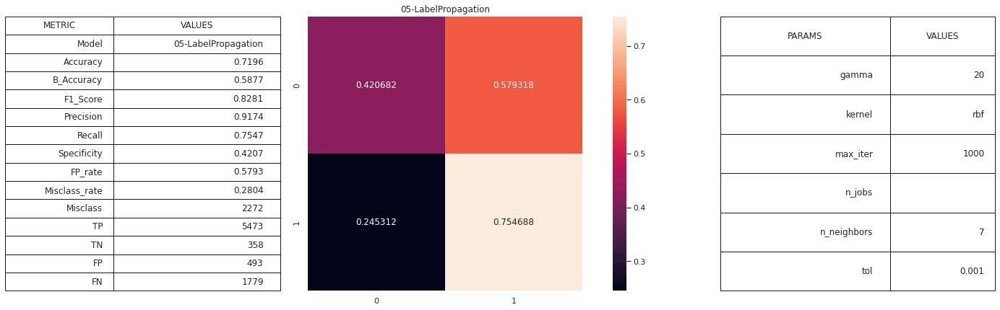


23:19:43: Loading model:	05-LogisticRegression.pkl

23:19:43: Evaluate model:

Confusion matrix :
[[ 849    2]
 [ 325 6927]]
Normalized Confusion matrix:
[[0.99764982 0.00235018]
 [0.04481522 0.95518478]]


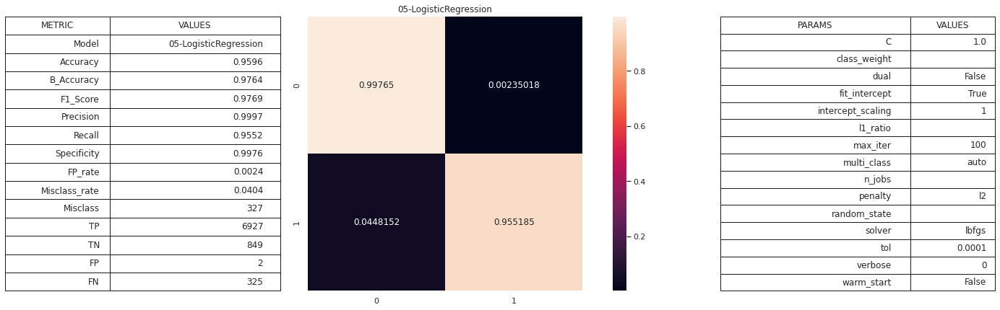


23:19:45: Loading model:	05-SGDClassifier.pkl

23:19:45: Evaluate model:

Confusion matrix :
[[ 828   23]
 [ 234 7018]]
Normalized Confusion matrix:
[[0.97297297 0.02702703]
 [0.03226696 0.96773304]]


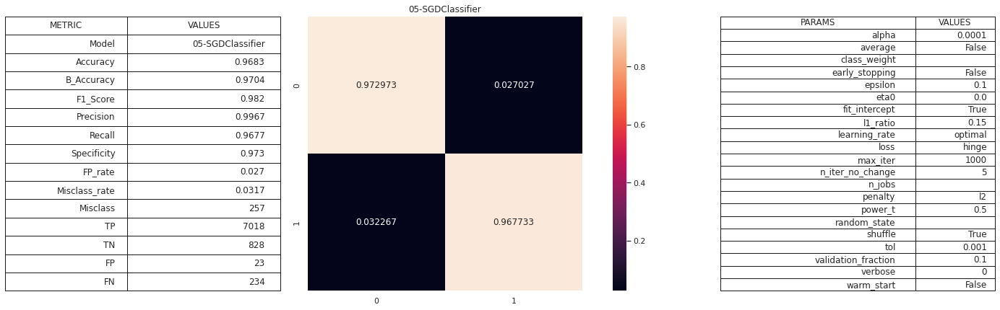


23:19:46: Loading model:	05-LinearDiscriminantAnalysis.pkl

23:19:46: Evaluate model:

Confusion matrix :
[[ 802   49]
 [ 162 7090]]
Normalized Confusion matrix:
[[0.94242068 0.05757932]
 [0.02233867 0.97766133]]


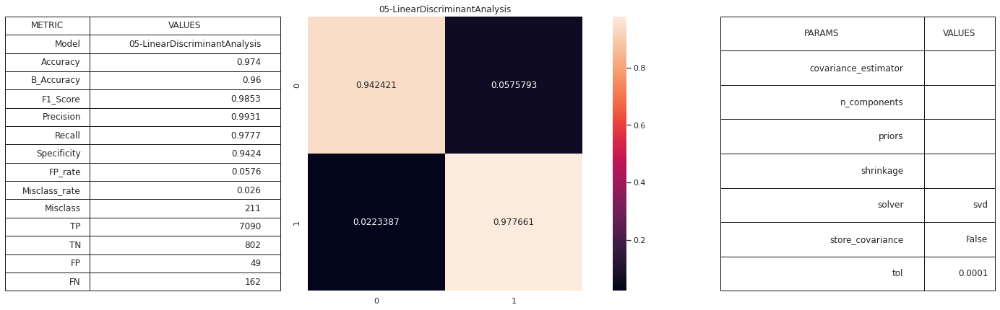


23:19:47: Loading model:	05-CalibratedClassifierCV.pkl

23:19:47: Evaluate model:

Confusion matrix :
[[ 851    0]
 [ 930 6322]]
Normalized Confusion matrix:
[[1.         0.        ]
 [0.12824049 0.87175951]]


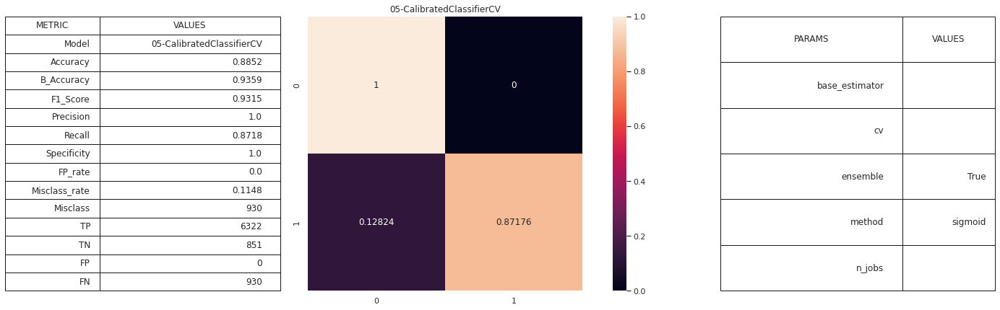


23:19:48: Loading model:	05-RidgeClassifier.pkl

23:19:48: Evaluate model:

Confusion matrix :
[[ 804   47]
 [ 175 7077]]
Normalized Confusion matrix:
[[0.94477086 0.05522914]
 [0.02413127 0.97586873]]


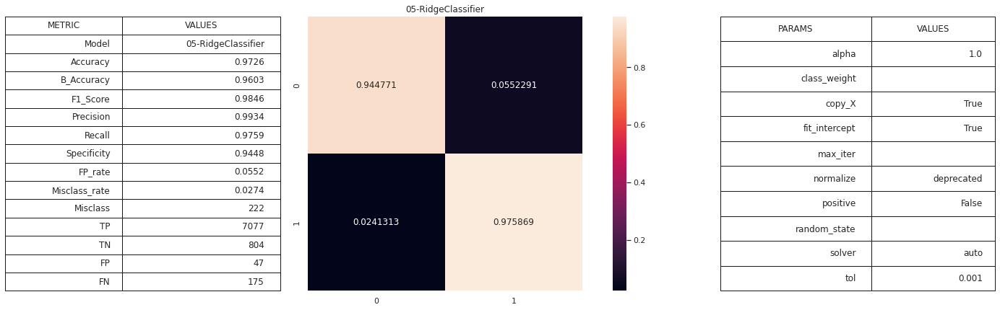


23:19:49: Loading model:	05-RidgeClassifierCV.pkl

23:19:49: Evaluate model:

Confusion matrix :
[[ 803   48]
 [ 163 7089]]
Normalized Confusion matrix:
[[0.94359577 0.05640423]
 [0.02247656 0.97752344]]


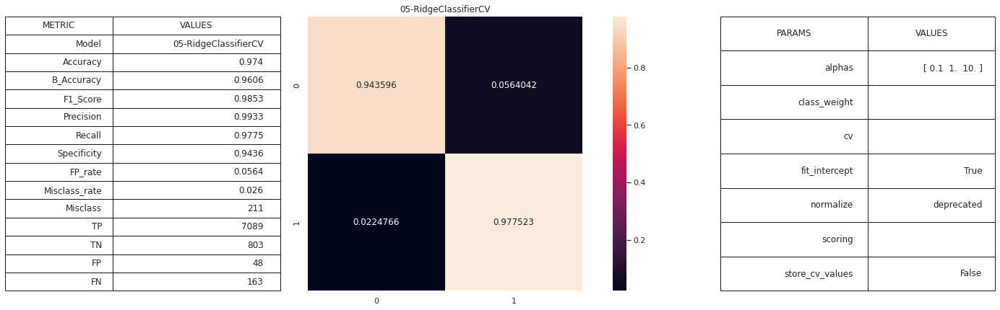


23:19:50: Loading model:	05-LinearSVC.pkl

23:19:50: Evaluate model:

Confusion matrix :
[[ 850    1]
 [ 136 7116]]
Normalized Confusion matrix:
[[0.99882491 0.00117509]
 [0.01875345 0.98124655]]


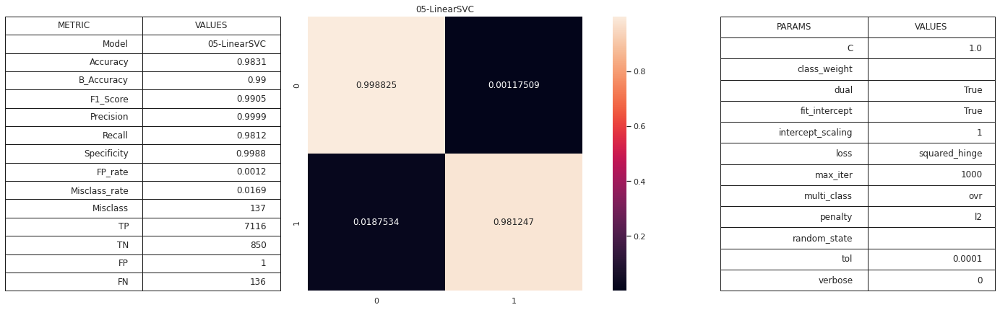


23:19:51: Loading model:	05-BernoulliNB.pkl

23:19:51: Evaluate model:

Confusion matrix :
[[ 742  109]
 [1799 5453]]
Normalized Confusion matrix:
[[0.87191539 0.12808461]
 [0.2480695  0.7519305 ]]


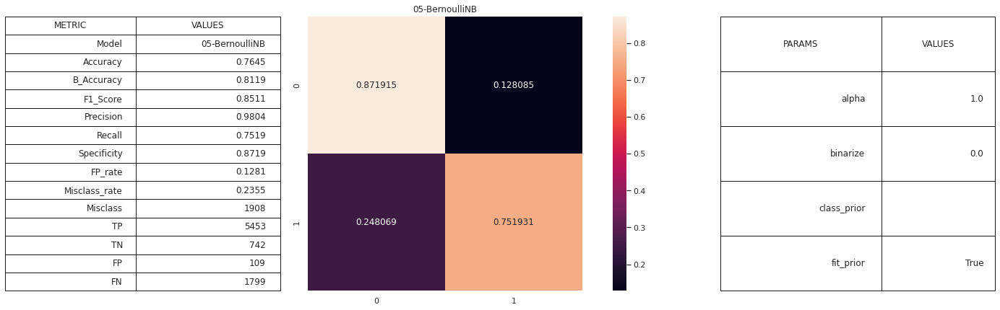


23:19:52: Loading model:	05-ExtraTreesClassifier.pkl

23:19:52: Evaluate model:

Confusion matrix :
[[ 253  598]
 [ 230 7022]]
Normalized Confusion matrix:
[[0.2972973  0.7027027 ]
 [0.03171539 0.96828461]]


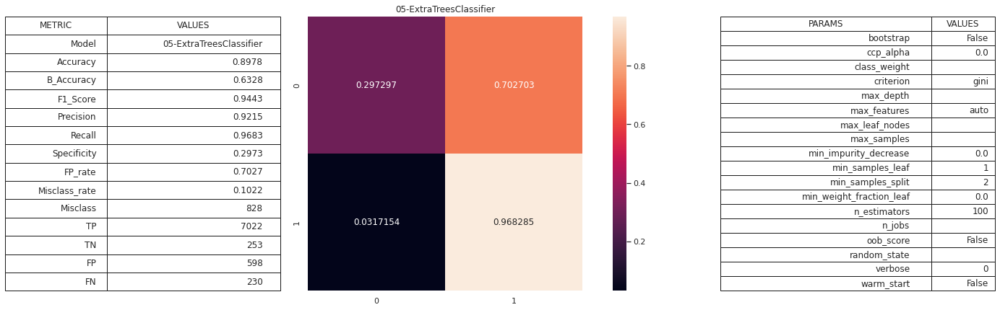


23:19:54: Loading model:	05-LGBMClassifier.pkl

23:19:54: Evaluate model:

Confusion matrix :
[[ 690  161]
 [ 186 7066]]
Normalized Confusion matrix:
[[0.81081081 0.18918919]
 [0.0256481  0.9743519 ]]


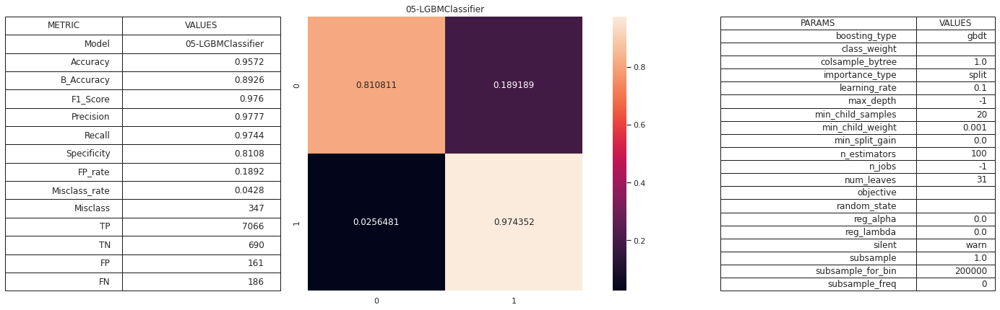


23:19:55: Loading model:	05-XGBClassifier.pkl

23:19:55: Evaluate model:

Confusion matrix :
[[ 671  180]
 [ 134 7118]]
Normalized Confusion matrix:
[[0.78848414 0.21151586]
 [0.01847766 0.98152234]]


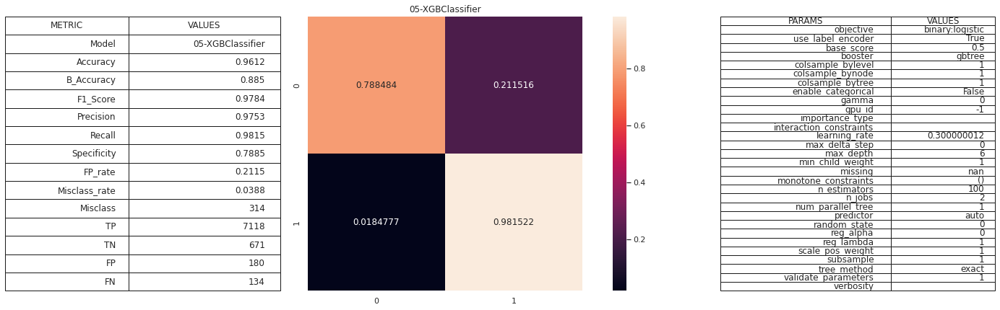

In [63]:
metrics_lst = []
for model in classifiers:
    # Model name 
    model_str = str(model).split("(")[0]
    model_name = '{}-{}'.format("05", model_str)
    # File name
    model_filename = model_name + ".pkl"
    model_filename_path = os.path.join(exe05_models_path, model_filename)
    if os.path.isfile(model_filename_path):
        # load existing model
        print("\n{}: Loading model:\t{}".format(timenow(), model_filename))
        model = pickle.load(open(model_filename_path, 'rb'))
    else:
        # Fit model
        print("\n{}: Start Fitting model:\t{}".format(timenow(), model_name))
        tiempo_inicio_fit = datetime.datetime.now()
        model.fit(X_train, y_train)
        fit_time = datetime.datetime.now() - tiempo_inicio_fit
        print("Fitting time:\t{}".format(fit_time))

        # save the model to disk
        pickle.dump(model, open(model_filename_path, 'wb'))

    # Evaluate model
    plt_path = os.path.join(exe05_plots_path, model_name + "_conf.png")
    print("\n{}: Evaluate model:\n".format(timenow()))
    metrics_lst.append(class_metrics(model, model_name, X_train, X_test, y_train, y_test, plt_path))
# Tabualate resulst
class_metrics_df = pd.DataFrame(metrics_lst)
class_metrics_df.set_index(keys="Model", inplace=True)
class_metrics_df.sort_values(by=["Accuracy"], ascending=False, inplace=True)
# Save results
class_metrics_df.to_csv(os.path.join(exe05_tables_path, "05-classification_metrics.csv"))

To see the effect of engineering on the predictions we will compare the results with those of exercise 1.

We combine the results of the two exercises.

In [64]:
metrics_01_path = os.path.join(exe01_tables_path, "01-classification_metrics.csv")
metrics_05_path = os.path.join(exe05_tables_path, "05-classification_metrics.csv")

metrics_lst = []
for metrics_file in [metrics_01_path, metrics_05_path]:
    
    all_metrics = pd.read_csv(metrics_file, index_col=0)
    metrics_lst.append(all_metrics)
final_metrics_df_1_5 = pd.concat(metrics_lst)

data_table.enable_dataframe_formatter()
data_table.DataTable(final_metrics_df_1_5, num_rows_per_page=final_metrics_df_1_5.shape[0])

,Accuracy,B_Accuracy,F1_Score,Precision,Recall,Specificity,FP_rate,Misclass_rate,Misclass,TP,TN,FP,FN
Model,,,,,,,,,,,,,
01-LinearSVC,0.9969,0.9854,0.9983,0.9966,1.0000,0.9708,0.0292,0.0031,25,7248,830,25,0
01-MLPClassifier,0.9883,0.9599,0.9935,0.9911,0.9959,0.9240,0.0760,0.0117,95,7218,790,65,30
01-PassiveAggressiveClassifier,0.9852,0.9680,0.9917,0.9936,0.9898,0.9462,0.0538,0.0148,120,7174,809,46,74
01-LogisticRegression,0.9825,0.9175,0.9903,0.9809,0.9999,0.8351,0.1649,0.0175,142,7247,714,141,1
01-Perceptron,0.9769,0.8989,0.9872,0.9769,0.9978,0.8000,0.2000,0.0231,187,7232,684,171,16
01-SGDClassifier,0.9769,0.9402,0.9871,0.9874,0.9868,0.8936,0.1064,0.0231,187,7152,764,91,96
01-LGBMClassifier,0.9683,0.8843,0.9824,0.9742,0.9908,0.7778,0.2222,0.0317,257,7181,665,190,67
01-XGBClassifier,0.9652,0.8815,0.9807,0.9739,0.9876,0.7754,0.2246,0.0348,282,7158,663,192,90
01-LinearDiscriminantAnalysis,0.9552,0.7882,0.9756,0.9524,0.9999,0.5766,0.4234,0.0448,363,7247,493,362,1


We print the model that obtains the best metric.

In [65]:
for model in classifiers:
    # Model name 
    model_str = str(model).split("(")[0]
    models_metric = final_metrics_df_1_5.filter(regex=model_str, axis=0)
    print("\n{}: ".format(model_str))
    print("{:<15} {:<10}".format("METRIC","BEST MODEL"))
    print("{:<15} {:<10}".format("-"*10,"-"*10))
    for metric in models_metric.columns:
        if metric in ["FP_rate","Misclass_rate","Misclass","FP","FN"]:
            ascend=True
        else:
            ascend=False
        models_metric.sort_values(by=metric, inplace=True, ascending=ascend)
        print("{:<15} {:<10}".format(metric,models_metric.head(1).index[0]))


DummyClassifier: 
METRIC          BEST MODEL
----------      ----------
Accuracy        01-DummyClassifier
B_Accuracy      01-DummyClassifier
F1_Score        01-DummyClassifier
Precision       01-DummyClassifier
Recall          01-DummyClassifier
Specificity     05-DummyClassifier
FP_rate         05-DummyClassifier
Misclass_rate   01-DummyClassifier
Misclass        01-DummyClassifier
TP              01-DummyClassifier
TN              05-DummyClassifier
FP              05-DummyClassifier
FN              01-DummyClassifier

KNeighborsClassifier: 
METRIC          BEST MODEL
----------      ----------
Accuracy        01-KNeighborsClassifier
B_Accuracy      05-KNeighborsClassifier
F1_Score        01-KNeighborsClassifier
Precision       05-KNeighborsClassifier
Recall          01-KNeighborsClassifier
Specificity     05-KNeighborsClassifier
FP_rate         05-KNeighborsClassifier
Misclass_rate   01-KNeighborsClassifier
Misclass        01-KNeighborsClassifier
TP              01-KNeighborsClass

For each metric we plot the models ordered from best to worst result.

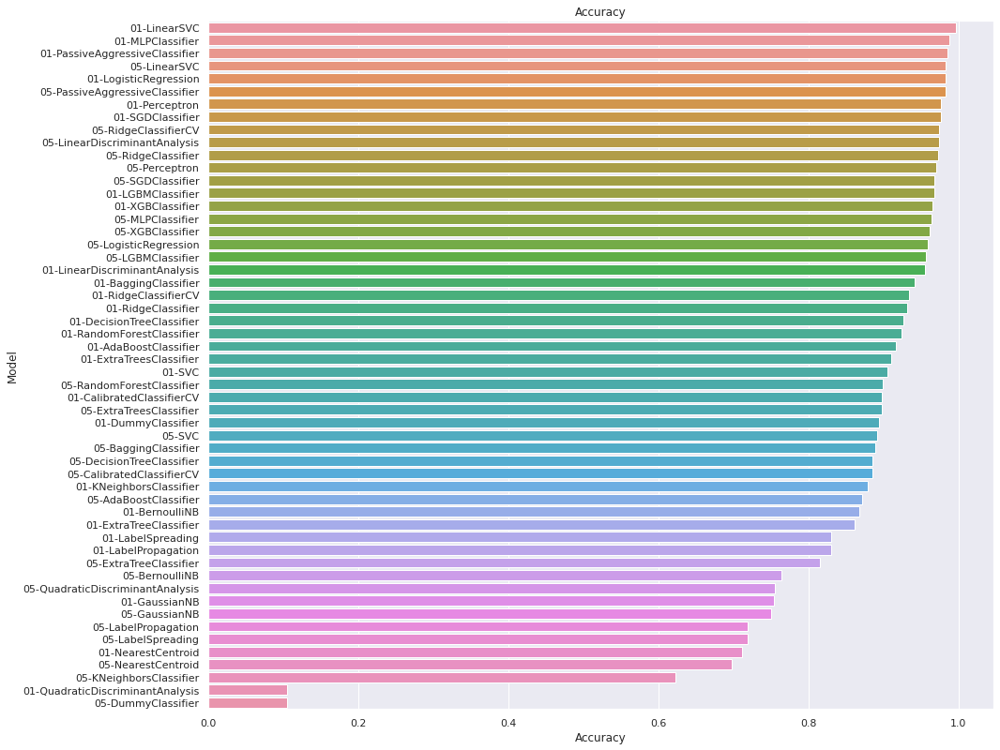

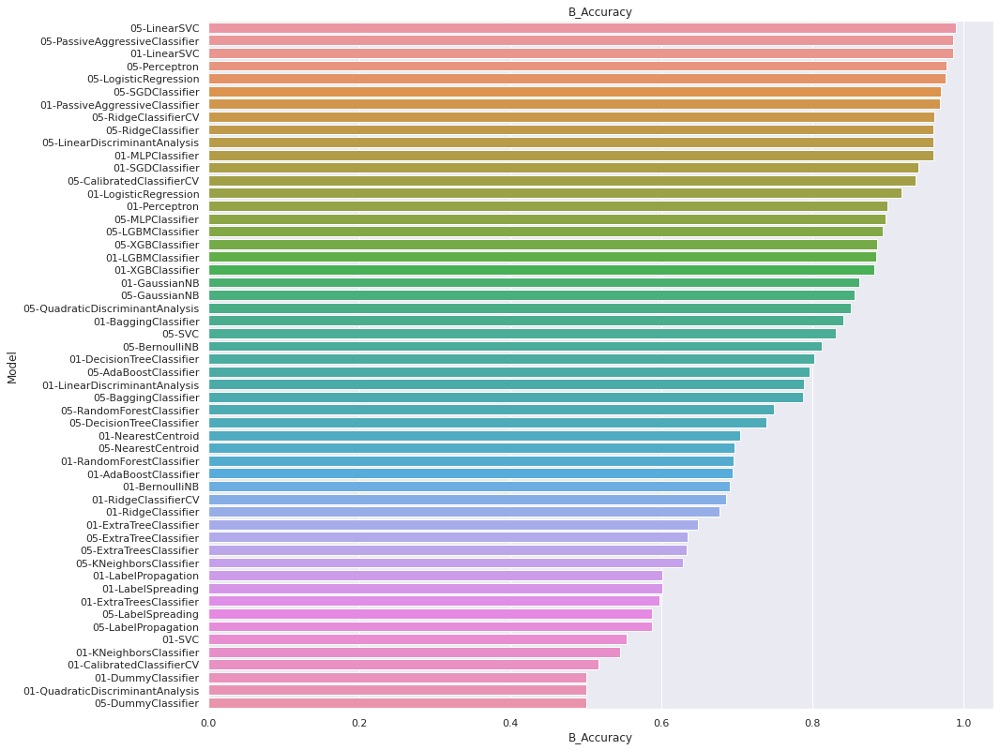

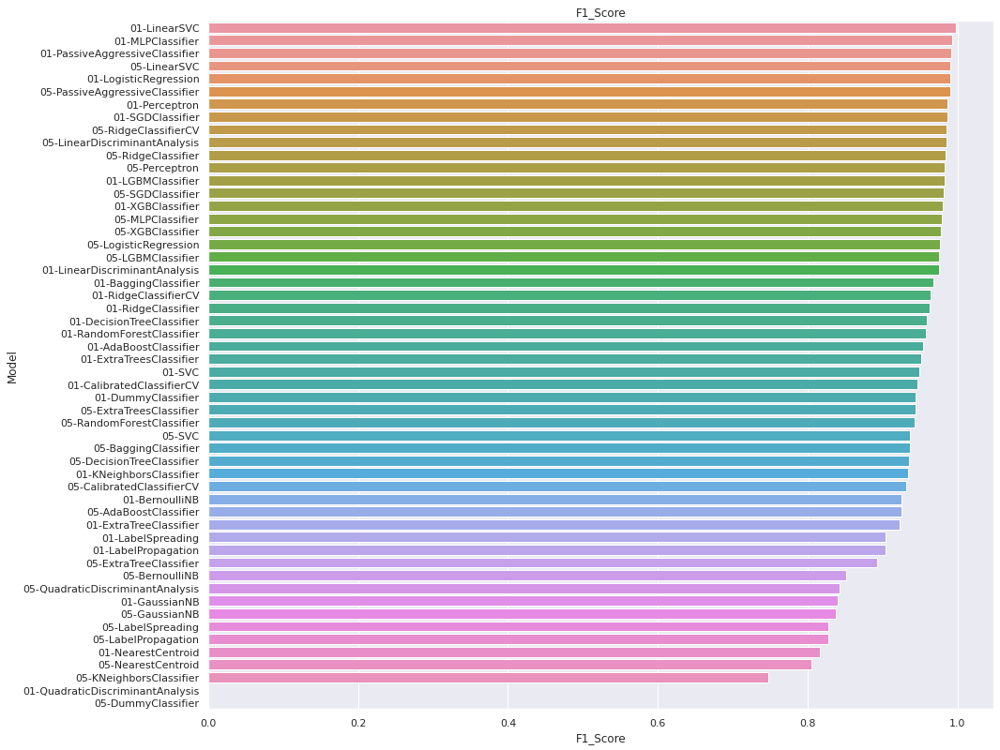

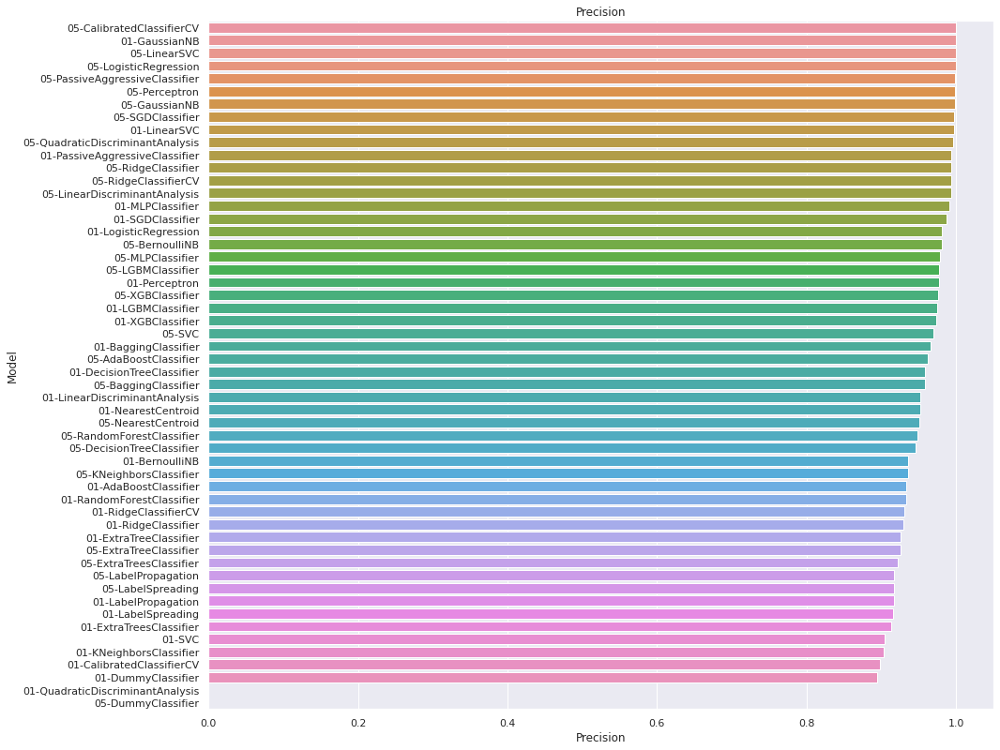

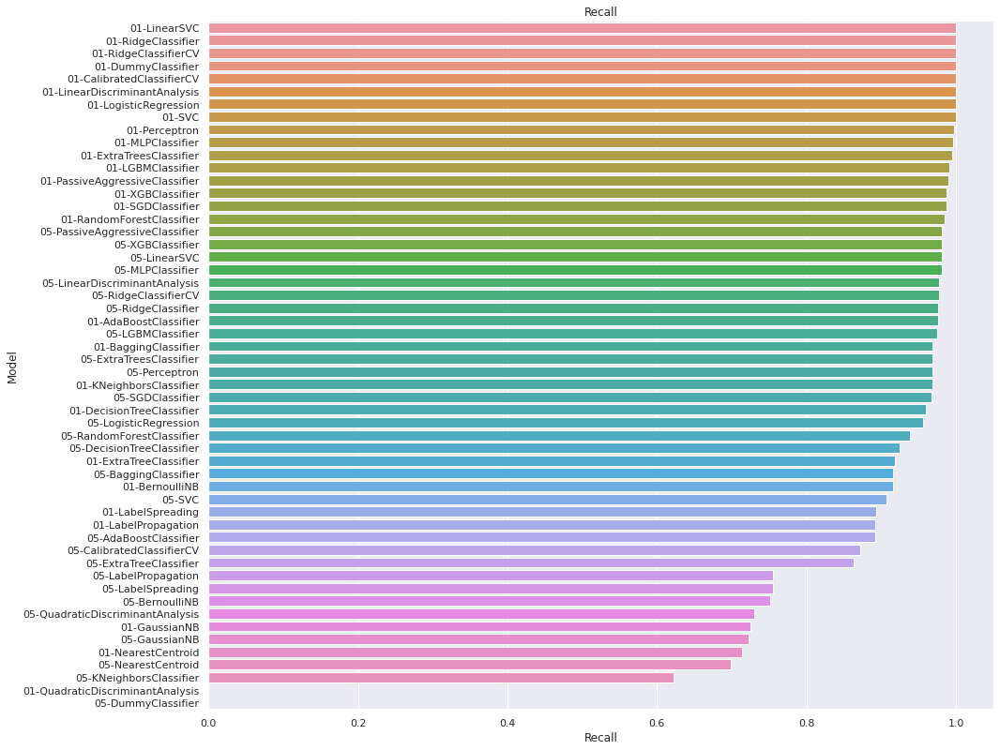

...

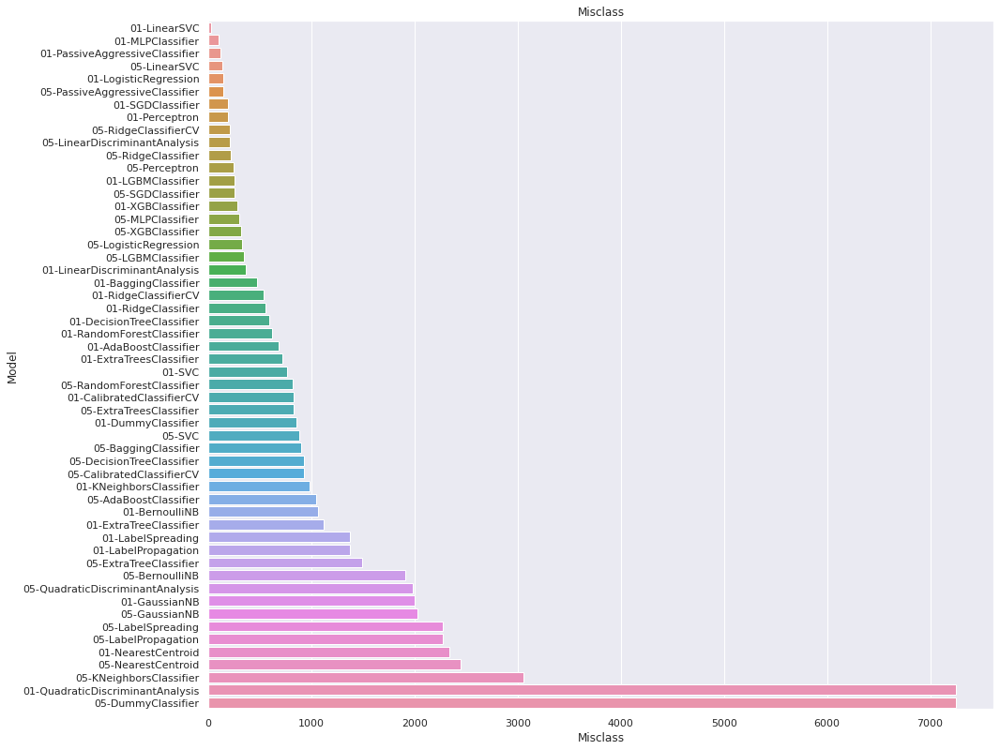

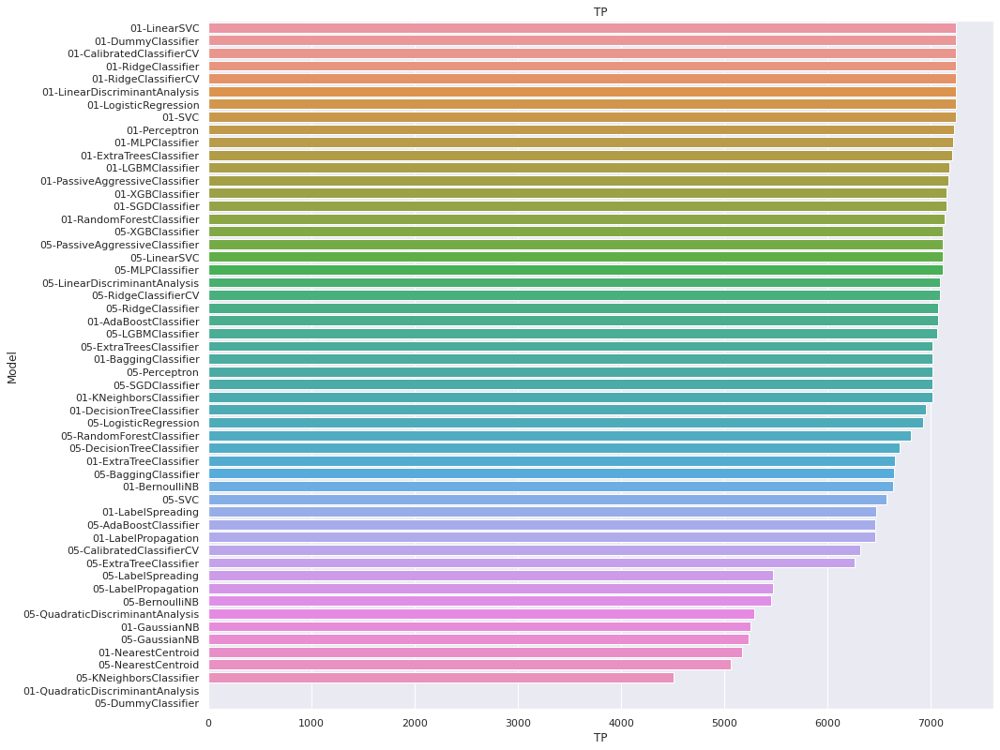

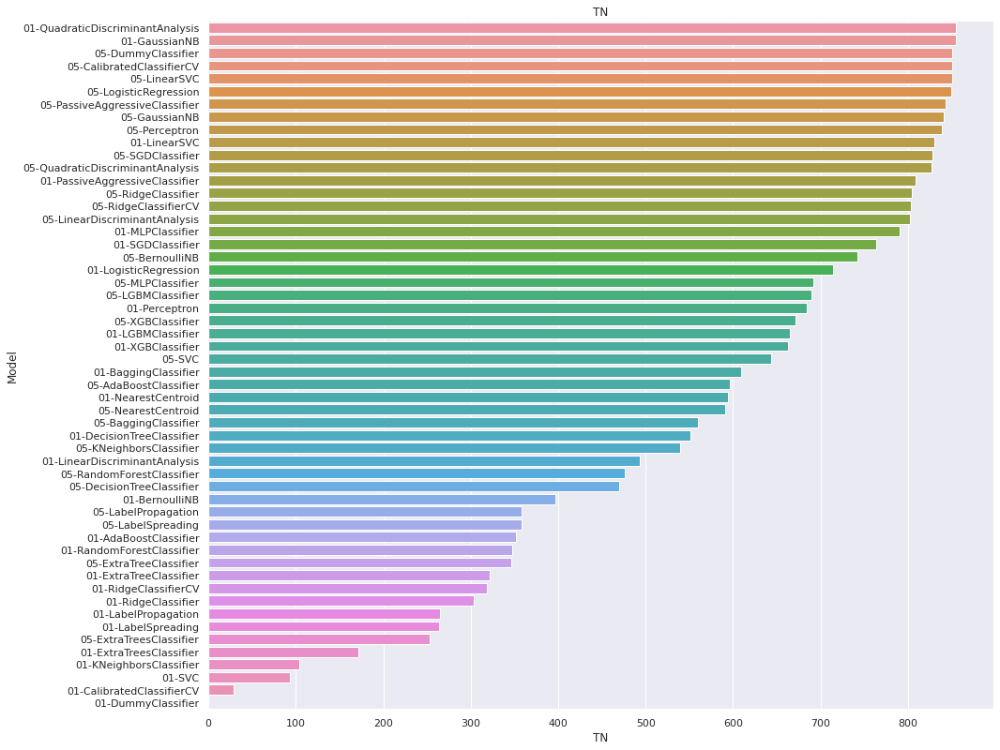

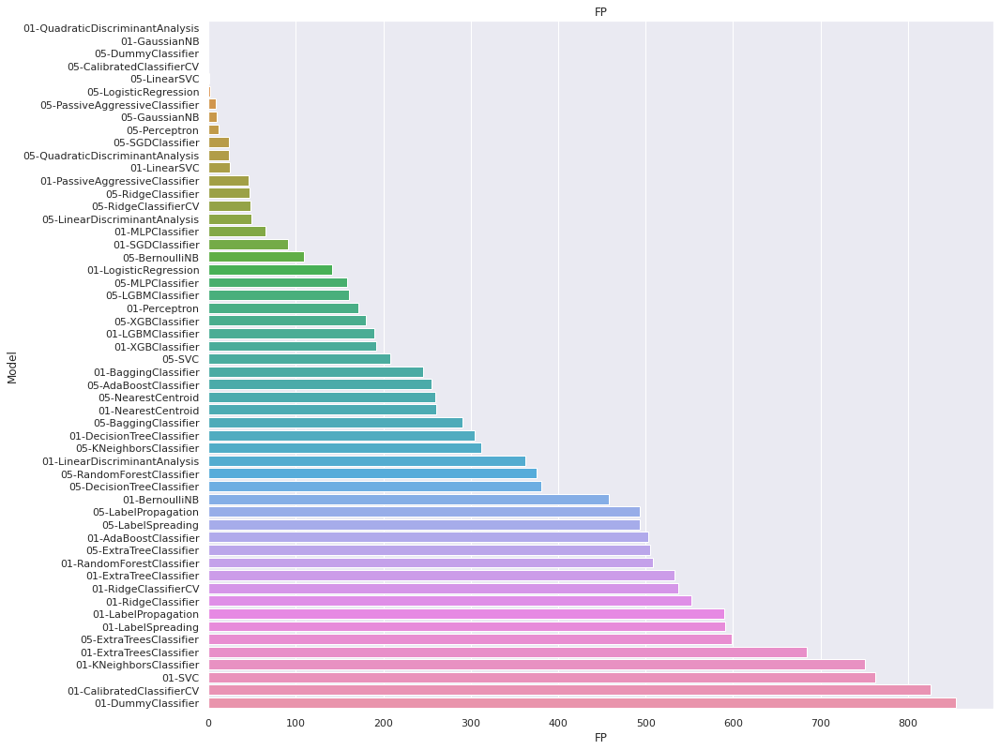

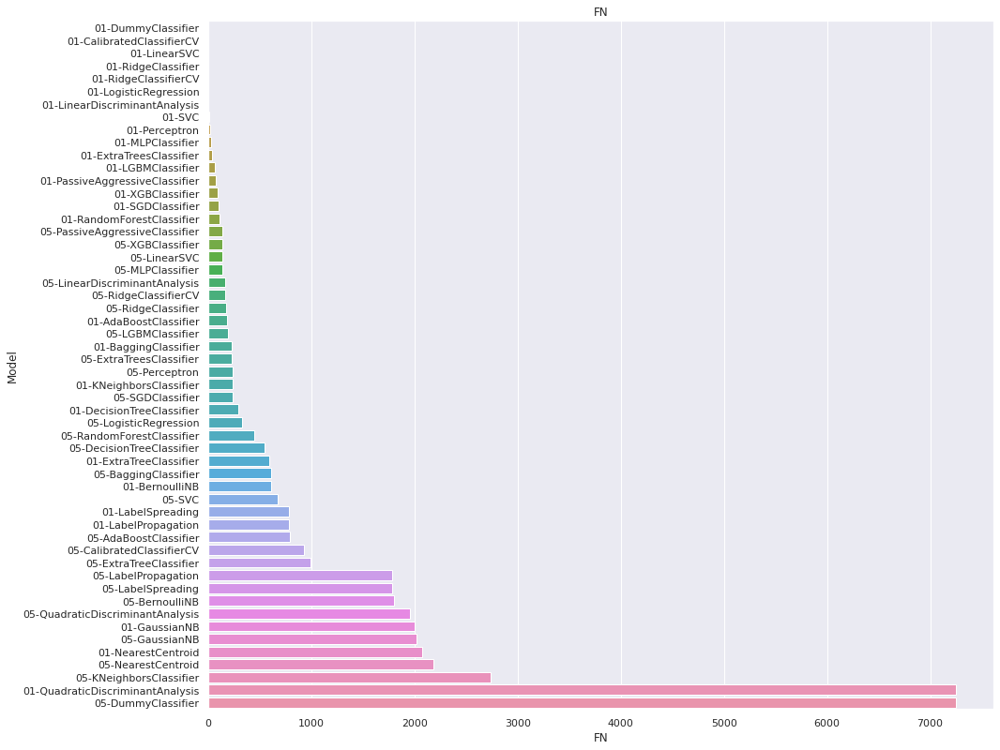

In [66]:
for metric in final_metrics_df_1_5.columns:
    if metric in ["FP_rate","Misclass_rate","Misclass","FP","FN"]:
        ascend=True
    else:
        ascend=False
    final_metrics_df_1_5.sort_values(by=metric, inplace=True, ascending=ascend)
    plt.figure(figsize = (15,final_metrics_df_1_5.shape[0]/4))
    sns.barplot(data=final_metrics_df_1_5, x = metric, y = final_metrics_df_1_5.index)
    plt.title(metric)
    plt_path = os.path.join(exe05_plots_path, metric + "_summary.png")
    plt.savefig(plt_path)
    plt.show()

# Exercise 6: 
  - Do not use the DepDelay variable when making predictions

In [67]:
mk_dir("exe06")
exe06_models_path = mk_dir("exe06/exe06_models")
exe06_tables_path = mk_dir("exe06/exe06_tables")
exe06_plots_path = mk_dir("exe06/exe06_plots")

Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe06
Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe06/exe06_models
Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe06/exe06_tables
Directory already existing: /content/drive/My Drive/Data_Science_amb_Python/Sprint10-Aprenentatge_Supervisat_Classificacio/Supervisat_Classificacio/exe06/exe06_plots


In [68]:
df = pd.read_csv("DelayedFlights_Engineered.csv", index_col=0)

In [69]:
X = df.drop(['ArrDelay', 'DepDelay'], axis = 'columns')
y = df['ArrDelay']

We scale the data and divide it into training and test sets

In [70]:
X = StandardScaler().fit_transform(X)

In [71]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=130)

We perform over-sampling using SMOTE.

In [72]:
sm = SMOTE(random_state=130)
X_train, y_train = sm.fit_resample(X_train, y_train)

Train models and make predictions.


23:20:17: Loading model:	06-DummyClassifier.pkl

23:20:17: Evaluate model:

Confusion matrix :
[[ 851    0]
 [7252    0]]
Normalized Confusion matrix:
[[1. 0.]
 [1. 0.]]


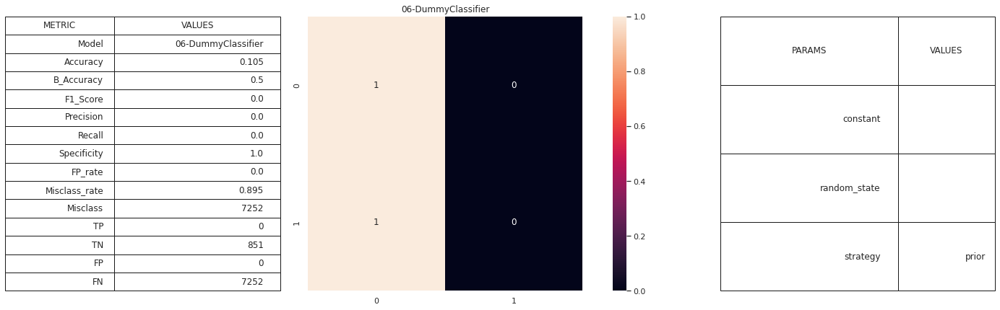


23:20:18: Loading model:	06-KNeighborsClassifier.pkl

23:20:18: Evaluate model:

Confusion matrix :
[[ 529  322]
 [2777 4475]]
Normalized Confusion matrix:
[[0.62162162 0.37837838]
 [0.38292885 0.61707115]]


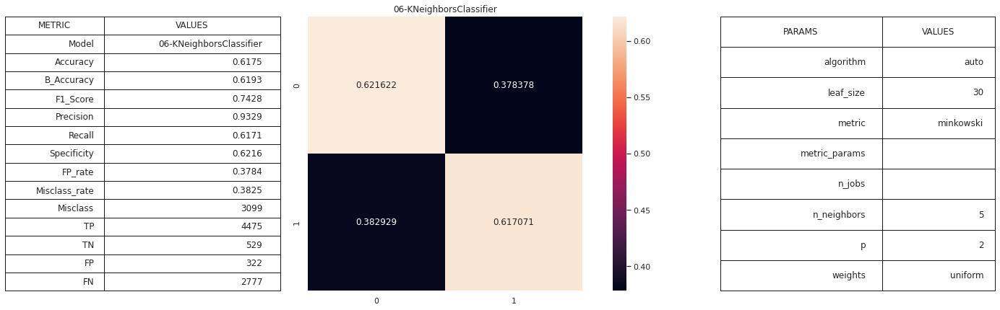


23:20:23: Loading model:	06-SVC.pkl

23:20:23: Evaluate model:

Confusion matrix :
[[ 629  222]
 [ 726 6526]]
Normalized Confusion matrix:
[[0.73913043 0.26086957]
 [0.10011031 0.89988969]]


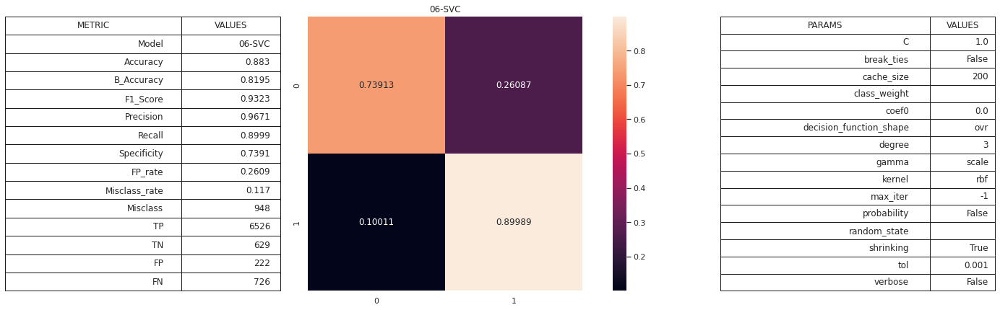


23:20:30: Loading model:	06-DecisionTreeClassifier.pkl

23:20:30: Evaluate model:

Confusion matrix :
[[ 402  449]
 [ 679 6573]]
Normalized Confusion matrix:
[[0.47238543 0.52761457]
 [0.09362934 0.90637066]]


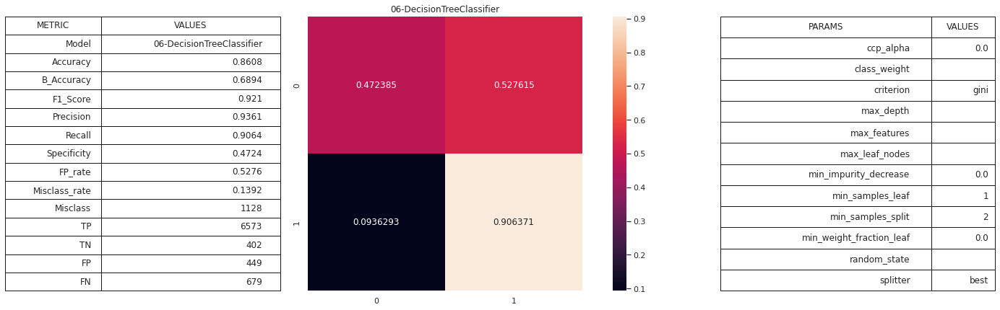


23:20:31: Loading model:	06-RandomForestClassifier.pkl

23:20:31: Evaluate model:

Confusion matrix :
[[ 350  501]
 [ 405 6847]]
Normalized Confusion matrix:
[[0.41128085 0.58871915]
 [0.05584666 0.94415334]]


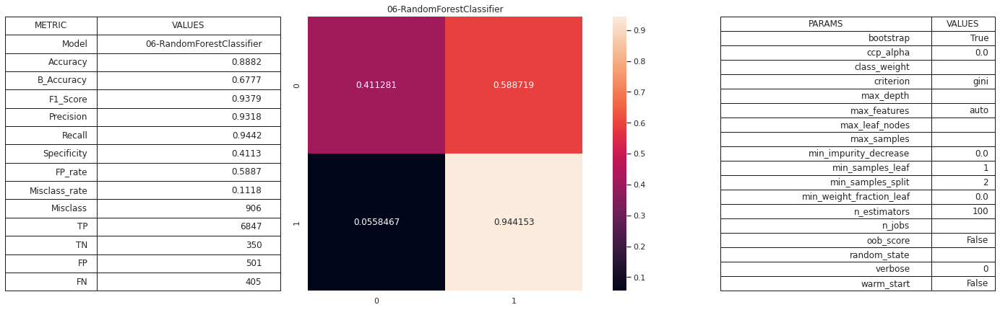


23:20:33: Loading model:	06-MLPClassifier.pkl

23:20:33: Evaluate model:

Confusion matrix :
[[ 658  193]
 [ 179 7073]]
Normalized Confusion matrix:
[[0.77320799 0.22679201]
 [0.02468285 0.97531715]]


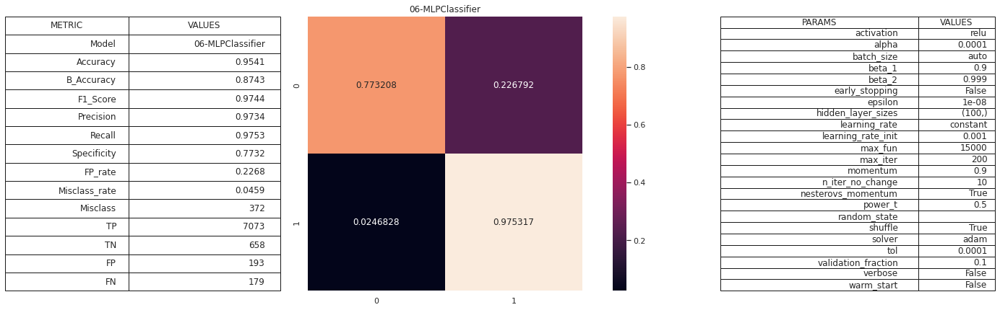


23:20:34: Loading model:	06-AdaBoostClassifier.pkl

23:20:34: Evaluate model:

Confusion matrix :
[[ 564  287]
 [ 943 6309]]
Normalized Confusion matrix:
[[0.66274971 0.33725029]
 [0.13003309 0.86996691]]


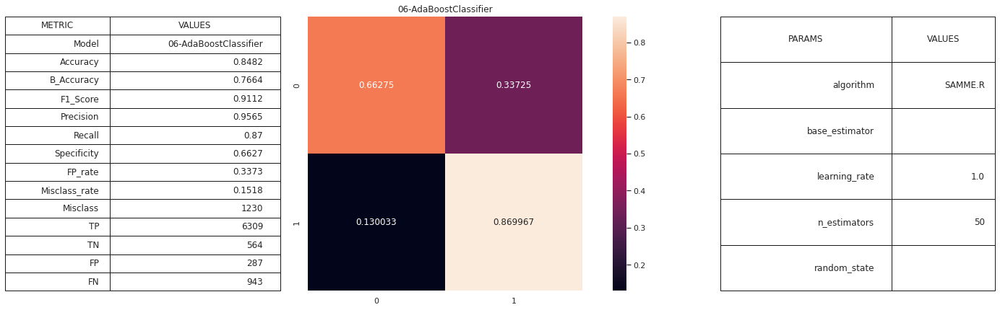


23:20:35: Loading model:	06-GaussianNB.pkl

23:20:35: Evaluate model:

Confusion matrix :
[[ 841   10]
 [2017 5235]]
Normalized Confusion matrix:
[[0.98824912 0.01175088]
 [0.27813017 0.72186983]]


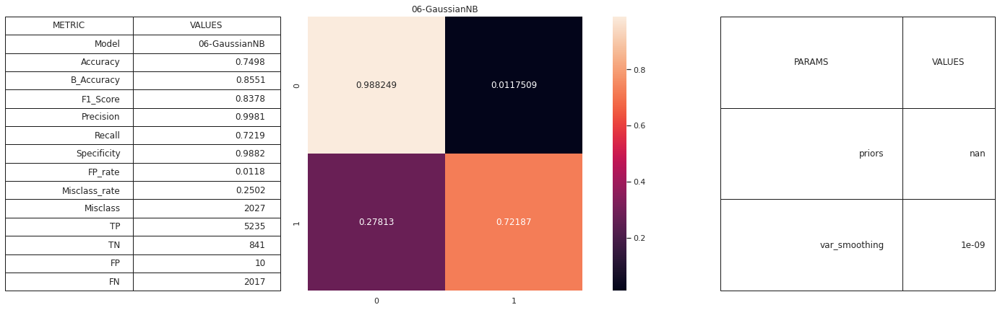


23:20:36: Loading model:	06-QuadraticDiscriminantAnalysis.pkl

23:20:36: Evaluate model:

Confusion matrix :
[[ 845    6]
 [2020 5232]]
Normalized Confusion matrix:
[[0.99294947 0.00705053]
 [0.27854385 0.72145615]]


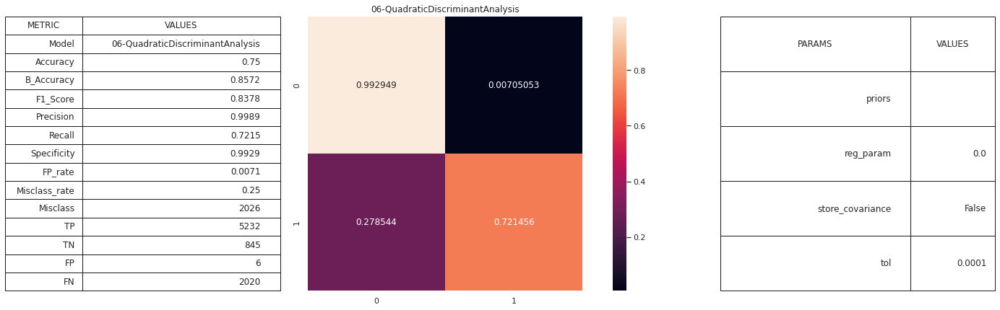


23:20:37: Loading model:	06-NearestCentroid.pkl

23:20:37: Evaluate model:

Confusion matrix :
[[ 537  314]
 [2161 5091]]
Normalized Confusion matrix:
[[0.63102233 0.36897767]
 [0.29798676 0.70201324]]


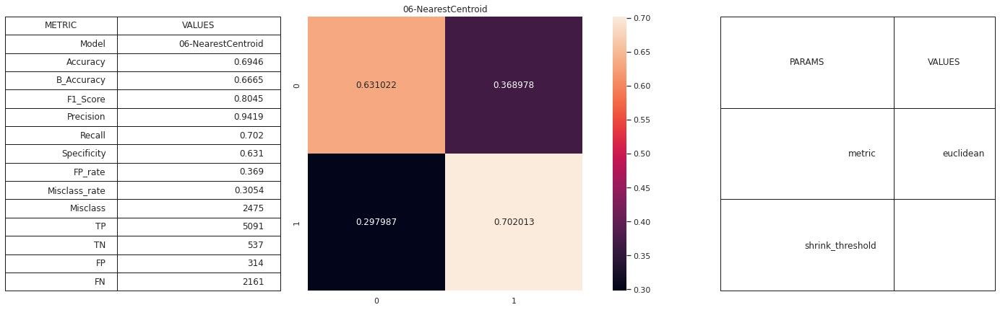


23:20:38: Loading model:	06-BaggingClassifier.pkl

23:20:38: Evaluate model:

Confusion matrix :
[[ 497  354]
 [ 716 6536]]
Normalized Confusion matrix:
[[0.5840188  0.4159812 ]
 [0.09873138 0.90126862]]


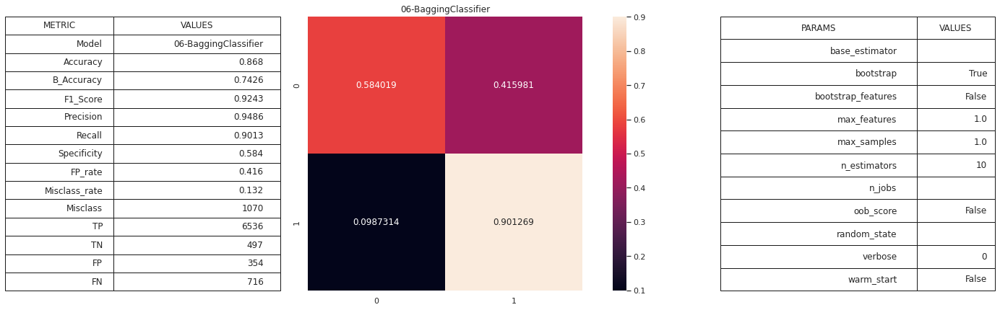


23:20:39: Loading model:	06-Perceptron.pkl

23:20:39: Evaluate model:

Confusion matrix :
[[ 694  157]
 [ 639 6613]]
Normalized Confusion matrix:
[[0.81551116 0.18448884]
 [0.08811362 0.91188638]]


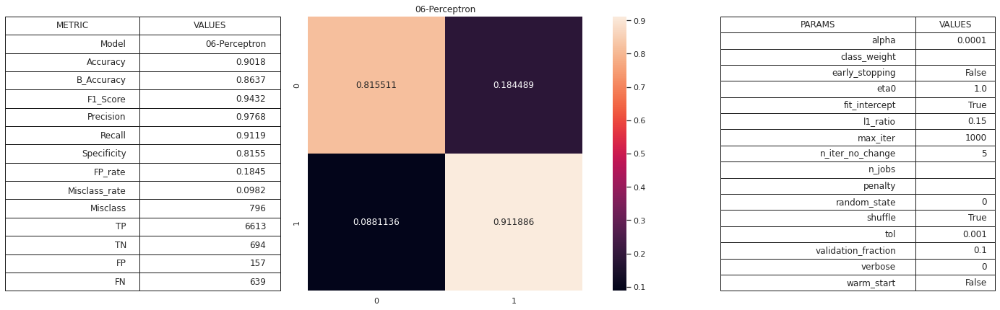


23:20:40: Loading model:	06-PassiveAggressiveClassifier.pkl

23:20:40: Evaluate model:

Confusion matrix :
[[ 761   90]
 [ 935 6317]]
Normalized Confusion matrix:
[[0.89424207 0.10575793]
 [0.12892995 0.87107005]]


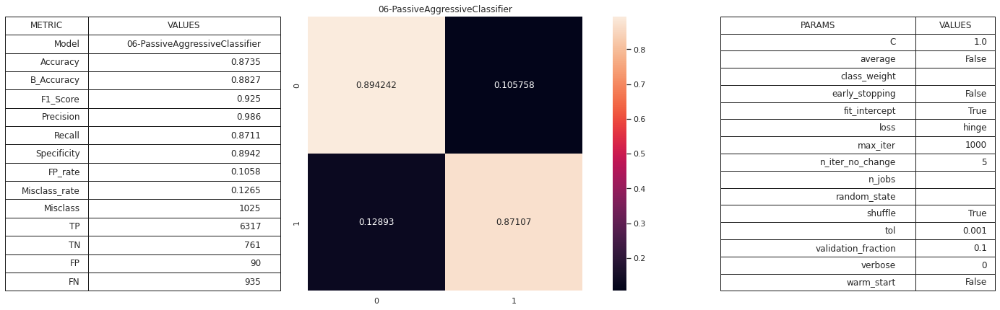


23:20:41: Loading model:	06-ExtraTreeClassifier.pkl

23:20:41: Evaluate model:

Confusion matrix :
[[ 329  522]
 [1175 6077]]
Normalized Confusion matrix:
[[0.386604   0.613396  ]
 [0.16202427 0.83797573]]


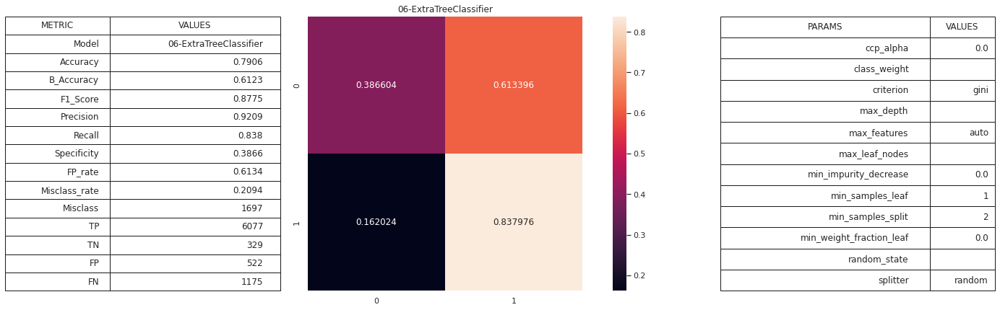


23:20:42: Loading model:	06-LabelSpreading.pkl

23:20:42: Evaluate model:

Confusion matrix :
[[ 344  507]
 [1759 5493]]
Normalized Confusion matrix:
[[0.40423032 0.59576968]
 [0.24255378 0.75744622]]


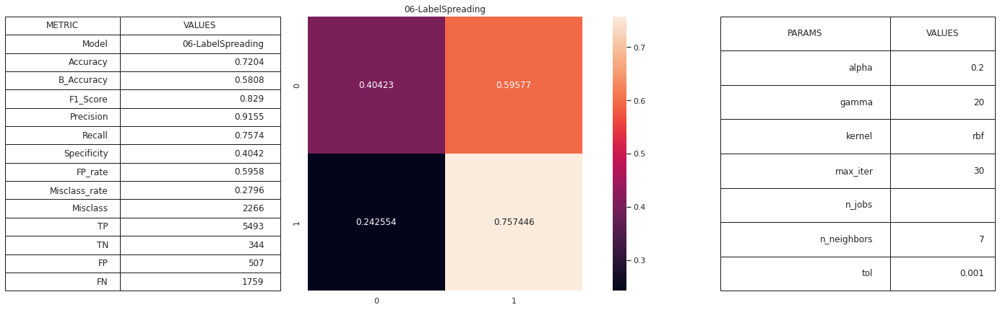


23:20:48: Loading model:	06-LabelPropagation.pkl

23:20:48: Evaluate model:

Confusion matrix :
[[ 344  507]
 [1759 5493]]
Normalized Confusion matrix:
[[0.40423032 0.59576968]
 [0.24255378 0.75744622]]


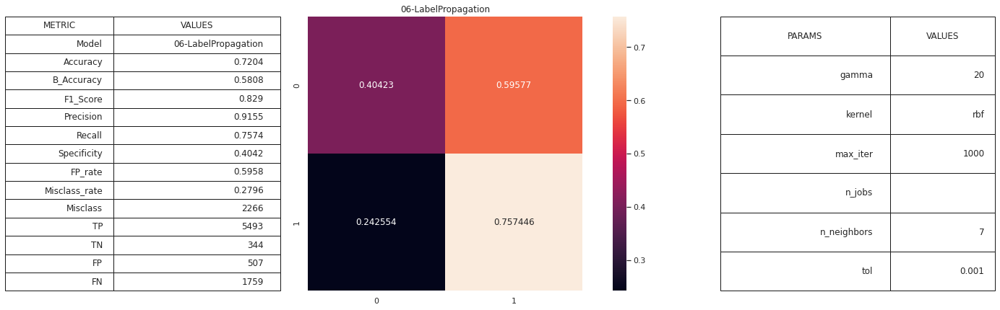


23:20:54: Loading model:	06-LogisticRegression.pkl

23:20:54: Evaluate model:

Confusion matrix :
[[ 821   30]
 [ 789 6463]]
Normalized Confusion matrix:
[[0.96474736 0.03525264]
 [0.10879757 0.89120243]]


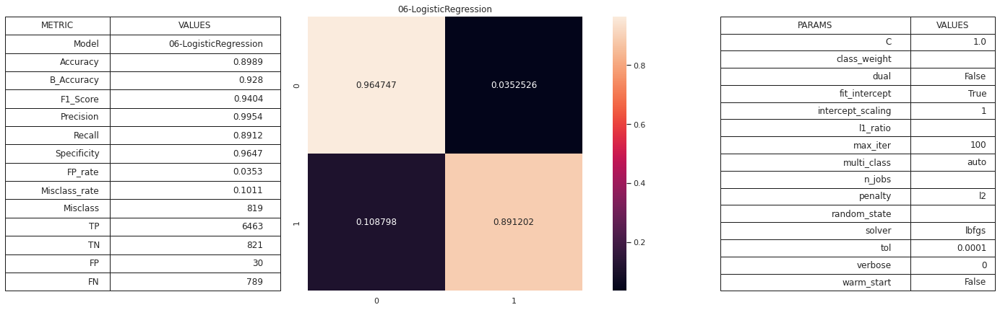


23:20:55: Loading model:	06-SGDClassifier.pkl

23:20:55: Evaluate model:

Confusion matrix :
[[ 801   50]
 [ 828 6424]]
Normalized Confusion matrix:
[[0.94124559 0.05875441]
 [0.1141754  0.8858246 ]]


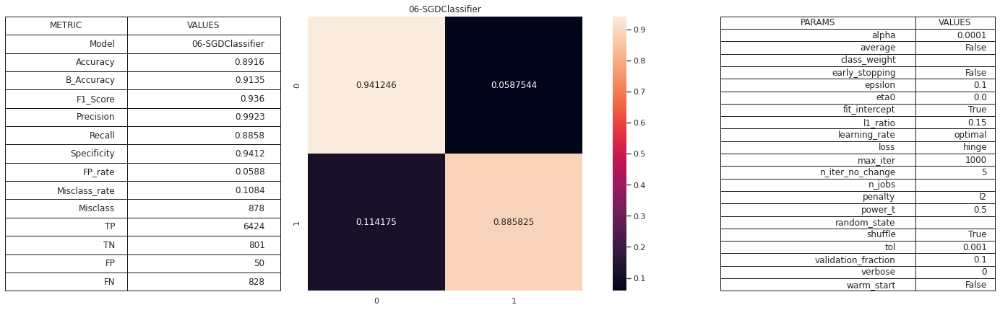


23:20:57: Loading model:	06-LinearDiscriminantAnalysis.pkl

23:20:57: Evaluate model:

Confusion matrix :
[[ 792   59]
 [1549 5703]]
Normalized Confusion matrix:
[[0.9306698  0.0693302 ]
 [0.21359625 0.78640375]]


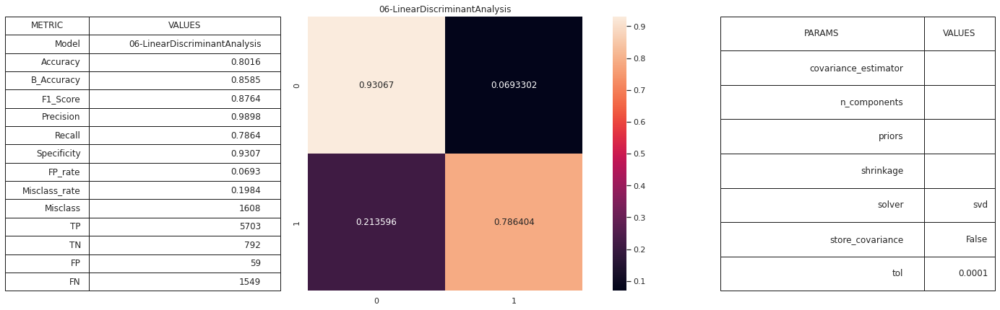


23:20:58: Loading model:	06-CalibratedClassifierCV.pkl

23:20:58: Evaluate model:

Confusion matrix :
[[ 851    0]
 [2054 5198]]
Normalized Confusion matrix:
[[1.         0.        ]
 [0.28323221 0.71676779]]


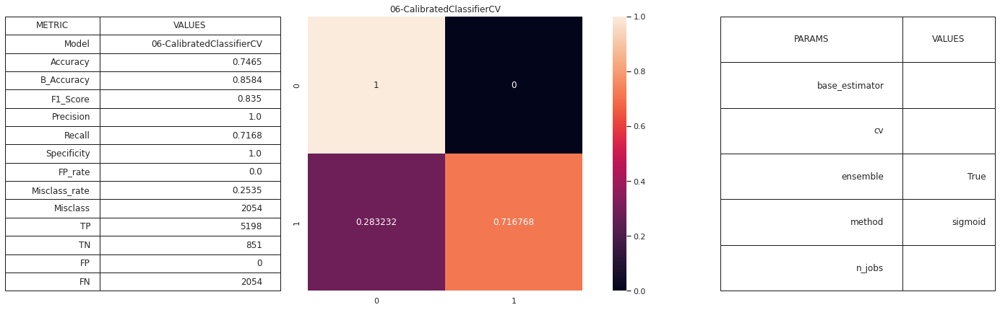


23:20:59: Loading model:	06-RidgeClassifier.pkl

23:20:59: Evaluate model:

Confusion matrix :
[[ 791   60]
 [1553 5699]]
Normalized Confusion matrix:
[[0.92949471 0.07050529]
 [0.21414782 0.78585218]]


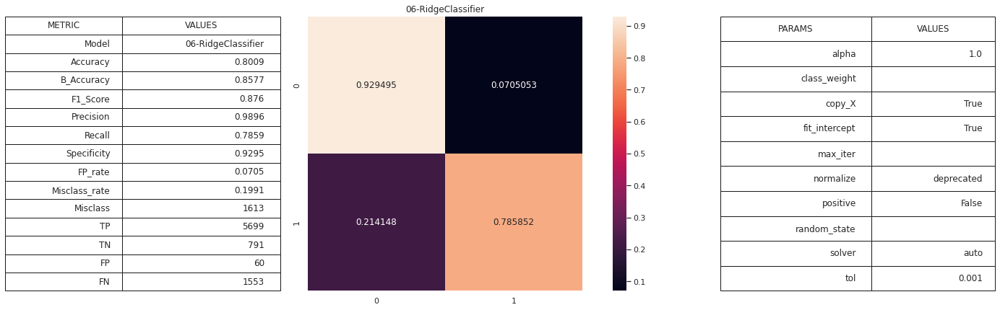


23:21:00: Loading model:	06-RidgeClassifierCV.pkl

23:21:00: Evaluate model:

Confusion matrix :
[[ 791   60]
 [1553 5699]]
Normalized Confusion matrix:
[[0.92949471 0.07050529]
 [0.21414782 0.78585218]]


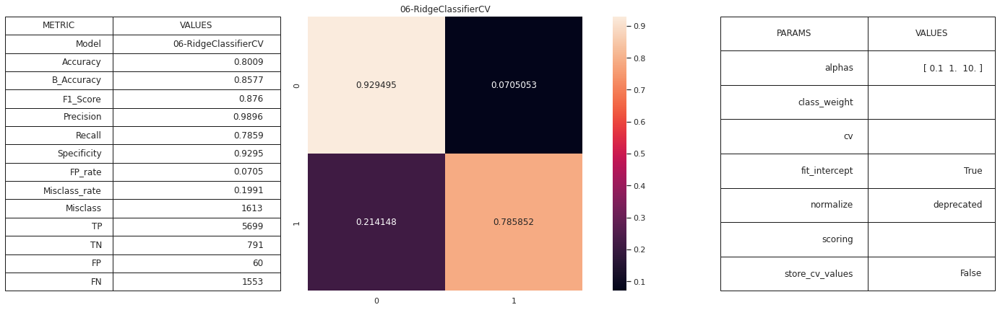


23:21:01: Loading model:	06-LinearSVC.pkl

23:21:01: Evaluate model:

Confusion matrix :
[[ 820   31]
 [ 714 6538]]
Normalized Confusion matrix:
[[0.96357227 0.03642773]
 [0.0984556  0.9015444 ]]


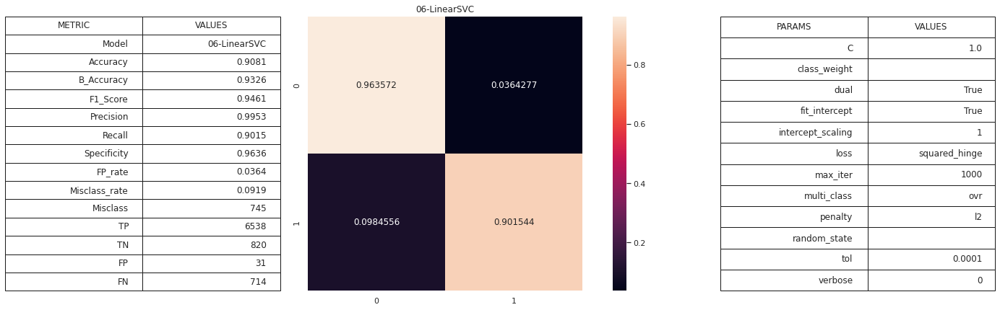


23:21:02: Loading model:	06-BernoulliNB.pkl

23:21:02: Evaluate model:

Confusion matrix :
[[ 674  177]
 [1520 5732]]
Normalized Confusion matrix:
[[0.7920094  0.2079906 ]
 [0.20959735 0.79040265]]


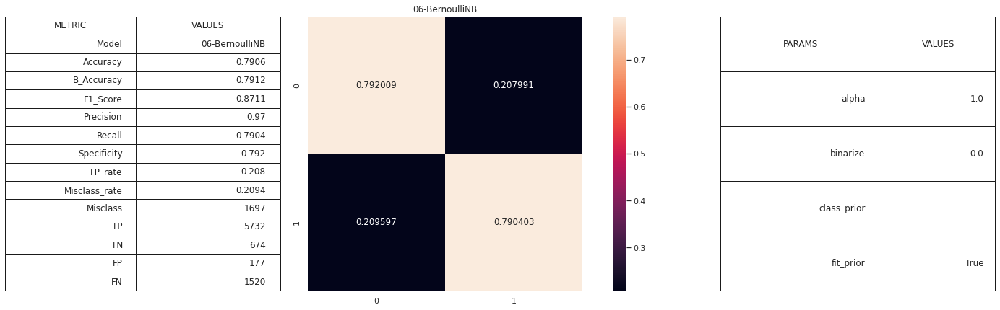


23:21:03: Loading model:	06-ExtraTreesClassifier.pkl

23:21:03: Evaluate model:

Confusion matrix :
[[ 179  672]
 [ 146 7106]]
Normalized Confusion matrix:
[[0.21034078 0.78965922]
 [0.02013238 0.97986762]]


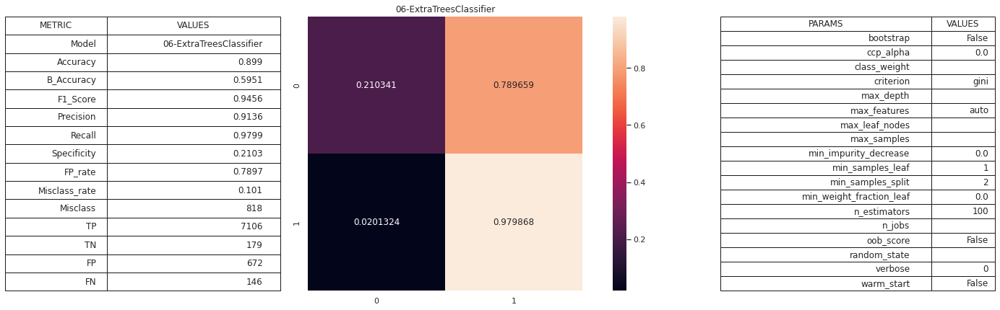


23:21:04: Loading model:	06-LGBMClassifier.pkl

23:21:04: Evaluate model:

Confusion matrix :
[[ 578  273]
 [ 226 7026]]
Normalized Confusion matrix:
[[0.67920094 0.32079906]
 [0.03116382 0.96883618]]


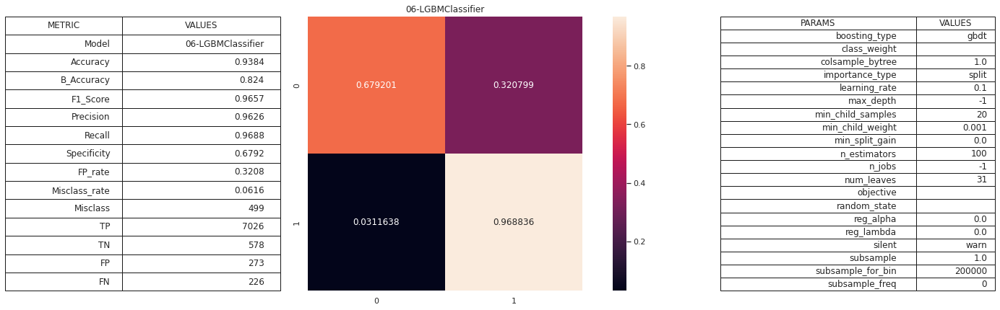


23:21:06: Loading model:	06-XGBClassifier.pkl

23:21:06: Evaluate model:

Confusion matrix :
[[ 607  244]
 [ 203 7049]]
Normalized Confusion matrix:
[[0.7132785  0.2867215 ]
 [0.02799228 0.97200772]]


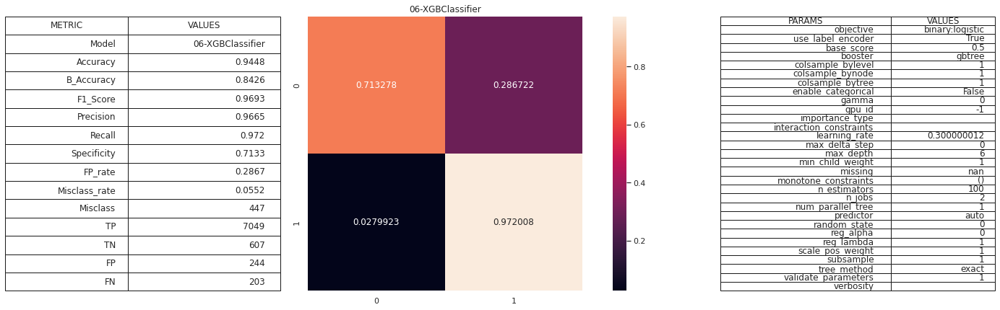

In [73]:
metrics_lst = []
for model in classifiers:
    # Model name 
    model_str = str(model).split("(")[0]
    model_name = '{}-{}'.format("06", model_str)
    # File name
    model_filename = model_name + ".pkl"
    model_filename_path = os.path.join(exe06_models_path, model_filename)
    if os.path.isfile(model_filename_path):
        # load existing model
        print("\n{}: Loading model:\t{}".format(timenow(), model_filename))
        model = pickle.load(open(model_filename_path, 'rb'))
    else:
        # Fit model
        print("\n{}: Start Fitting model:\t{}".format(timenow(), model_name))
        tiempo_inicio_fit = datetime.datetime.now()
        model.fit(X_train, y_train)
        fit_time = datetime.datetime.now() - tiempo_inicio_fit
        print("Fitting time:\t{}".format(fit_time))

        # save the model to disk
        pickle.dump(model, open(model_filename_path, 'wb'))

    # Evaluate model
    plt_path = os.path.join(exe06_plots_path, model_name + "_conf.png")
    print("\n{}: Evaluate model:\n".format(timenow()))
    metrics_lst.append(class_metrics(model, model_name, X_train, X_test, y_train, y_test, plt_path))
# Tabualate resulst
class_metrics_df = pd.DataFrame(metrics_lst)
class_metrics_df.set_index(keys="Model", inplace=True)
class_metrics_df.sort_values(by=["Accuracy"], ascending=False, inplace=True)
# Save results
class_metrics_df.to_csv(os.path.join(exe06_tables_path, "06-classification_metrics.csv"))

To see the effects of missing the "DepDelay" variable on the predictions we will compare the results with those of exercise 5.

We combine the results of the two exercises.

In [74]:
metrics_05_path = os.path.join(exe05_tables_path, "05-classification_metrics.csv")
metrics_06_path = os.path.join(exe06_tables_path, "06-classification_metrics.csv")
metrics_lst = []
for metrics_file in [metrics_06_path, metrics_05_path]:
    
    all_metrics = pd.read_csv(metrics_file, index_col=0)
    metrics_lst.append(all_metrics)
final_metrics_df_5_6 = pd.concat(metrics_lst)

data_table.enable_dataframe_formatter()
data_table.DataTable(final_metrics_df_5_6, num_rows_per_page=final_metrics_df_5_6.shape[0])

,Accuracy,B_Accuracy,F1_Score,Precision,Recall,Specificity,FP_rate,Misclass_rate,Misclass,TP,TN,FP,FN
Model,,,,,,,,,,,,,
06-MLPClassifier,0.9541,0.8743,0.9744,0.9734,0.9753,0.7732,0.2268,0.0459,372,7073,658,193,179
06-XGBClassifier,0.9448,0.8426,0.9693,0.9665,0.9720,0.7133,0.2867,0.0552,447,7049,607,244,203
06-LGBMClassifier,0.9384,0.8240,0.9657,0.9626,0.9688,0.6792,0.3208,0.0616,499,7026,578,273,226
06-LinearSVC,0.9081,0.9326,0.9461,0.9953,0.9015,0.9636,0.0364,0.0919,745,6538,820,31,714
06-Perceptron,0.9018,0.8637,0.9432,0.9768,0.9119,0.8155,0.1845,0.0982,796,6613,694,157,639
06-ExtraTreesClassifier,0.8990,0.5951,0.9456,0.9136,0.9799,0.2103,0.7897,0.1010,818,7106,179,672,146
06-LogisticRegression,0.8989,0.9280,0.9404,0.9954,0.8912,0.9647,0.0353,0.1011,819,6463,821,30,789
06-SGDClassifier,0.8916,0.9135,0.9360,0.9923,0.8858,0.9412,0.0588,0.1084,878,6424,801,50,828
06-RandomForestClassifier,0.8882,0.6777,0.9379,0.9318,0.9442,0.4113,0.5887,0.1118,906,6847,350,501,405


We print the model that obtains the best metric.

In [75]:
for model in classifiers:
    # Model name 
    model_str = str(model).split("(")[0]
    models_metric = final_metrics_df_5_6.filter(regex=model_str, axis=0)
    print("\n{}: ".format(model_str))
    print("{:<15} {:<10}".format("METRIC","BEST MODEL"))
    print("{:<15} {:<10}".format("-"*10,"-"*10))
    for metric in models_metric.columns:
        if metric in ["FP_rate","Misclass_rate","Misclass","FP","FN"]:
            ascend=True
        else:
            ascend=False
        models_metric.sort_values(by=metric, inplace=True, ascending=ascend)
        print("{:<15} {:<10}".format(metric,models_metric.head(1).index[0]))


DummyClassifier: 
METRIC          BEST MODEL
----------      ----------
Accuracy        06-DummyClassifier
B_Accuracy      06-DummyClassifier
F1_Score        06-DummyClassifier
Precision       06-DummyClassifier
Recall          06-DummyClassifier
Specificity     06-DummyClassifier
FP_rate         06-DummyClassifier
Misclass_rate   06-DummyClassifier
Misclass        06-DummyClassifier
TP              06-DummyClassifier
TN              06-DummyClassifier
FP              06-DummyClassifier
FN              06-DummyClassifier

KNeighborsClassifier: 
METRIC          BEST MODEL
----------      ----------
Accuracy        05-KNeighborsClassifier
B_Accuracy      05-KNeighborsClassifier
F1_Score        05-KNeighborsClassifier
Precision       05-KNeighborsClassifier
Recall          05-KNeighborsClassifier
Specificity     05-KNeighborsClassifier
FP_rate         05-KNeighborsClassifier
Misclass_rate   05-KNeighborsClassifier
Misclass        05-KNeighborsClassifier
TP              05-KNeighborsClass

For each metric we plot the models ordered from best to worst result.

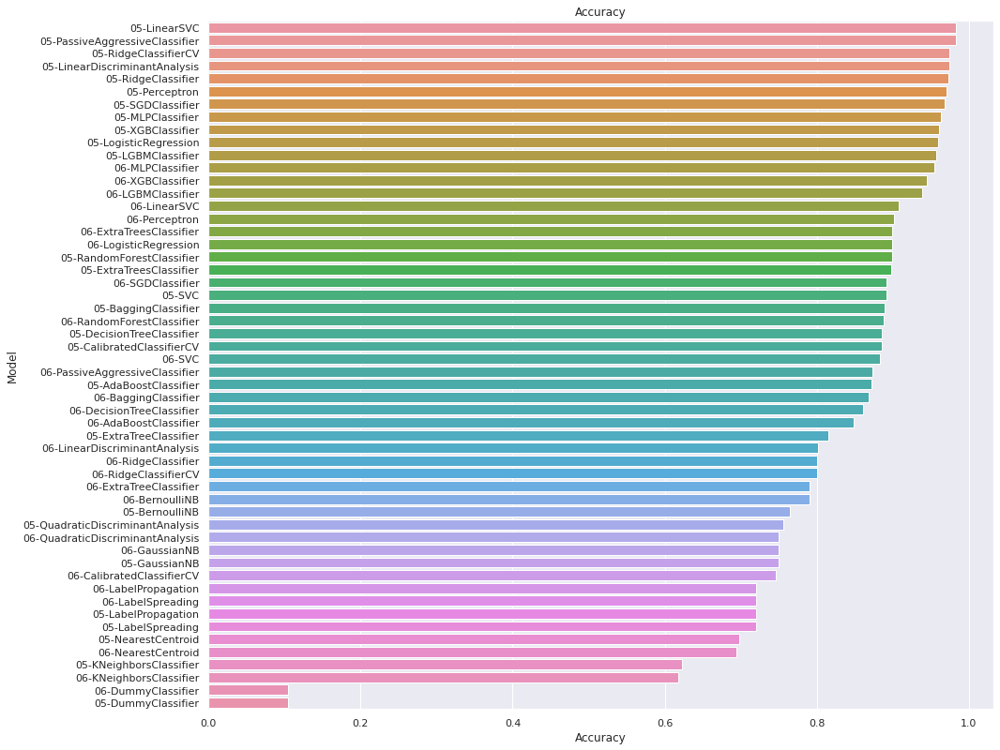

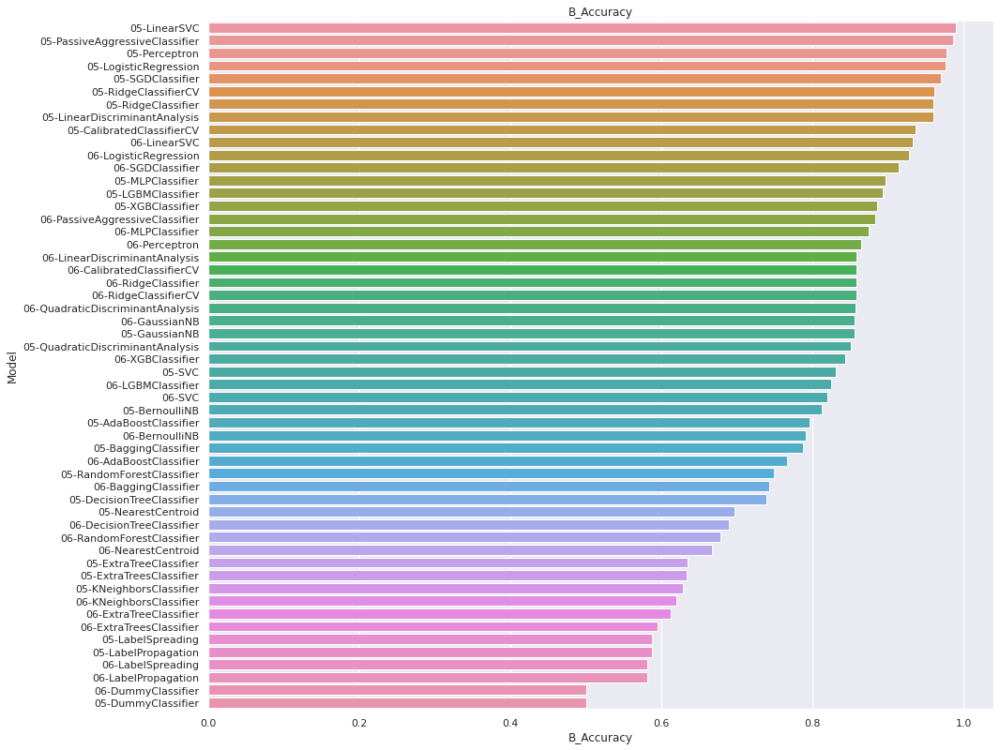

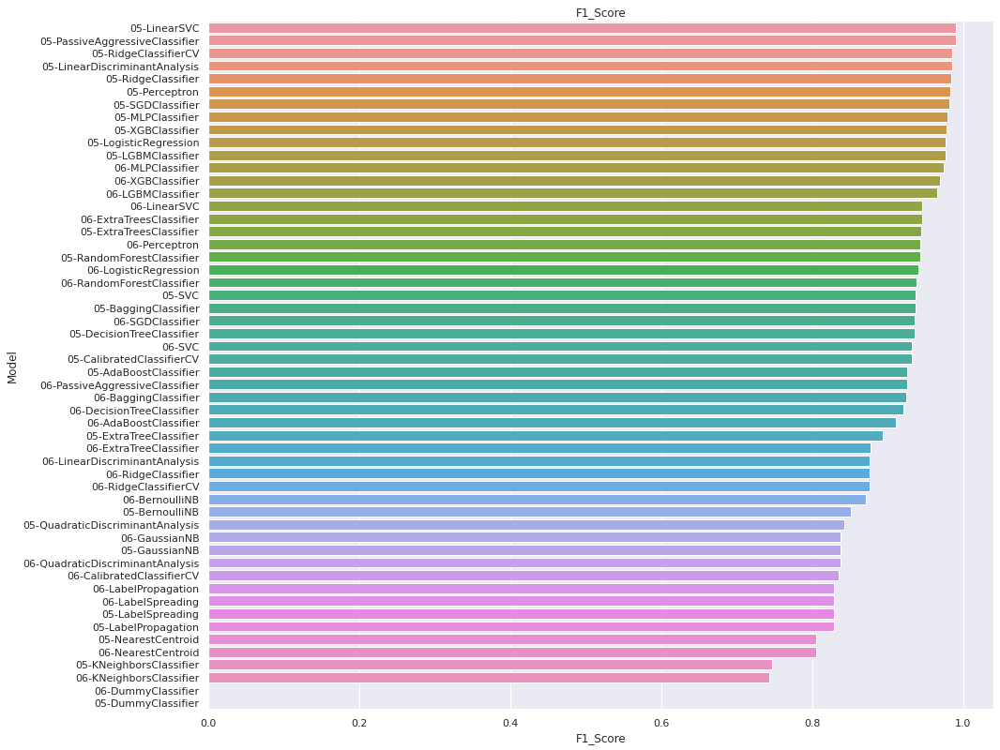

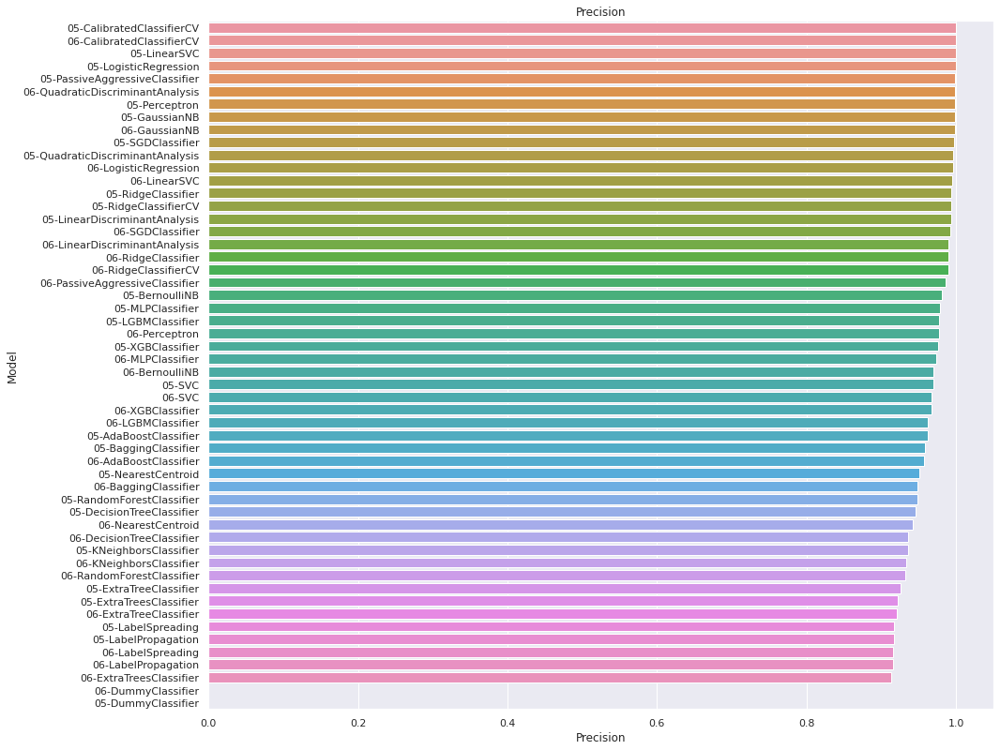

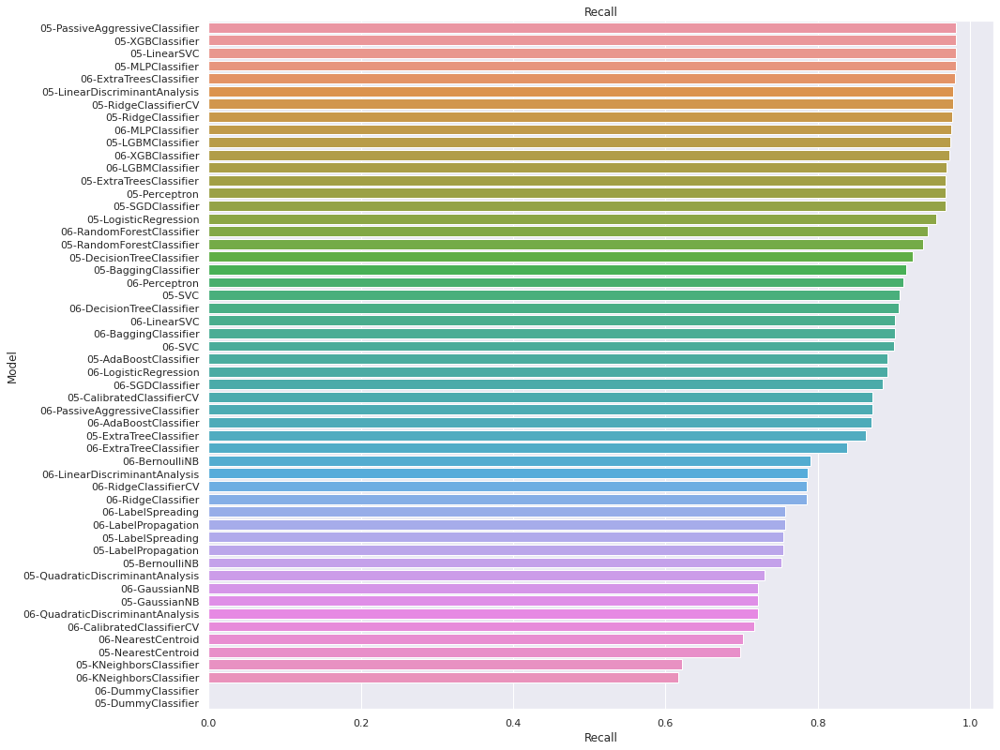

...

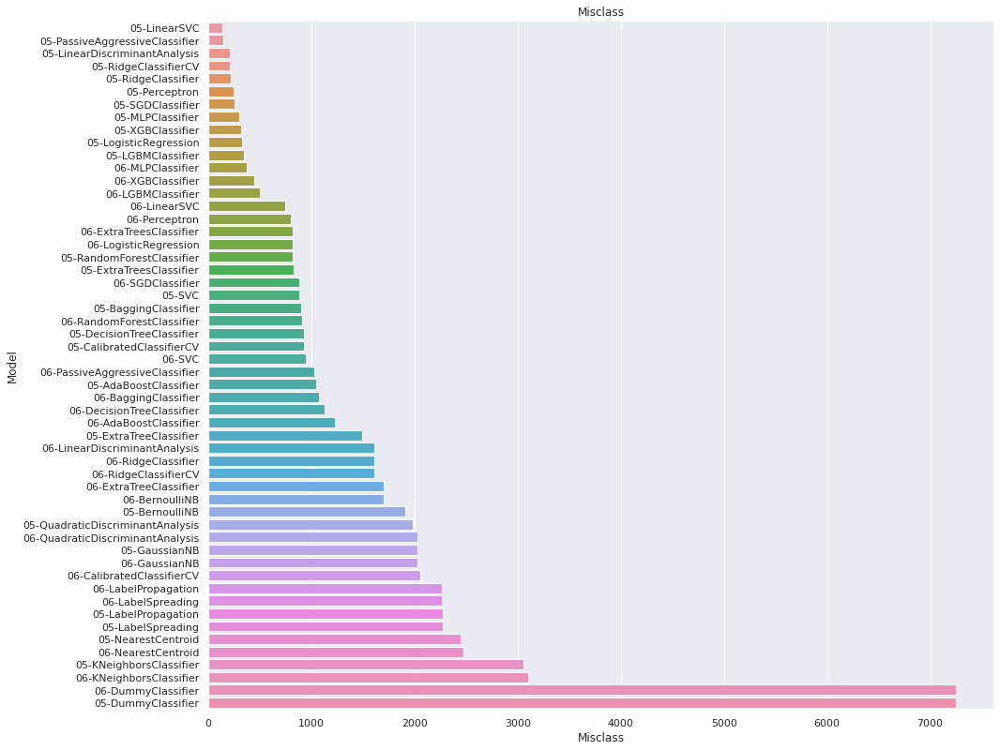

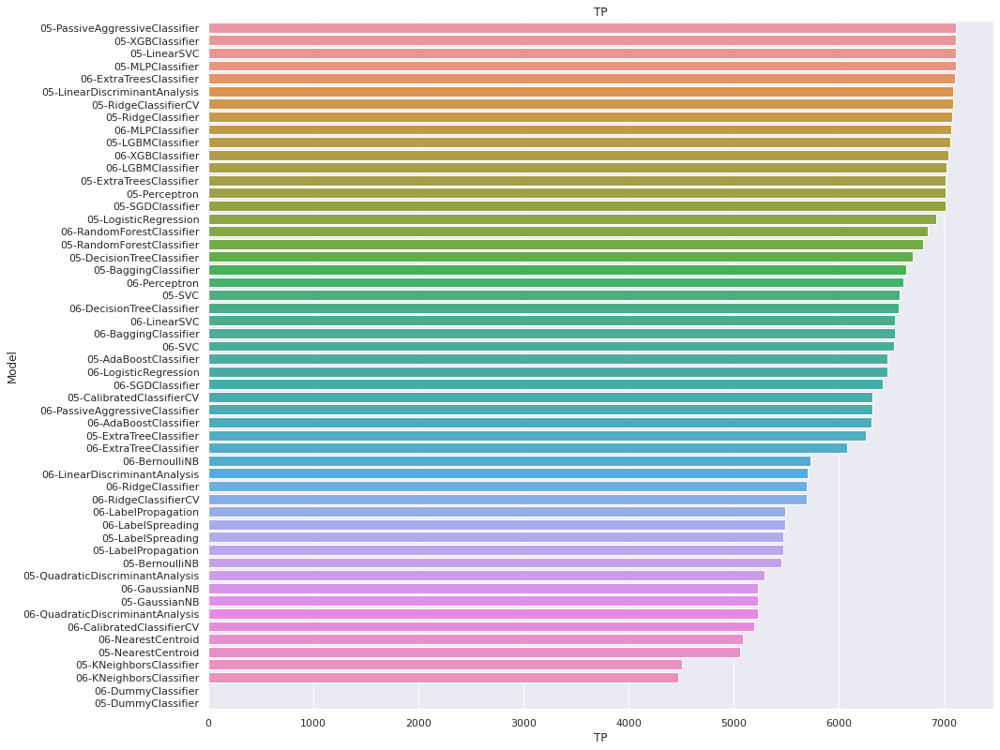

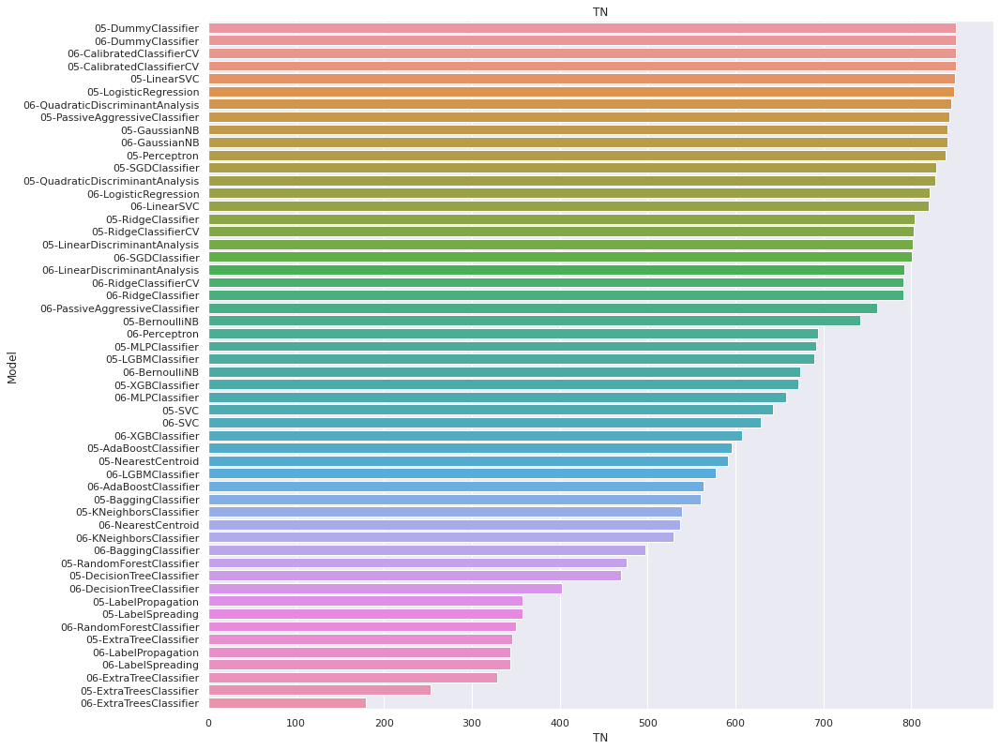

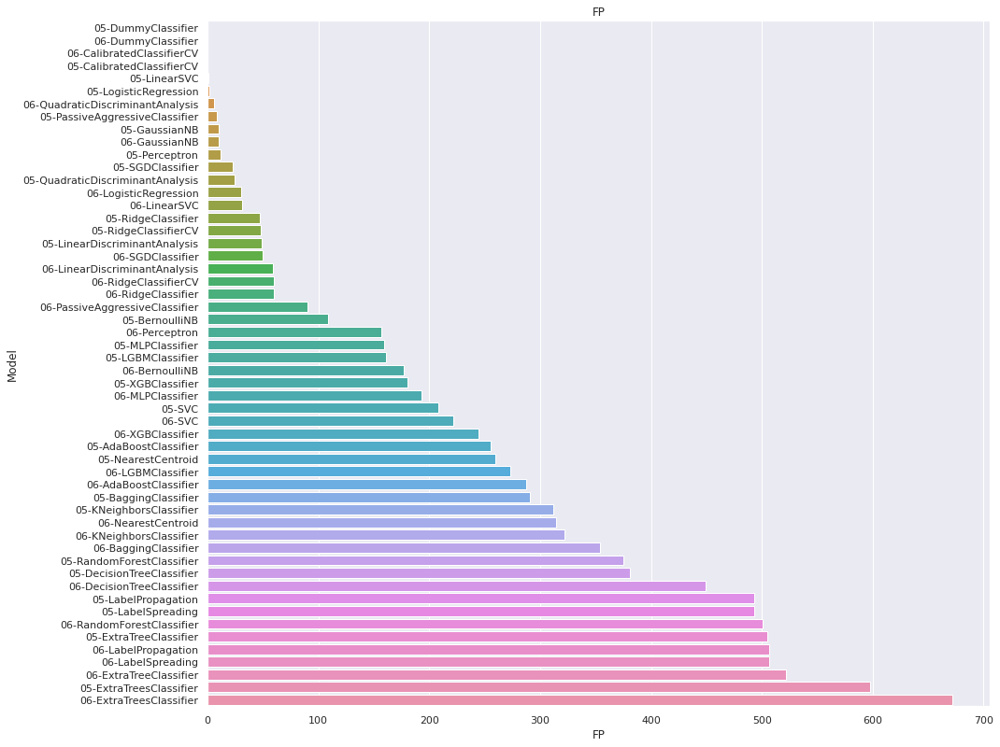

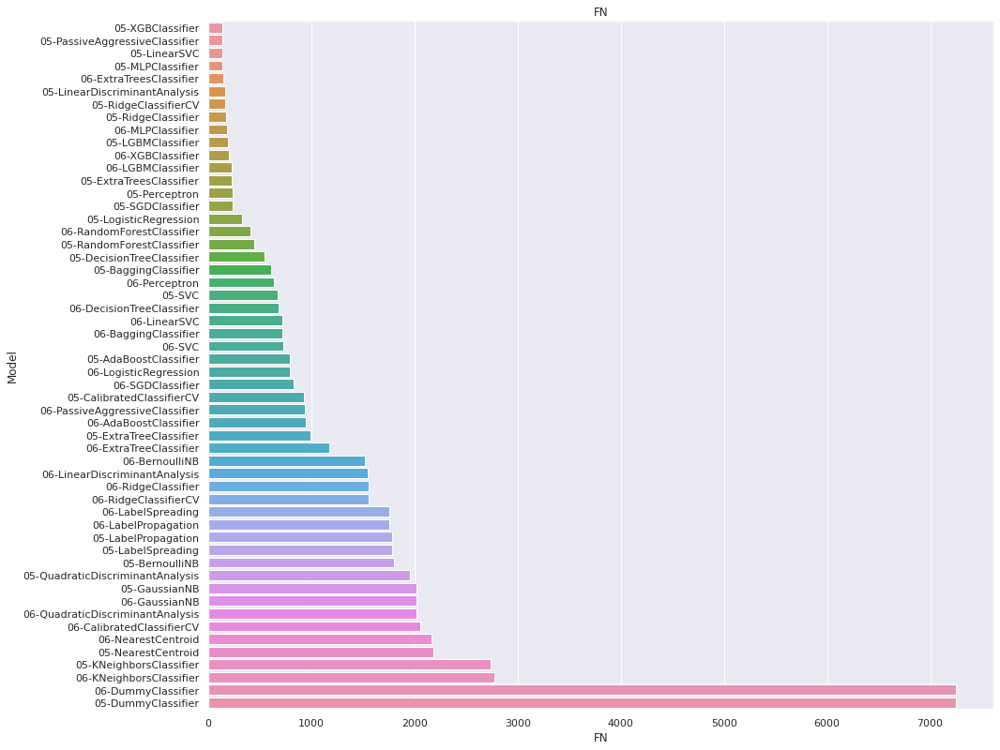

In [76]:
for metric in final_metrics_df_5_6.columns:
    if metric in ["FP_rate","Misclass_rate","Misclass","FP","FN"]:
        ascend=True
    else:
        ascend=False
    final_metrics_df_5_6.sort_values(by=metric, inplace=True, ascending=ascend)
    plt.figure(figsize = (15,final_metrics_df_5_6.shape[0]/4))
    sns.barplot(data=final_metrics_df_5_6, x = metric, y = final_metrics_df_5_6.index)
    plt.title(metric)
    plt_path = os.path.join(exe06_plots_path, metric + "_summary.png")
    plt.savefig(plt_path)
    plt.show()